In [1]:
# Cell 1: Imports and basic settings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter

# Plot settings
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.grid"] = True
sns.set(style="whitegrid")

RANDOM_STATE = 42


In [2]:
# Cell 2: Load data

DATA_PATH = r"C:\Users\admin\Desktop\Dataset\Validation_Data_by_AR.csv"  # update if needed

df = pd.read_csv(DATA_PATH)

print("Shape:", df.shape)
print("\nColumns:")
print(df.columns.tolist())

print("\nFirst 5 rows:")
display(df.head())


Shape: (95933, 32)

Columns:
['grad_mean', 'grad_std', 'grad_median', 'grad_min', 'grad_max', 'grad_skewness', 'grad_kurtosis', 'nl_length', 'nl_num_fragments', 'nl_grad_weighted_length', 'nl_curv_mean', 'nl_curv_std', 'nl_curv_median', 'nl_curv_min', 'nl_curv_max', 'nl_bend_energy_mean', 'nl_bend_energy_std', 'nl_bend_energy_median', 'nl_bend_energy_min', 'nl_bend_energy_max', 'wavelet_energy_1', 'wavelet_energy_2', 'wavelet_energy_3', 'wavelet_energy_4', 'wavelet_energy_5', 'flux_unsigned', 'flux_signed', 'flux_negative', 'flux_positive', 'class_label', 'flare_strength', 'image_path']

First 5 rows:


,grad_mean,grad_std,grad_median,grad_min,grad_max,grad_skewness,grad_kurtosis,nl_length,nl_num_fragments,nl_grad_weighted_length,...,wavelet_energy_3,wavelet_energy_4,wavelet_energy_5,flux_unsigned,flux_signed,flux_negative,flux_positive,class_label,flare_strength,image_path
0,0.088865,0.123889,0.067672,6.970000e-15,0.062065,0.065042,0.005481,0.004564,0.007859,0.454516,...,0.077134,0.063655,0.064294,0.039729,0.955609,0.484761,0.031962,0,0,1064_hmi.M_720s.20100501_000000_TAI.1.magnetog...
1,0.088015,0.123875,0.065964,0.000000e+00,0.061718,0.064940,0.005449,0.006460,0.010478,0.454045,...,0.077012,0.063388,0.064738,0.039485,0.955798,0.484666,0.031735,0,0,1064_hmi.M_720s.20100501_001200_TAI.1.magnetog...
2,0.088024,0.124069,0.065912,2.773501e-01,0.065522,0.065113,0.005458,0.005863,0.010478,0.457687,...,0.076065,0.064053,0.064150,0.039331,0.955774,0.484451,0.031661,0,0,1064_hmi.M_720s.20100501_002400_TAI.1.magnetog...
3,0.088125,0.124757,0.065166,2.460000e-15,0.061962,0.064936,0.005430,0.007197,0.012133,0.442897,...,0.075074,0.064159,0.064113,0.039374,0.955674,0.484395,0.031734,0,0,1064_hmi.M_720s.20100501_003600_TAI.1.magnetog...
4,0.088481,0.125191,0.065047,4.690000e-15,0.059259,0.063794,0.005219,0.002703,0.003033,0.444012,...,0.075782,0.063614,0.065080,0.039516,0.955530,0.484414,0.031883,0,0,1064_hmi.M_720s.20100501_004800_TAI.1.magnetog...


In [3]:
# Cell 3: Basic info and missing values

print("Data types:")
print(df.dtypes)

print("\nMissing values per column:")
print(df.isna().sum())

print("\nBasic statistics for numeric columns:")
display(df.describe().T)


Data types:
grad_mean                  float64
grad_std                   float64
grad_median                float64
grad_min                   float64
grad_max                   float64
grad_skewness              float64
grad_kurtosis              float64
nl_length                  float64
nl_num_fragments           float64
nl_grad_weighted_length    float64
nl_curv_mean               float64
nl_curv_std                float64
nl_curv_median             float64
nl_curv_min                float64
nl_curv_max                  int64
nl_bend_energy_mean        float64
nl_bend_energy_std         float64
nl_bend_energy_median      float64
nl_bend_energy_min           int64
nl_bend_energy_max         float64
wavelet_energy_1           float64
wavelet_energy_2           float64
wavelet_energy_3           float64
wavelet_energy_4           float64
wavelet_energy_5           float64
flux_unsigned              float64
flux_signed                float64
flux_negative              float64
flux_pos

,count,mean,std,min,25%,50%,75%,max
grad_mean,95933.0,0.174899,0.075131,0.012891,1.203203e-01,1.638163e-01,2.151723e-01,0.544094
grad_std,95933.0,0.217303,0.076881,0.005699,1.615020e-01,2.118147e-01,2.644693e-01,0.631909
grad_median,95933.0,0.081701,0.019326,0.000000,7.026936e-02,8.165866e-02,9.310570e-02,0.348695
grad_min,95933.0,0.034761,0.091871,0.000000,4.350000e-16,1.380000e-15,3.080000e-15,0.392232
grad_max,95933.0,0.079808,0.057634,0.001759,5.603287e-02,6.698668e-02,8.137809e-02,0.709319
grad_skewness,95933.0,0.046534,0.041291,0.013147,2.994075e-02,3.920233e-02,4.922083e-02,0.683737
grad_kurtosis,95933.0,0.005114,0.018525,0.000462,1.535546e-03,2.314660e-03,3.383618e-03,0.618010
nl_length,95933.0,0.005678,0.008308,0.000000,2.492627e-03,4.037354e-03,6.284230e-03,0.267975
nl_num_fragments,95933.0,0.008249,0.018017,0.000000,2.895354e-03,4.687715e-03,7.445195e-03,0.521439
nl_grad_weighted_length,95933.0,0.369923,0.066021,0.134048,3.254719e-01,3.722192e-01,4.138136e-01,0.703835


In [4]:
# Cell 4: Separate features and labels

all_cols = df.columns.tolist()

# Known non-feature columns
non_feature_cols = ["class_label", "flare_strength", "image_path"]

feature_cols = [c for c in all_cols if c not in non_feature_cols]

print("Number of feature columns:", len(feature_cols))
print("Feature columns:")
print(feature_cols)

print("\nNon-feature columns:")
print(non_feature_cols)


Number of feature columns: 29
Feature columns:
['grad_mean', 'grad_std', 'grad_median', 'grad_min', 'grad_max', 'grad_skewness', 'grad_kurtosis', 'nl_length', 'nl_num_fragments', 'nl_grad_weighted_length', 'nl_curv_mean', 'nl_curv_std', 'nl_curv_median', 'nl_curv_min', 'nl_curv_max', 'nl_bend_energy_mean', 'nl_bend_energy_std', 'nl_bend_energy_median', 'nl_bend_energy_min', 'nl_bend_energy_max', 'wavelet_energy_1', 'wavelet_energy_2', 'wavelet_energy_3', 'wavelet_energy_4', 'wavelet_energy_5', 'flux_unsigned', 'flux_signed', 'flux_negative', 'flux_positive']

Non-feature columns:
['class_label', 'flare_strength', 'image_path']


In [5]:
# Cell 5: Existing label distributions

print("class_label value counts:")
print(df["class_label"].value_counts())

print("\nflare_strength (top 20):")
print(df["flare_strength"].value_counts().head(20))


class_label value counts:
class_label
0    76142
1    19791
Name: count, dtype: int64

flare_strength (top 20):
flare_strength
0       76142
C1.2      980
C2.2      876
C1.4      870
C1.3      865
C2.1      767
C1.0      744
C1.8      738
C1.1      592
C1.7      553
C1.6      548
C2.4      542
C2.0      508
C6.3      433
C3.3      417
C1.9      414
C2.5      379
M9.3      356
C3.0      337
C4.0      332
Name: count, dtype: int64


In [6]:
# Cell 6: Map flare_strength to 4 coarse classes: "0", "C", "M", "X"

def map_flare_class(fs):
    """
    Map detailed flare_strength to one of:
    "0" (no flare), "C", "M", "X".
    """
    # Handle numeric 0 or string "0"
    if fs == 0 or str(fs) == "0":
        return "0"
    
    s = str(fs)
    if s.startswith("C"):
        return "C"
    if s.startswith("M"):
        return "M"
    if s.startswith("X"):
        return "X"
    
    # Fallback category if something unexpected appears
    return "other"

df["flare_class4"] = df["flare_strength"].apply(map_flare_class)

print("flare_class4 value counts:")
print(df["flare_class4"].value_counts())


flare_class4 value counts:
flare_class4
0    76142
C    16975
M     2578
X      238
Name: count, dtype: int64


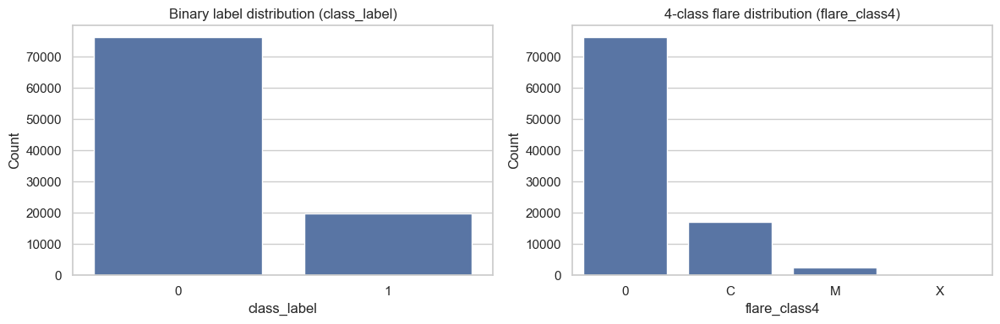

In [7]:
# Cell 7: Plot distributions of labels (binary and 4-class)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Binary class_label
sns.countplot(
    x="class_label",
    data=df,
    ax=axes[0]
)
axes[0].set_title("Binary label distribution (class_label)")
axes[0].set_xlabel("class_label")
axes[0].set_ylabel("Count")

# 4-class flare_class4
sns.countplot(
    x="flare_class4",
    data=df,
    order=["0", "C", "M", "X"],
    ax=axes[1]
)
axes[1].set_title("4-class flare distribution (flare_class4)")
axes[1].set_xlabel("flare_class4")
axes[1].set_ylabel("Count")

plt.tight_layout()
plt.show()


In [8]:
# Optional: print class ratios

def print_class_ratios(series, name=""):
    counts = series.value_counts()
    total = len(series)
    print(f"\n{name} ratios:")
    for c, v in counts.items():
        print(f"  {c}: {v} ({v / total:.3%})")

print_class_ratios(df["class_label"], "class_label")
print_class_ratios(df["flare_class4"], "flare_class4")



class_label ratios:
  0: 76142 (79.370%)
  1: 19791 (20.630%)

flare_class4 ratios:
  0: 76142 (79.370%)
  C: 16975 (17.695%)
  M: 2578 (2.687%)
  X: 238 (0.248%)


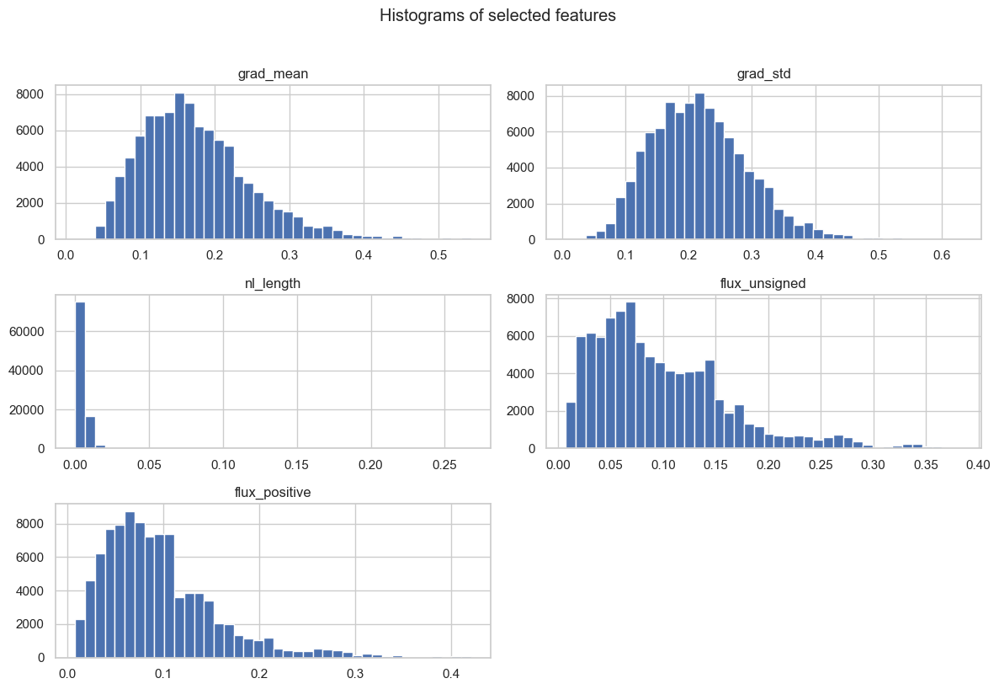

In [9]:
# Cell 8: Quick look at feature distributions (sample)

# Pick a small subset of features to plot
sample_features = [
    "grad_mean",
    "grad_std",
    "nl_length",
    "flux_unsigned",
    "flux_positive"
]

df[sample_features].hist(bins=40, figsize=(12, 8))
plt.suptitle("Histograms of selected features", y=1.02)
plt.tight_layout()
plt.show()


# FEATURE SELECTION

## Block A – Filter Methods

In [10]:
from sklearn.feature_selection import VarianceThreshold

# Low-variance filter
var_thresh = VarianceThreshold(threshold=0.0)
var_thresh.fit(df[feature_cols])

low_var_features = [
    feature_cols[i]
    for i, keep in enumerate(var_thresh.get_support())
    if not keep
]

print("Low-variance features:", low_var_features)

# Drop them
df_filtered = df.drop(columns=low_var_features)

# Update feature list
feature_cols_filtered = [c for c in feature_cols if c not in low_var_features]

# Correlation filter
corr = df_filtered[feature_cols_filtered].corr().abs()
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(bool))
high_corr_features = [column for column in upper.columns if any(upper[column] > 0.95)]

print("\nHighly correlated features:", high_corr_features)

df_filtered = df_filtered.drop(columns=high_corr_features)
feature_cols_filtered = [c for c in feature_cols_filtered if c not in high_corr_features]

print("\nRemaining feature count:", len(feature_cols_filtered))


Low-variance features: ['nl_curv_max', 'nl_bend_energy_min']

Highly correlated features: ['nl_num_fragments', 'wavelet_energy_1', 'wavelet_energy_2', 'wavelet_energy_3', 'wavelet_energy_4', 'wavelet_energy_5', 'flux_positive']

Remaining feature count: 20


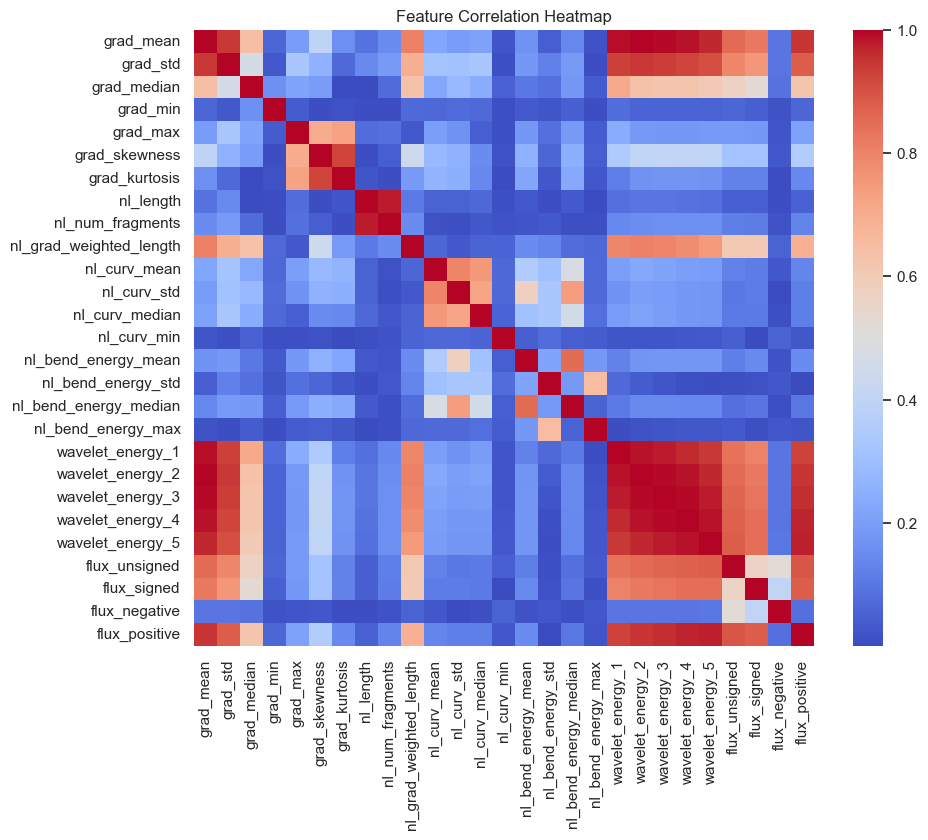

In [11]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr, cmap="coolwarm")
plt.title("Feature Correlation Heatmap")
plt.show()


## Block B – Supervised Feature Ranking


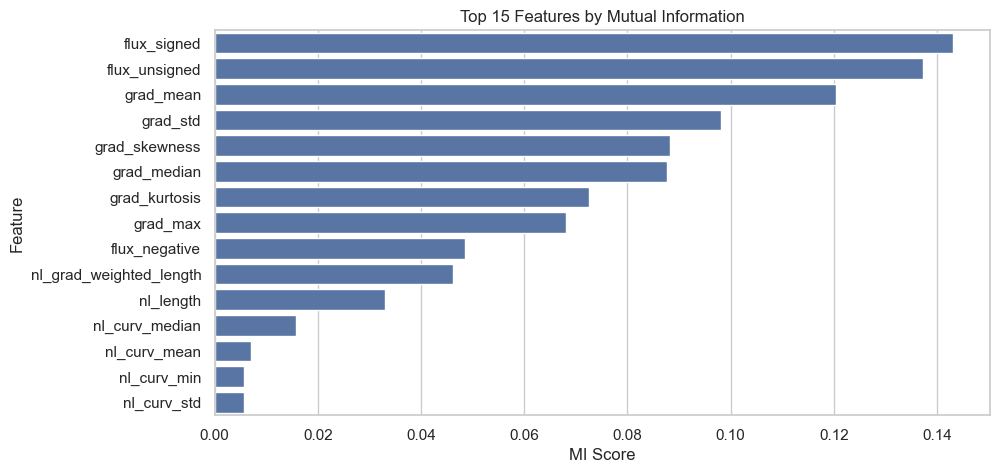

Top features by MI: ['flux_signed', 'flux_unsigned', 'grad_mean', 'grad_std', 'grad_skewness', 'grad_median', 'grad_kurtosis', 'grad_max', 'flux_negative', 'nl_grad_weighted_length', 'nl_length', 'nl_curv_median', 'nl_curv_mean', 'nl_curv_min', 'nl_curv_std', 'nl_bend_energy_max', 'grad_min', 'nl_bend_energy_std', 'nl_bend_energy_mean', 'nl_bend_energy_median']


In [12]:
from sklearn.feature_selection import mutual_info_classif

X = df_filtered[feature_cols_filtered]
y = df_filtered["flare_class4"]

# Encode labels numerically
y_enc = y.map({"0": 0, "C": 1, "M": 2, "X": 3})

mi_scores = mutual_info_classif(X, y_enc, random_state=RANDOM_STATE)
mi_series = pd.Series(mi_scores, index=feature_cols_filtered).sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=mi_series[:15], y=mi_series.index[:15])
plt.title("Top 15 Features by Mutual Information")
plt.xlabel("MI Score")
plt.ylabel("Feature")
plt.show()

# Keep top-k (example: 20)
top_k = 20
selected_features_mi = mi_series.head(top_k).index.tolist()

print("Top features by MI:", selected_features_mi)


## Embedded Feature Selection

c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\sklearn\linear_model\_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(


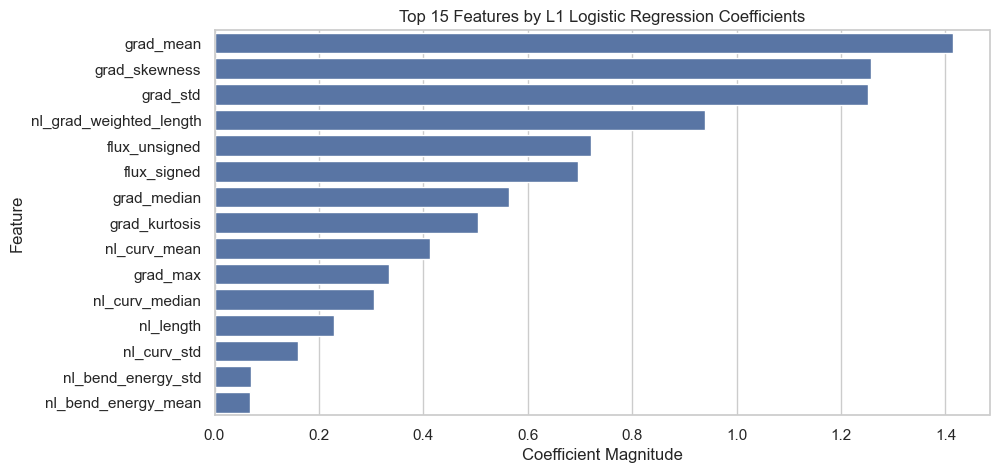

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

l1_model = LogisticRegression(
    penalty="l1", solver="liblinear", C=0.1, random_state=RANDOM_STATE
)
l1_model.fit(X_scaled, y_enc)

coef = np.abs(l1_model.coef_).mean(axis=0)
coef_series = pd.Series(coef, index=feature_cols_filtered).sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=coef_series[:15], y=coef_series.index[:15])
plt.title("Top 15 Features by L1 Logistic Regression Coefficients")
plt.xlabel("Coefficient Magnitude")
plt.ylabel("Feature")
plt.show()

selected_features_l1 = coef_series.head(top_k).index.tolist()


In [14]:
final_features_union = sorted(set(selected_features_mi) | set(selected_features_l1))
final_features_intersection = sorted(set(selected_features_mi) & set(selected_features_l1))

print("Union count:", len(final_features_union))
print("Intersection count:", len(final_features_intersection))

print("\nUnion:", final_features_union)
print("\nIntersection:", final_features_intersection)


Union count: 20
Intersection count: 20

Union: ['flux_negative', 'flux_signed', 'flux_unsigned', 'grad_kurtosis', 'grad_max', 'grad_mean', 'grad_median', 'grad_min', 'grad_skewness', 'grad_std', 'nl_bend_energy_max', 'nl_bend_energy_mean', 'nl_bend_energy_median', 'nl_bend_energy_std', 'nl_curv_mean', 'nl_curv_median', 'nl_curv_min', 'nl_curv_std', 'nl_grad_weighted_length', 'nl_length']

Intersection: ['flux_negative', 'flux_signed', 'flux_unsigned', 'grad_kurtosis', 'grad_max', 'grad_mean', 'grad_median', 'grad_min', 'grad_skewness', 'grad_std', 'nl_bend_energy_max', 'nl_bend_energy_mean', 'nl_bend_energy_median', 'nl_bend_energy_std', 'nl_curv_mean', 'nl_curv_median', 'nl_curv_min', 'nl_curv_std', 'nl_grad_weighted_length', 'nl_length']


## PCA

(95933, 20)
(95933, 20)


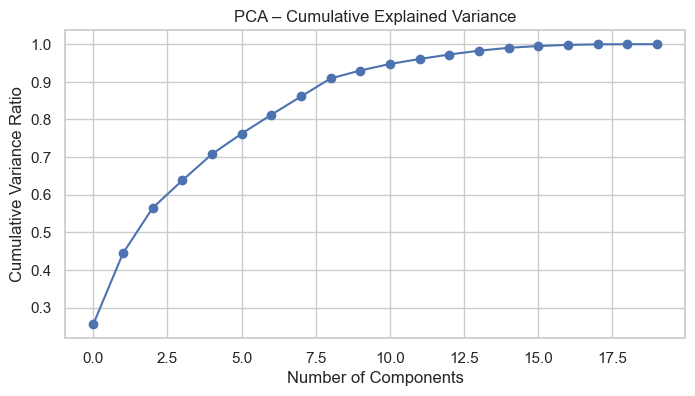

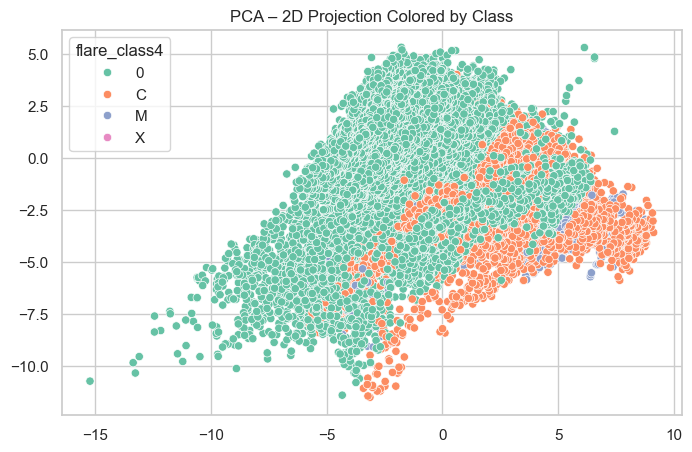

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Choose your feature set
X = df_filtered[final_features_union]
y = df_filtered["flare_class4"].map({"0":0, "C":1, "M":2, "X":3})

print(X.shape)
# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print(X_scaled.shape)
# PCA model
pca = PCA(n_components=len(X.columns))
X_pca = pca.fit_transform(X_scaled)

# Explained variance plot
plt.figure(figsize=(8,4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.title("PCA – Cumulative Explained Variance")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance Ratio")
plt.grid(True)
plt.show()

# 2D visualization
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(X_scaled)
sns.scatterplot(x=X_pca2[:,0], y=X_pca2[:,1], hue=df_filtered["flare_class4"], palette="Set2")
plt.title("PCA – 2D Projection Colored by Class")
plt.show()


## t-SNE and UMAP (structure visualization)

c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


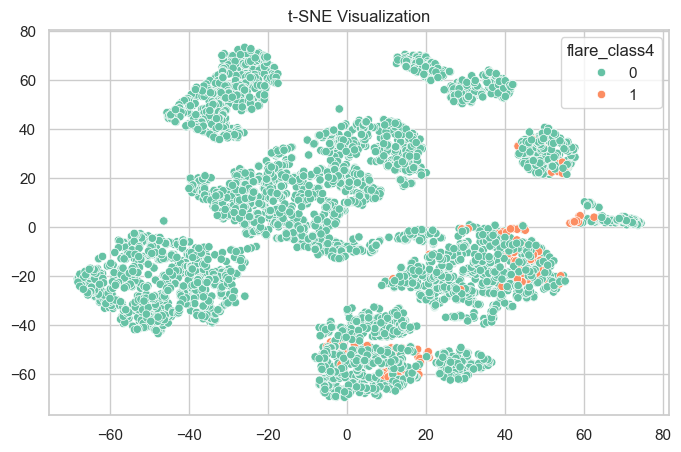

c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


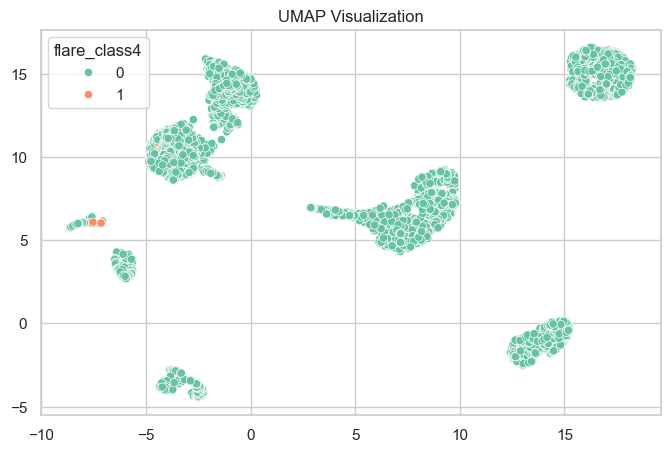

In [16]:
from sklearn.manifold import TSNE
from umap import umap_ as umap # <-- key change

# t-SNE on a sample (for speed)
sample_size = 5000
X_sample = X_scaled[:sample_size]
y_sample = y[:sample_size]

# t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_sample)

sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=y_sample, palette="Set2")
plt.title("t-SNE Visualization")
plt.show()

# UMAP
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = reducer.fit_transform(X_sample)

sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=y_sample, palette="Set2")
plt.title("UMAP Visualization")
plt.show()


## L1 LOGISTIC REGRESSION

c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\sklearn\linear_model\_logistic.py:1296: FutureWarning: Using the 'liblinear' solver for multiclass classification is deprecated. An error will be raised in 1.8. Either use another solver which supports the multinomial loss or wrap the estimator in a OneVsRestClassifier to keep applying a one-versus-rest scheme.
  warnings.warn(


              precision    recall  f1-score   support

           0       0.85      0.98      0.91     22827
           1       0.59      0.28      0.38      5131
           2       1.00      0.00      0.00       749
           3       0.00      0.00      0.00        73

    accuracy                           0.83     28780
   macro avg       0.61      0.32      0.32     28780
weighted avg       0.80      0.83      0.79     28780



c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\admin\anaconda3\envs\490env\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.sh

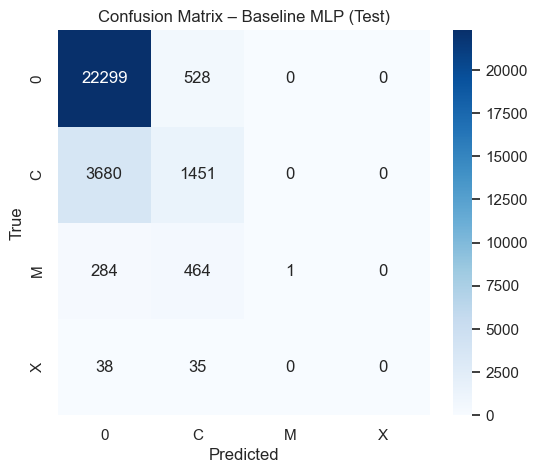

In [17]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train_l1, X_test_l1, y_train_l1, y_test_l1 = train_test_split(X, y_enc, test_size=0.3, random_state=1)
l1_model = LogisticRegression(
    penalty="l1", solver="liblinear", C=0.1, random_state=RANDOM_STATE
)
l1_model.fit(X_train_l1, y_train_l1)
y_pred_l1 = l1_model.predict(X_test_l1)
target_names = ["0", "C", "M", "X"]
print(classification_report(y_test_l1, y_pred_l1))

cm = confusion_matrix(y_test_l1, y_pred_l1)
cm_df = pd.DataFrame(cm, index=target_names, columns=target_names)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix – Baseline MLP (Test)")
plt.show()


## Models

In [18]:
# Cell 4.1.1: Imports for deep models and metrics

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader, TensorDataset

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix
)


In [19]:
# Cell 4.1.2: Feature matrix and encoded labels

# choose the feature set you want to start with
used_features = final_features_union  # or final_features_intersection

X = df_filtered[used_features].values
y = df_filtered["flare_class4"].map({"0": 0, "C": 1, "M": 2, "X": 3}).values

print("X shape:", X.shape)
print("Label value counts:", pd.Series(y).value_counts())


X shape: (95933, 20)
Label value counts: 0    76142
1    16975
2     2578
3      238
Name: count, dtype: int64


In [20]:
# Cell 4.1.3: Train / val / test split (stratified)

X_train_full, X_test, y_train_full, y_test = train_test_split(
    X,
    y,
    test_size=0.15,
    random_state=RANDOM_STATE,
    stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_train_full,
    y_train_full,
    test_size=0.1765,   # 0.1765 * 0.85 ≈ 0.15 -> total 70/15/15
    random_state=RANDOM_STATE,
    stratify=y_train_full
)

print("Train:", X_train.shape, "Val:", X_val.shape, "Test:", X_test.shape)


Train: (67150, 20) Val: (14393, 20) Test: (14390, 20)


In [21]:
# Cell 4.1.4: Standard scaling

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)


In [22]:
# Cell 4.1.5: Tensor datasets and dataloaders

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

X_train_t = torch.tensor(X_train_scaled, dtype=torch.float32)
X_val_t   = torch.tensor(X_val_scaled, dtype=torch.float32)
X_test_t  = torch.tensor(X_test_scaled, dtype=torch.float32)

y_train_t = torch.tensor(y_train, dtype=torch.long)
y_val_t   = torch.tensor(y_val, dtype=torch.long)
y_test_t  = torch.tensor(y_test, dtype=torch.long)

train_ds = TensorDataset(X_train_t, y_train_t)
val_ds   = TensorDataset(X_val_t, y_val_t)
test_ds  = TensorDataset(X_test_t, y_test_t)

batch_size = 256

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_loader  = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

xb, yb = next(iter(train_loader))
print("batch:", xb.shape)


Using device: cuda
batch: torch.Size([256, 20])


In [23]:
# Cell 4.2.1: Baseline MLP model

class BaselineMLP(nn.Module):
    def __init__(self, input_dim, hidden_dims=(64, 32), num_classes=4):
        super().__init__()
        layers = []
        prev = input_dim
        for h in hidden_dims:
            layers.append(nn.Linear(prev, h))
            layers.append(nn.ReLU())
            prev = h
        layers.append(nn.Linear(prev, num_classes))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)

input_dim = X_train_scaled.shape[1]
num_classes = 4

model = BaselineMLP(input_dim=input_dim, hidden_dims=(64, 32), num_classes=num_classes).to(device)
model


BaselineMLP(
  (net): Sequential(
    (0): Linear(in_features=20, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=32, bias=True)
    (3): ReLU()
    (4): Linear(in_features=32, out_features=4, bias=True)
  )
)

In [24]:
# Cell 4.2.2: Class weights (handle imbalance)

class_counts = pd.Series(y_train).value_counts().sort_index()
print("Train class counts:", class_counts.to_dict())

# inverse frequency
class_weights = 1.0 / class_counts
class_weights = class_weights / class_weights.mean()  # normalize

print("Class weights:", class_weights.to_dict())

class_weights_t = torch.tensor(class_weights.values, dtype=torch.float32).to(device)


Train class counts: {0: 53297, 1: 11882, 2: 1804, 3: 167}
Class weights: {0: 0.011293914777365266, 1: 0.05065912943016635, 2: 0.3336650642401533, 3: 3.6043818915523147}


In [25]:
# Cell 4.2.3: Training and evaluation helper functions

def run_epoch(model, loader, optimizer, criterion, train=True):
    if train:
        model.train()
    else:
        model.eval()

    all_preds = []
    all_targets = []
    running_loss = 0.0

    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        if train:
            optimizer.zero_grad()

        logits = model(xb)
        loss = criterion(logits, yb)

        if train:
            loss.backward()
            optimizer.step()

        running_loss += loss.item() * xb.size(0)

        preds = torch.argmax(logits, dim=1)
        all_preds.append(preds.detach().cpu().numpy())
        all_targets.append(yb.detach().cpu().numpy())

    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)

    avg_loss = running_loss / len(loader.dataset)
    acc = accuracy_score(all_targets, all_preds)
    macro_f1 = f1_score(all_targets, all_preds, average="macro")

    return avg_loss, acc, macro_f1, all_targets, all_preds


In [26]:
import torch
print(torch.__version__)
print("CUDA:", torch.version.cuda)
print("Available:", torch.cuda.is_available())
print("Device name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None")


2.5.1+cu121
CUDA: 12.1
Available: True
Device name: NVIDIA GeForce RTX 4060 Laptop GPU


In [27]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

# make sure RANDOM_STATE and device are defined earlier
torch.manual_seed(RANDOM_STATE)

input_dim = X_train.shape[1]
num_classes = 4

def train_baseline_config(hidden_dims, lr, weight_decay,
                          max_epochs=40, patience=5, min_delta=0.0):
    """Train a BaselineMLP with early stopping, return model, history, best val F1."""
    model = BaselineMLP(
        input_dim=input_dim,
        hidden_dims=hidden_dims,
        num_classes=num_classes
    ).to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_t)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    history = {
        "train_loss": [],
        "val_loss": [],
        "train_macro_f1": [],
        "val_macro_f1": [],
    }

    best_val_f1 = -np.inf
    best_state = None
    patience_counter = 0

    for epoch in range(1, max_epochs + 1):
        train_loss, train_acc, train_f1, _, _ = run_epoch(
            model, train_loader, optimizer, criterion, train=True
        )
        val_loss, val_acc, val_f1, _, _ = run_epoch(
            model, val_loader, optimizer, criterion, train=False
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_macro_f1"].append(train_f1)
        history["val_macro_f1"].append(val_f1)

        # early stopping on val F1
        if val_f1 > best_val_f1 + min_delta:
            best_val_f1 = val_f1
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"  Early stopping at epoch {epoch:02d}")
                break

        print(
            f"  Epoch {epoch:02d} | "
            f"Train loss {train_loss:.4f}, F1 {train_f1:.4f} | "
            f"Val loss {val_loss:.4f}, F1 {val_f1:.4f}"
        )

    if best_state is not None:
        model.load_state_dict(best_state)

    return model, history, best_val_f1

def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


## BASELINE  (ABLATION 1 - MODEL COMPLEXITY)

In [28]:
# configs for complexity sweep
arch_configs_complexity = [
    {"name": "h32",         "hidden_dims": (32,)},
    {"name": "h64",         "hidden_dims": (64,)},
    {"name": "h64_32",      "hidden_dims": (64, 32)},
    {"name": "h128_64",     "hidden_dims": (128, 64)},
    {"name": "h256_128",    "hidden_dims": (256, 128)},
    {"name": "h256_128_64", "hidden_dims": (256, 128, 64)},
]

fixed_lr = 1e-3
fixed_wd = 1e-4

results_complexity = []

for cfg in arch_configs_complexity:
    print(f"\n=== Complexity ablation: {cfg['name']} | hidden={cfg['hidden_dims']} ===")
    model_cfg, hist_cfg, best_val_f1_cfg = train_baseline_config(
        hidden_dims=cfg["hidden_dims"],
        lr=fixed_lr,
        weight_decay=fixed_wd,
        max_epochs=1500,
        patience=5,
        min_delta=0.0,
    )
    results_complexity.append({
        "name": cfg["name"],
        "hidden_dims": cfg["hidden_dims"],
        "history": hist_cfg,
        "best_val_f1": best_val_f1_cfg,
        "model": model_cfg,
        "num_params": count_params(model_cfg),
    })



=== Complexity ablation: h32 | hidden=(32,) ===
  Epoch 01 | Train loss 1.1124, F1 0.3385 | Val loss 1.0063, F1 0.3793
  Epoch 02 | Train loss 0.9124, F1 0.3939 | Val loss 0.8516, F1 0.3957
  Epoch 03 | Train loss 0.8012, F1 0.4100 | Val loss 0.7604, F1 0.4050
  Epoch 04 | Train loss 0.7308, F1 0.4169 | Val loss 0.6964, F1 0.4119
  Epoch 05 | Train loss 0.6806, F1 0.4294 | Val loss 0.6621, F1 0.4346
  Epoch 06 | Train loss 0.6423, F1 0.4408 | Val loss 0.6259, F1 0.4285
  Epoch 07 | Train loss 0.6158, F1 0.4486 | Val loss 0.6017, F1 0.4581
  Epoch 08 | Train loss 0.5976, F1 0.4627 | Val loss 0.5850, F1 0.4567
  Epoch 09 | Train loss 0.5782, F1 0.4658 | Val loss 0.5679, F1 0.4654
  Epoch 10 | Train loss 0.5622, F1 0.4740 | Val loss 0.5584, F1 0.4680
  Epoch 11 | Train loss 0.5521, F1 0.4817 | Val loss 0.5472, F1 0.4628
  Epoch 12 | Train loss 0.5421, F1 0.4888 | Val loss 0.5295, F1 0.4810
  Epoch 13 | Train loss 0.5307, F1 0.4980 | Val loss 0.5205, F1 0.4857
  Epoch 14 | Train loss 0.52

In [ ]:
# Evaluate all models and store y_test_true / y_test_pred

criterion_eval = nn.CrossEntropyLoss(weight=class_weights_t)

for res in results_complexity:
    model_eval = res["model"]

    # Test evaluation
    test_loss, test_acc, test_f1, y_true, y_pred = run_epoch(
        model_eval,
        test_loader,
        optimizer=None,
        criterion=criterion_eval,
        train=False
    )

    # Store inside result dictionary
    res["y_test_true"] = y_true
    res["y_test_pred"] = y_pred
    res["test_loss"] = test_loss
    res["test_acc"] = test_acc
    res["test_f1"] = test_f1


MODEL: h32
Classification Report:
              precision    recall  f1-score   support

           0      0.951     0.773     0.853     11421
           C      0.427     0.670     0.521      2546
           M      0.371     0.948     0.533       387
           X      0.319     1.000     0.483        36

    accuracy                          0.760     14390
   macro avg      0.517     0.848     0.598     14390
weighted avg      0.841     0.760     0.785     14390



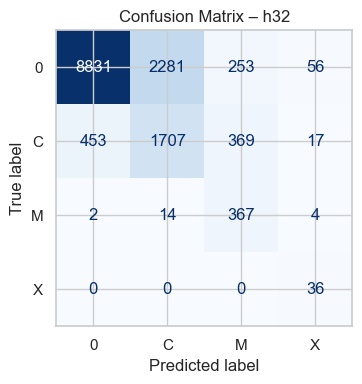

MODEL: h64
Classification Report:
              precision    recall  f1-score   support

           0      0.962     0.791     0.868     11421
           C      0.473     0.759     0.583      2546
           M      0.447     0.943     0.607       387
           X      0.375     1.000     0.545        36

    accuracy                          0.790     14390
   macro avg      0.564     0.873     0.651     14390
weighted avg      0.860     0.790     0.810     14390



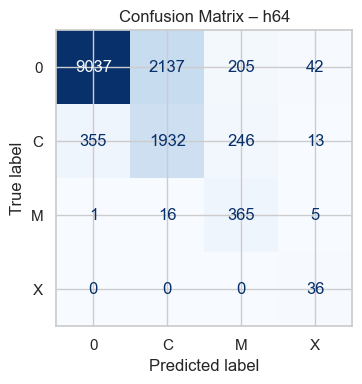

MODEL: h64_32
Classification Report:
              precision    recall  f1-score   support

           0      0.973     0.809     0.883     11421
           C      0.508     0.837     0.632      2546
           M      0.602     0.964     0.741       387
           X      0.486     1.000     0.655        36

    accuracy                          0.819     14390
   macro avg      0.642     0.903     0.728     14390
weighted avg      0.879     0.819     0.835     14390



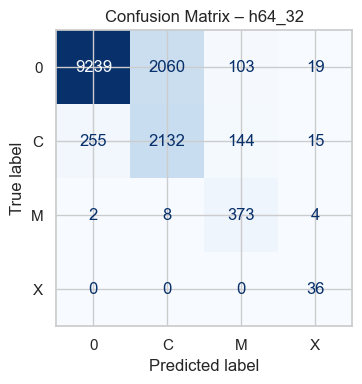

MODEL: h128_64
Classification Report:
              precision    recall  f1-score   support

           0      0.983     0.853     0.913     11421
           C      0.588     0.866     0.701      2546
           M      0.580     0.979     0.729       387
           X      0.468     1.000     0.637        36

    accuracy                          0.859     14390
   macro avg      0.655     0.925     0.745     14390
weighted avg      0.901     0.859     0.870     14390



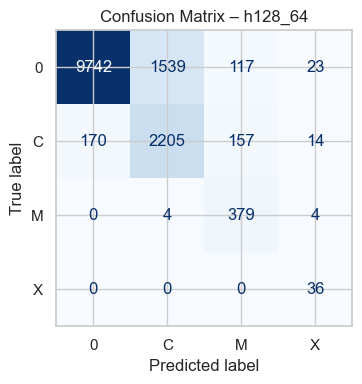

MODEL: h256_128
Classification Report:
              precision    recall  f1-score   support

           0      0.986     0.907     0.945     11421
           C      0.698     0.908     0.789      2546
           M      0.742     0.990     0.848       387
           X      0.714     0.972     0.824        36

    accuracy                          0.910     14390
   macro avg      0.785     0.944     0.851     14390
weighted avg      0.928     0.910     0.914     14390



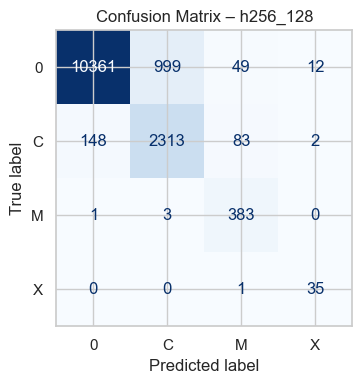

MODEL: h256_128_64
Classification Report:
              precision    recall  f1-score   support

           0      0.985     0.940     0.962     11421
           C      0.799     0.907     0.850      2546
           M      0.692     0.979     0.811       387
           X      0.655     1.000     0.791        36

    accuracy                          0.936     14390
   macro avg      0.783     0.957     0.853     14390
weighted avg      0.944     0.936     0.938     14390



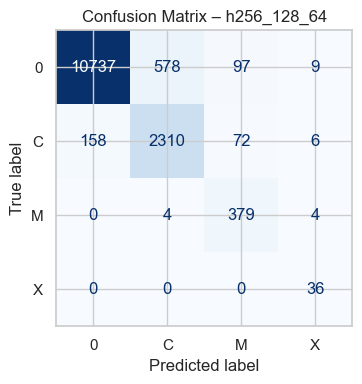

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

label_names = ["0", "C", "M", "X"]
labels = [0, 1, 2, 3]

for res in results_complexity:
    name = res["name"]
    y_true = res["y_test_true"]
    y_pred = res["y_test_pred"]

    print("="*70)
    print(f"MODEL: {name}")
    print("="*70)

    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=label_names, digits=3))

    cm = confusion_matrix(y_true, y_pred, labels=labels)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)

    fig, ax = plt.subplots(figsize=(4, 4))
    disp.plot(ax=ax, cmap="Blues", values_format="d", colorbar=False)
    ax.set_title(f"Confusion Matrix – {name}")
    plt.tight_layout()
    plt.show()


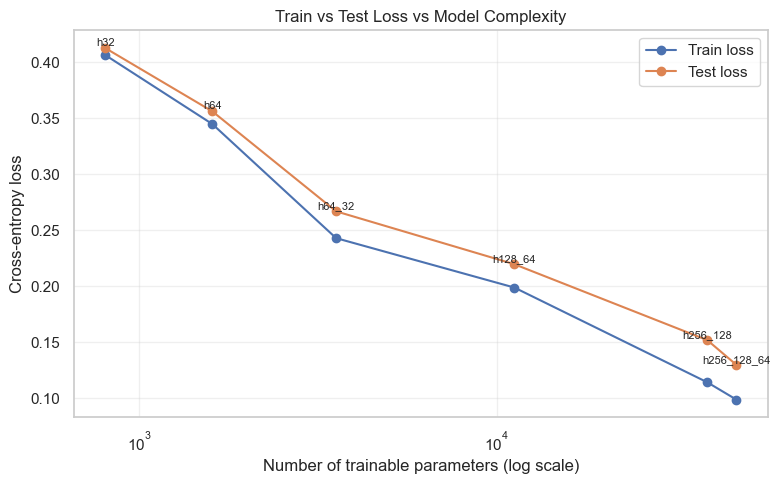

In [ ]:
# Cell: Evaluate each model on train/val/test and store metrics

criterion_eval = nn.CrossEntropyLoss(weight=class_weights_t)

for res in results_complexity:
    model_eval = res["model"]

    # Train metrics (using best checkpoint already loaded)
    train_loss, train_acc, train_macro_f1, y_tr, y_tr_pred = run_epoch(
        model_eval, train_loader, optimizer=None, criterion=criterion_eval, train=False
    )

    # Val metrics
    val_loss, val_acc, val_macro_f1, y_val_all, y_val_pred = run_epoch(
        model_eval, val_loader, optimizer=None, criterion=criterion_eval, train=False
    )

    # Test metrics
    test_loss, test_acc, test_macro_f1, y_te, y_te_pred = run_epoch(
        model_eval, test_loader, optimizer=None, criterion=criterion_eval, train=False
    )

    res["metrics"] = {
        "train_loss": train_loss,
        "train_acc": train_acc,
        "train_macro_f1": train_macro_f1,
        "val_loss": val_loss,
        "val_acc": val_acc,
        "val_macro_f1": val_macro_f1,
        "test_loss": test_loss,
        "test_acc": test_acc,
        "test_macro_f1": test_macro_f1,
    }
    res["y_test_true"] = y_te
    res["y_test_pred"] = y_te_pred


# Cell: Plot train and test loss vs complexity (number of params)

import matplotlib.pyplot as plt
import numpy as np

complexities = np.array([r["num_params"] for r in results_complexity])
names        = [r["name"] for r in results_complexity]
train_losses = np.array([r["metrics"]["train_loss"] for r in results_complexity])
test_losses  = np.array([r["metrics"]["test_loss"] for r in results_complexity])

plt.figure(figsize=(8, 5))
plt.plot(complexities, train_losses, marker="o", label="Train loss")
plt.plot(complexities, test_losses,  marker="o", label="Test loss")

plt.xscale("log")  # complexity spans large range, log-scale helps
for x, y, n in zip(complexities, test_losses, names):
    plt.text(x, y, n, fontsize=8, ha="center", va="bottom")

plt.xlabel("Number of trainable parameters (log scale)")
plt.ylabel("Cross-entropy loss")
plt.title("Train vs Test Loss vs Model Complexity")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


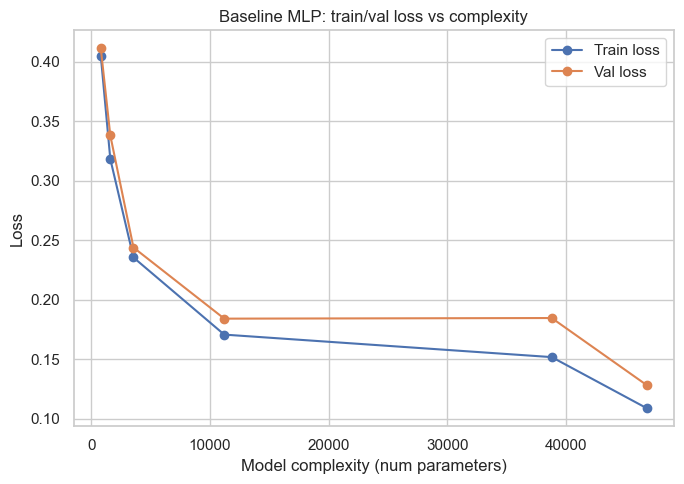

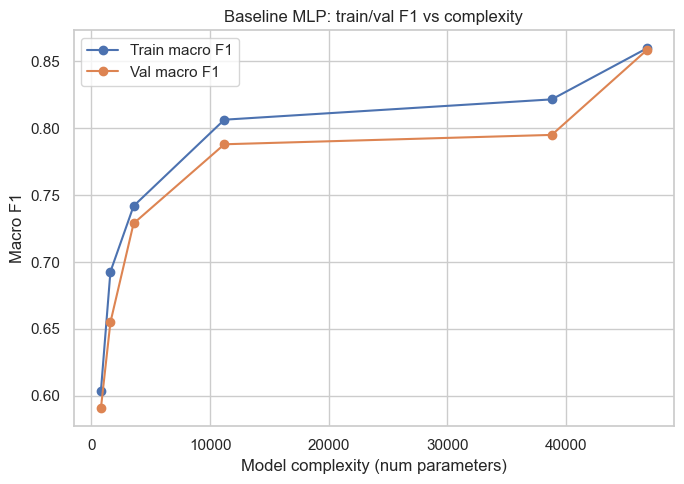

In [29]:
# sort by complexity (num params)
res_c_sorted = sorted(results_complexity, key=lambda r: r["num_params"])

complexities = [r["num_params"] for r in res_c_sorted]
train_loss_c = [r["history"]["train_loss"][-1] for r in res_c_sorted]
val_loss_c   = [r["history"]["val_loss"][-1]   for r in res_c_sorted]
train_f1_c   = [r["history"]["train_macro_f1"][-1] for r in res_c_sorted]
val_f1_c     = [r["history"]["val_macro_f1"][-1]   for r in res_c_sorted]

plt.figure(figsize=(7,5))
plt.plot(complexities, train_loss_c, marker="o", label="Train loss")
plt.plot(complexities, val_loss_c,   marker="o", label="Val loss")
plt.xlabel("Model complexity (num parameters)")
plt.ylabel("Loss")
plt.title("Baseline MLP: train/val loss vs complexity")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,5))
plt.plot(complexities, train_f1_c, marker="o", label="Train macro F1")
plt.plot(complexities, val_f1_c,   marker="o", label="Val macro F1")
plt.xlabel("Model complexity (num parameters)")
plt.ylabel("Macro F1")
plt.title("Baseline MLP: train/val F1 vs complexity")
plt.legend()
plt.tight_layout()
plt.show()


In [30]:
best_complexity_run = max(results_complexity, key=lambda r: r["best_val_f1"])
best_arch = best_complexity_run["hidden_dims"]
print("Best baseline architecture by val macro F1:", best_arch,
      "| F1 =", best_complexity_run["best_val_f1"])


Best baseline architecture by val macro F1: (256, 128, 64) | F1 = 0.8683099639607167


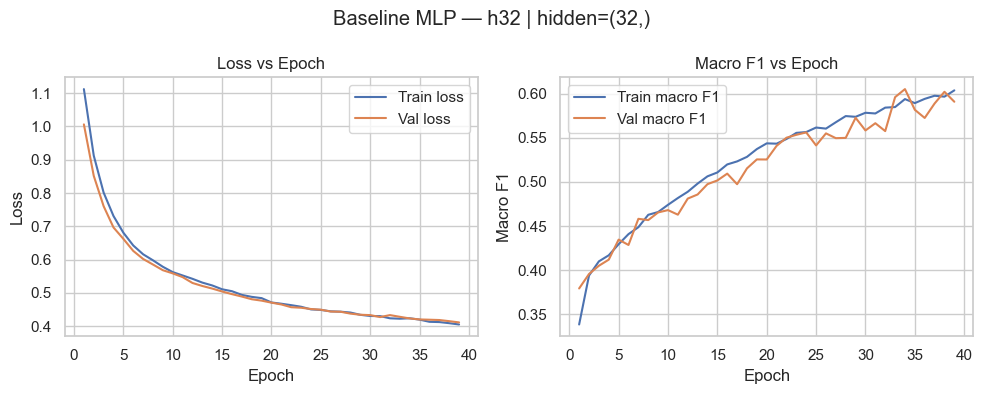

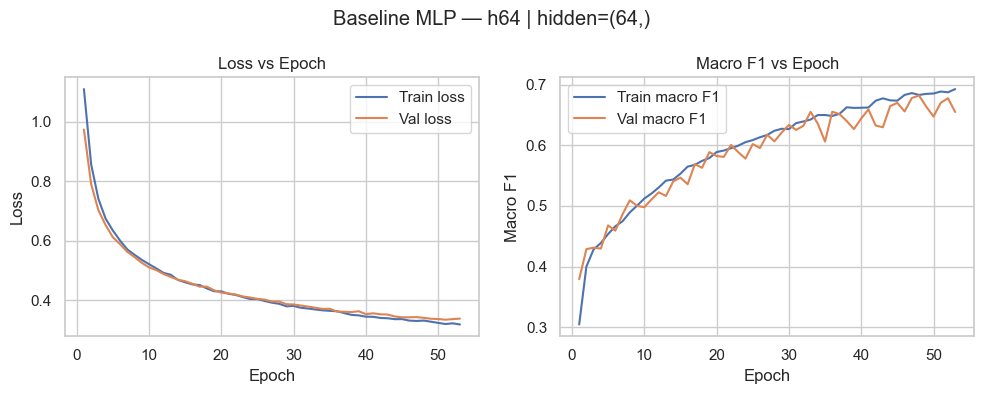

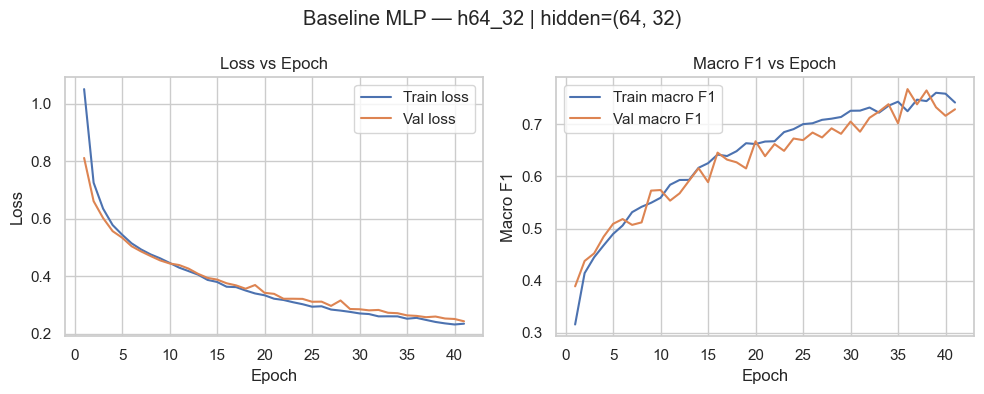

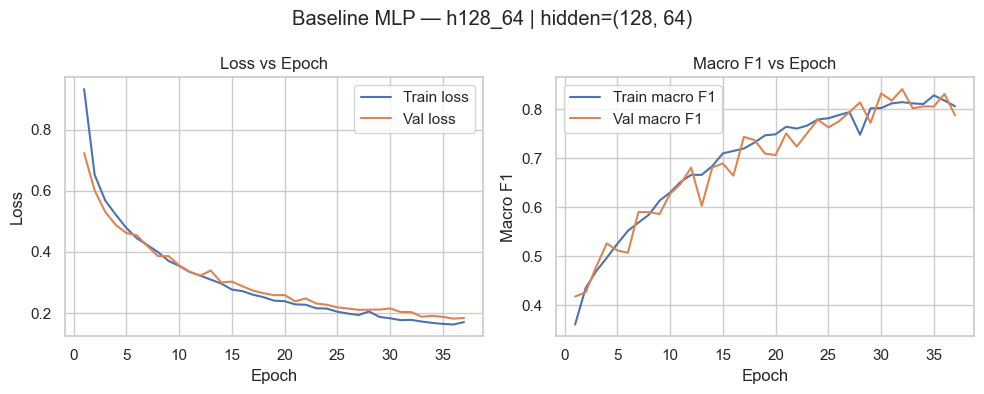

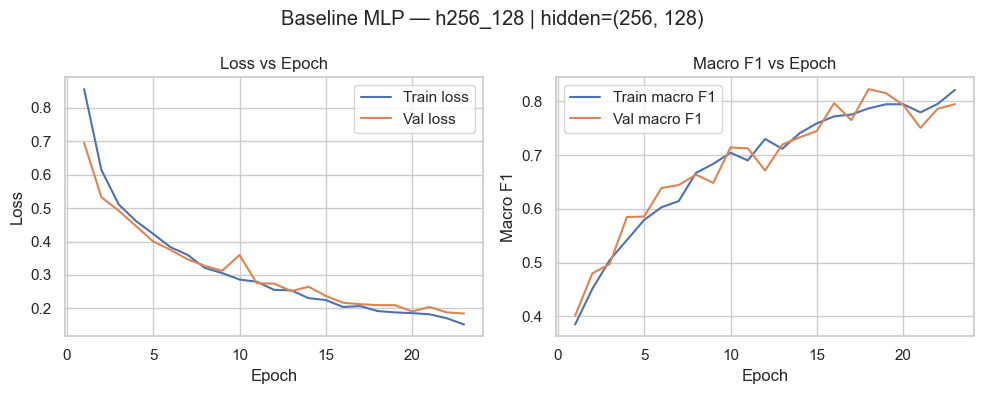

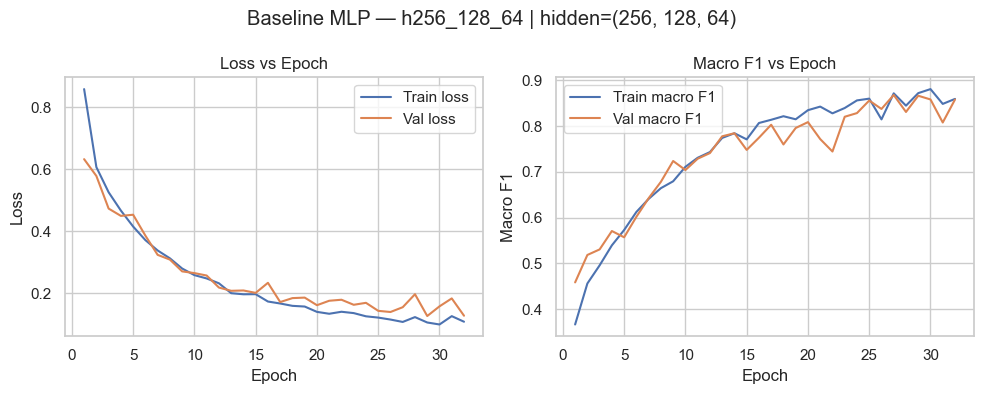

In [31]:
import matplotlib.pyplot as plt

for r in results_complexity:
    h = r["history"]
    epochs = range(1, len(h["train_loss"]) + 1)

    plt.figure(figsize=(10, 4))
    plt.suptitle(f"Baseline MLP — {r['name']} | hidden={r['hidden_dims']}")

    # Loss vs epoch
    plt.subplot(1, 2, 1)
    plt.plot(epochs, h["train_loss"], label="Train loss")
    plt.plot(epochs, h["val_loss"], label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs Epoch")
    plt.legend()

    # Macro F1 vs epoch
    plt.subplot(1, 2, 2)
    plt.plot(epochs, h["train_macro_f1"], label="Train macro F1")
    plt.plot(epochs, h["val_macro_f1"], label="Val macro F1")
    plt.xlabel("Epoch")
    plt.ylabel("Macro F1")
    plt.title("Macro F1 vs Epoch")
    plt.legend()

    plt.tight_layout()
    plt.show()



===== h32 | hidden=(32,) =====
Accuracy: 0.761
Classification report:
              precision    recall  f1-score   support

      class0      0.952     0.777     0.855     11424
      class1      0.426     0.664     0.519      2547
      class2      0.361     0.920     0.519       387
      class3      0.307     1.000     0.470        35

    accuracy                          0.761     14393
   macro avg      0.512     0.840     0.591     14393
weighted avg      0.841     0.761     0.786     14393



<Figure size 500x400 with 0 Axes>

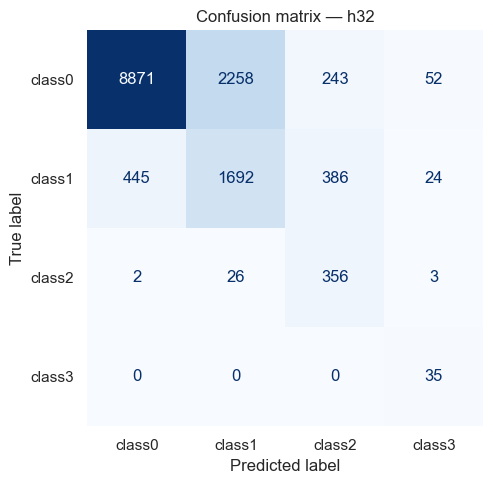


===== h64 | hidden=(64,) =====
Accuracy: 0.805
Classification report:
              precision    recall  f1-score   support

      class0      0.960     0.818     0.883     11424
      class1      0.498     0.723     0.590      2547
      class2      0.413     0.933     0.573       387
      class3      0.402     1.000     0.574        35

    accuracy                          0.805     14393
   macro avg      0.568     0.868     0.655     14393
weighted avg      0.862     0.805     0.822     14393



<Figure size 500x400 with 0 Axes>

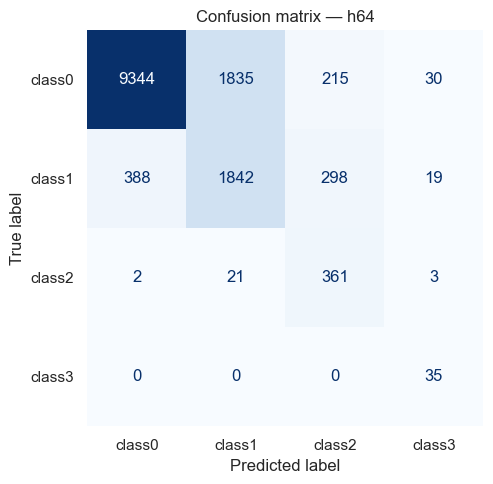


===== h64_32 | hidden=(64, 32) =====
Accuracy: 0.841
Classification report:
              precision    recall  f1-score   support

      class0      0.972     0.841     0.902     11424
      class1      0.549     0.823     0.658      2547
      class2      0.594     0.948     0.730       387
      class3      0.455     1.000     0.625        35

    accuracy                          0.841     14393
   macro avg      0.642     0.903     0.729     14393
weighted avg      0.886     0.841     0.853     14393



<Figure size 500x400 with 0 Axes>

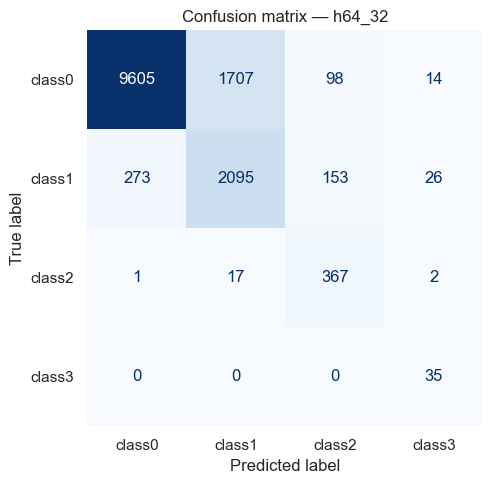


===== h128_64 | hidden=(128, 64) =====
Accuracy: 0.880
Classification report:
              precision    recall  f1-score   support

      class0      0.989     0.872     0.927     11424
      class1      0.623     0.900     0.736      2547
      class2      0.656     0.969     0.782       387
      class3      0.547     1.000     0.707        35

    accuracy                          0.880     14393
   macro avg      0.703     0.935     0.788     14393
weighted avg      0.914     0.880     0.889     14393



<Figure size 500x400 with 0 Axes>

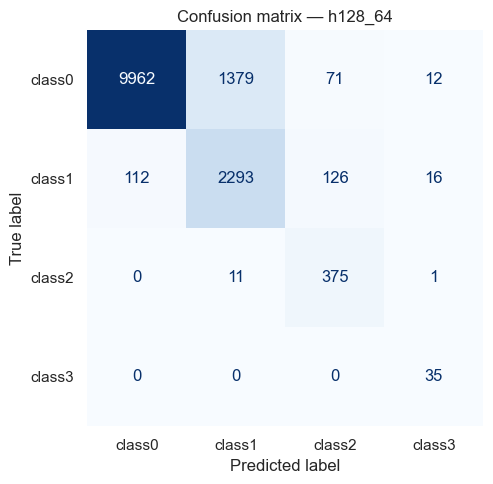


===== h256_128 | hidden=(256, 128) =====
Accuracy: 0.904
Classification report:
              precision    recall  f1-score   support

      class0      0.974     0.916     0.944     11424
      class1      0.711     0.833     0.767      2547
      class2      0.641     0.982     0.776       387
      class3      0.530     1.000     0.693        35

    accuracy                          0.904     14393
   macro avg      0.714     0.933     0.795     14393
weighted avg      0.917     0.904     0.908     14393



<Figure size 500x400 with 0 Axes>

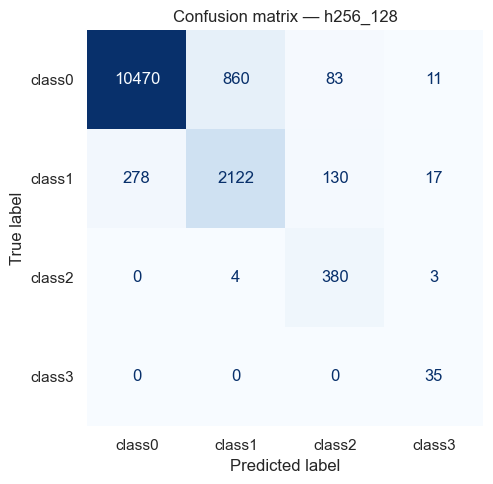


===== h256_128_64 | hidden=(256, 128, 64) =====
Accuracy: 0.924
Classification report:
              precision    recall  f1-score   support

      class0      0.992     0.919     0.954     11424
      class1      0.730     0.939     0.821      2547
      class2      0.795     0.964     0.871       387
      class3      0.648     1.000     0.787        35

    accuracy                          0.924     14393
   macro avg      0.791     0.956     0.858     14393
weighted avg      0.939     0.924     0.928     14393



<Figure size 500x400 with 0 Axes>

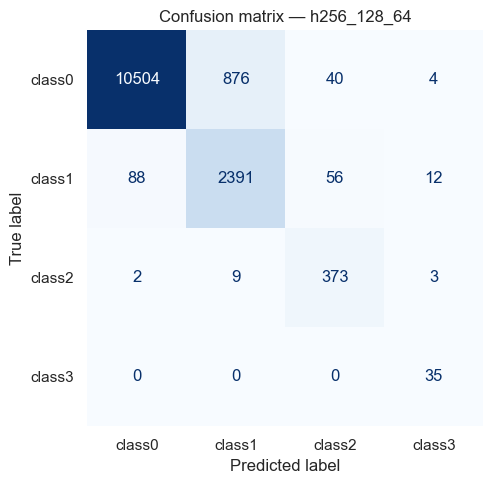

In [32]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import numpy as np

def get_predictions(model, data_loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for xb, yb in data_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            logits = model(xb)
            preds = torch.argmax(logits, dim=1)
            all_preds.append(preds.cpu().numpy())
            all_labels.append(yb.cpu().numpy())
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)
    return all_labels, all_preds

# replace with your real class names
class_names = ["class0", "class1", "class2", "class3"]

for r in results_complexity:
    print(f"\n===== {r['name']} | hidden={r['hidden_dims']} =====")

    # change `val_loader` to `test_loader` if you have a separate test set
    y_true, y_pred = get_predictions(r["model"], val_loader)

    acc = (y_true == y_pred).mean()
    print(f"Accuracy: {acc:.3f}")
    print("Classification report:")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(5, 4))
    disp.plot(values_format="d", cmap="Blues", colorbar=False)

    # REMOVE GRID LINES
    plt.grid(False)
    disp.ax_.grid(False)
    plt.box(False)

    plt.title(f"Confusion matrix — {r['name']}")
    plt.tight_layout()
    plt.show()



## ABLATION 2 (learning rate (fixed architecture))


=== LR ablation: lr=3e-04, hidden=(256, 128, 64) ===
  Epoch 01 | Train loss 1.0285, F1 0.3763 | Val loss 0.8120, F1 0.3719
  Epoch 02 | Train loss 0.7258, F1 0.4200 | Val loss 0.6516, F1 0.4485
  Epoch 03 | Train loss 0.6278, F1 0.4441 | Val loss 0.5896, F1 0.4423
  Epoch 04 | Train loss 0.5746, F1 0.4651 | Val loss 0.5307, F1 0.4888
  Epoch 05 | Train loss 0.5249, F1 0.4896 | Val loss 0.5027, F1 0.5130
  Epoch 06 | Train loss 0.4948, F1 0.5191 | Val loss 0.4731, F1 0.5275
  Epoch 07 | Train loss 0.4613, F1 0.5363 | Val loss 0.4521, F1 0.5174
  Epoch 08 | Train loss 0.4419, F1 0.5662 | Val loss 0.4438, F1 0.5978
  Epoch 09 | Train loss 0.4225, F1 0.5725 | Val loss 0.4215, F1 0.6382
  Epoch 10 | Train loss 0.4073, F1 0.5936 | Val loss 0.4024, F1 0.6180
  Epoch 11 | Train loss 0.3801, F1 0.6173 | Val loss 0.3780, F1 0.5970
  Epoch 12 | Train loss 0.3692, F1 0.6249 | Val loss 0.3717, F1 0.6083
  Epoch 13 | Train loss 0.3475, F1 0.6419 | Val loss 0.3515, F1 0.6411
  Epoch 14 | Train loss

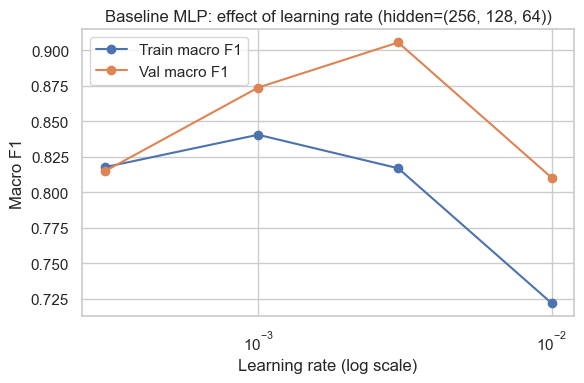

Best learning rate by val macro F1: 0.003 | F1 = 0.9055748195575958


In [33]:
lr_values = [3e-4, 1e-3, 3e-3, 1e-2]
results_lr = []

for lr in lr_values:
    print(f"\n=== LR ablation: lr={lr:.0e}, hidden={best_arch} ===")
    model_cfg, hist_cfg, best_val_f1_cfg = train_baseline_config(
        hidden_dims=best_arch,
        lr=lr,
        weight_decay=fixed_wd,
        max_epochs=1500,
        patience=5,
        min_delta=0.0,
    )
    results_lr.append({
        "lr": lr,
        "history": hist_cfg,
        "best_val_f1": best_val_f1_cfg,
        "model": model_cfg,
    })

# plot F1 vs lr
lrs = [r["lr"] for r in results_lr]
val_f1_lr   = [r["best_val_f1"] for r in results_lr]
train_f1_lr = [r["history"]["train_macro_f1"][-1] for r in results_lr]

plt.figure(figsize=(6,4))
plt.plot(lrs, train_f1_lr, marker="o", label="Train macro F1")
plt.plot(lrs, val_f1_lr,   marker="o", label="Val macro F1")
plt.xscale("log")
plt.xlabel("Learning rate (log scale)")
plt.ylabel("Macro F1")
plt.title(f"Baseline MLP: effect of learning rate (hidden={best_arch})")
plt.legend()
plt.tight_layout()
plt.show()

best_lr_run = max(results_lr, key=lambda r: r["best_val_f1"])
best_lr = best_lr_run["lr"]
print("Best learning rate by val macro F1:", best_lr,
      "| F1 =", best_lr_run["best_val_f1"])


## ABLATION 3 (weight decay (regularization))


=== WD ablation: wd=0e+00, hidden=(256, 128, 64), lr=3e-03 ===
  Epoch 01 | Train loss 0.8190, F1 0.3931 | Val loss 0.6090, F1 0.4567
  Epoch 02 | Train loss 0.5466, F1 0.4763 | Val loss 0.5086, F1 0.5329
  Epoch 03 | Train loss 0.4497, F1 0.5477 | Val loss 0.4444, F1 0.6087
  Epoch 04 | Train loss 0.3954, F1 0.5652 | Val loss 0.3351, F1 0.6050
  Epoch 05 | Train loss 0.3101, F1 0.6507 | Val loss 0.3073, F1 0.6627
  Epoch 06 | Train loss 0.2820, F1 0.6929 | Val loss 0.2594, F1 0.7276
  Epoch 07 | Train loss 0.2420, F1 0.7124 | Val loss 0.2532, F1 0.6572
  Epoch 08 | Train loss 0.2364, F1 0.7391 | Val loss 0.2501, F1 0.7931
  Epoch 09 | Train loss 0.2228, F1 0.7329 | Val loss 0.3146, F1 0.7072
  Epoch 10 | Train loss 0.2349, F1 0.6980 | Val loss 0.1883, F1 0.7955
  Epoch 11 | Train loss 0.1805, F1 0.7808 | Val loss 0.1878, F1 0.8212
  Epoch 12 | Train loss 0.1706, F1 0.7855 | Val loss 0.1866, F1 0.7804
  Epoch 13 | Train loss 0.1513, F1 0.8170 | Val loss 0.1879, F1 0.7680
  Epoch 14 | 

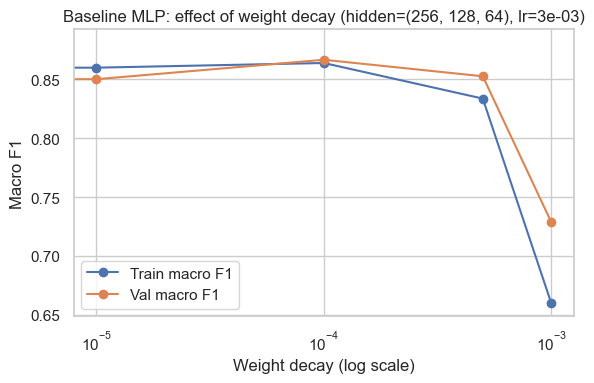

Best weight decay by val macro F1: 0.0 | F1 = 0.8814256144491153


In [34]:
wd_values = [0.0, 1e-5, 1e-4, 5e-4, 1e-3]
results_wd = []

for wd in wd_values:
    print(f"\n=== WD ablation: wd={wd:.0e}, hidden={best_arch}, lr={best_lr:.0e} ===")
    model_cfg, hist_cfg, best_val_f1_cfg = train_baseline_config(
        hidden_dims=best_arch,
        lr=best_lr,
        weight_decay=wd,
        max_epochs=1500,
        patience=5,
        min_delta=0.0,
    )
    results_wd.append({
        "weight_decay": wd,
        "history": hist_cfg,
        "best_val_f1": best_val_f1_cfg,
        "model": model_cfg,
    })

wds = [r["weight_decay"] for r in results_wd]
val_f1_wd   = [r["best_val_f1"] for r in results_wd]
train_f1_wd = [r["history"]["train_macro_f1"][-1] for r in results_wd]

plt.figure(figsize=(6,4))
plt.plot(wds, train_f1_wd, marker="o", label="Train macro F1")
plt.plot(wds, val_f1_wd,   marker="o", label="Val macro F1")
plt.xscale("log")
plt.xlabel("Weight decay (log scale)")
plt.ylabel("Macro F1")
plt.title(f"Baseline MLP: effect of weight decay (hidden={best_arch}, lr={best_lr:.0e})")
plt.legend()
plt.tight_layout()
plt.show()

best_wd_run = max(results_wd, key=lambda r: r["best_val_f1"])
best_wd = best_wd_run["weight_decay"]
print("Best weight decay by val macro F1:", best_wd,
      "| F1 =", best_wd_run["best_val_f1"])


## NOW WE CHOOSE THE BEST MODEL AMONG THE 3 ABLATIONS

In [35]:
# final best baseline run = best from weight decay ablation
best_baseline = best_wd_run
final_model = best_baseline["model"]
final_history = best_baseline["history"]

print("Final baseline config:")
print("  hidden_dims:", best_arch)
print("  lr:", best_lr)
print("  weight_decay:", best_wd)
print("  best val macro F1:", best_baseline["best_val_f1"])


Final baseline config:
  hidden_dims: (256, 128, 64)
  lr: 0.003
  weight_decay: 0.0
  best val macro F1: 0.8814256144491153


              precision    recall  f1-score   support

      class0      0.993     0.925     0.957     11424
      class1      0.740     0.932     0.825      2547
      class2      0.795     0.972     0.874       387
      class3      0.467     1.000     0.636        35

    accuracy                          0.927     14393
   macro avg      0.749     0.957     0.823     14393
weighted avg      0.941     0.927     0.931     14393



<Figure size 500x400 with 0 Axes>

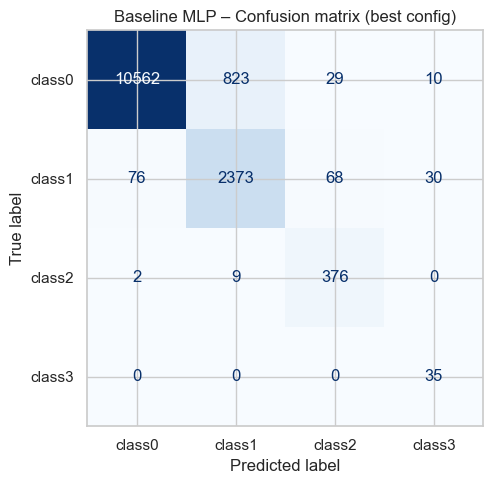

In [36]:
def get_predictions(model, data_loader):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for xb, yb in data_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            logits = model(xb)
            preds = torch.argmax(logits, dim=1)
            all_preds.append(preds.cpu().numpy())
            all_labels.append(yb.cpu().numpy())
    all_preds = np.concatenate(all_preds)
    all_labels = np.concatenate(all_labels)
    return all_labels, all_preds

class_names = ["class0", "class1", "class2", "class3"]  # replace with real names

y_true, y_pred = get_predictions(final_model, val_loader)

print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(5,4))
disp.plot(values_format="d", cmap="Blues", colorbar=False)
plt.title("Baseline MLP – Confusion matrix (best config)")
plt.tight_layout()
plt.show()


## DEEPER MLP

In [37]:
class DeepMLP(nn.Module):
    def __init__(
        self,
        input_dim,
        hidden_dims=(256, 128, 64, 32),
        num_classes=4,
        dropout_p=0.3
    ):
        super().__init__()
        layers = []
        prev = input_dim

        for h in hidden_dims:
            layers.append(nn.Linear(prev, h))
            layers.append(nn.BatchNorm1d(h))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout_p))
            prev = h

        layers.append(nn.Linear(prev, num_classes))
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        return self.net(x)


In [38]:
def train_model(
    model,
    train_loader,
    val_loader,
    class_weights_t,
    num_epochs=1500,
    lr=1e-3,
    weight_decay=0.0,
    verbose=True,
    patience=5,
    min_delta=0.0,
):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights_t)
    optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay
    )

    history = {
        "train_loss": [],
        "val_loss": [],
        "train_macro_f1": [],
        "val_macro_f1": [],
    }

    best_val_f1 = -np.inf
    best_state = None

    # early stopping counter
    patience_counter = 0

    for epoch in range(1, num_epochs + 1):
        train_loss, train_acc, train_f1, _, _ = run_epoch(
            model, train_loader, optimizer, criterion, train=True
        )
        val_loss, val_acc, val_f1, _, _ = run_epoch(
            model, val_loader, optimizer, criterion, train=False
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_macro_f1"].append(train_f1)
        history["val_macro_f1"].append(val_f1)

        # early stopping check (based on val_macro_f1)
        if val_f1 > best_val_f1 + min_delta:
            best_val_f1 = val_f1
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                if verbose:
                    print(f"Early stopping at epoch {epoch:02d}")
                break

        if verbose:
            print(
                f"Epoch {epoch:02d} | "
                f"Train loss {train_loss:.4f}, F1 {train_f1:.4f} | "
                f"Val loss {val_loss:.4f}, F1 {val_f1:.4f}"
            )

    # load best model weights
    model.load_state_dict(best_state)
    return model, history, best_val_f1


In [39]:
torch.manual_seed(RANDOM_STATE)

input_dim = X_train.shape[1]
num_classes = 4

# 1) vary depth & width, fix lr and wd
deep_arch_configs = [
    {"name": "deep_128_64",        "hidden_dims": (128, 64)},
    {"name": "deep_256_128_64",    "hidden_dims": (256, 128, 64)},
    {"name": "deep_256_128_64_32", "hidden_dims": (256, 128, 64, 32)},
    {"name": "deep_512_256_128",   "hidden_dims": (512, 256, 128)},
]

arch_lr = 1e-3            # start with something reasonable (can use best_baseline_lr)
arch_wd = 1e-4            # same idea

def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

deep_arch_results = []

for cfg in deep_arch_configs:
    print(f"\n=== DeepMLP architecture ablation: {cfg['name']} ===")

    model = DeepMLP(
        input_dim=input_dim,
        hidden_dims=cfg["hidden_dims"],
        num_classes=num_classes,
        dropout_p=0.3
    )

    model, history, best_val_f1 = train_model(
        model,
        train_loader,
        val_loader,
        class_weights_t,
        num_epochs=1500,
        lr=arch_lr,
        weight_decay=arch_wd,
        patience=8,
        min_delta=1e-3,
    )

    deep_arch_results.append({
        "name": cfg["name"],
        "hidden_dims": cfg["hidden_dims"],
        "history": history,
        "best_val_f1": best_val_f1,
        "model": model,
        "num_params": count_params(model),     # ← ADD THIS
    })

# pick best architecture by val F1
best_deep_arch_run = max(deep_arch_results, key=lambda r: r["best_val_f1"])
deep_hidden_dims = best_deep_arch_run["hidden_dims"]
print(
    f"Best DeepMLP architecture by val macro F1: "
    f"{deep_hidden_dims} | F1 = {best_deep_arch_run['best_val_f1']}"
)



=== DeepMLP architecture ablation: deep_128_64 ===
Epoch 01 | Train loss 1.0424, F1 0.3308 | Val loss 0.8220, F1 0.3628
Epoch 02 | Train loss 0.8098, F1 0.3763 | Val loss 0.6871, F1 0.3920
Epoch 03 | Train loss 0.7466, F1 0.3961 | Val loss 0.6243, F1 0.4113
Epoch 04 | Train loss 0.6769, F1 0.4158 | Val loss 0.5889, F1 0.4262
Epoch 05 | Train loss 0.6473, F1 0.4280 | Val loss 0.5366, F1 0.4455
Epoch 06 | Train loss 0.6101, F1 0.4403 | Val loss 0.5202, F1 0.4814
Epoch 07 | Train loss 0.5916, F1 0.4511 | Val loss 0.5044, F1 0.4819
Epoch 08 | Train loss 0.5691, F1 0.4661 | Val loss 0.4736, F1 0.4819
Epoch 09 | Train loss 0.5493, F1 0.4721 | Val loss 0.4571, F1 0.5214
Epoch 10 | Train loss 0.5288, F1 0.4827 | Val loss 0.4601, F1 0.4727
Epoch 11 | Train loss 0.5219, F1 0.4858 | Val loss 0.4394, F1 0.4995
Epoch 12 | Train loss 0.5078, F1 0.4940 | Val loss 0.4284, F1 0.5237
Epoch 13 | Train loss 0.5017, F1 0.4987 | Val loss 0.4110, F1 0.5528
Epoch 14 | Train loss 0.5113, F1 0.5025 | Val loss 

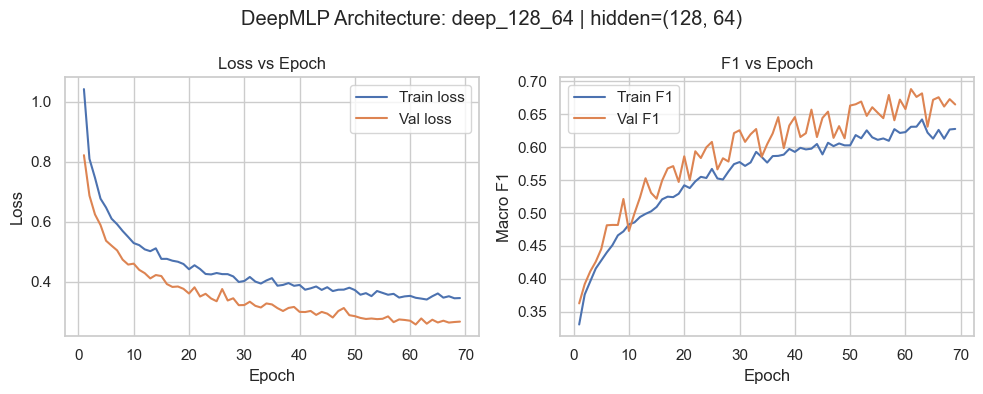

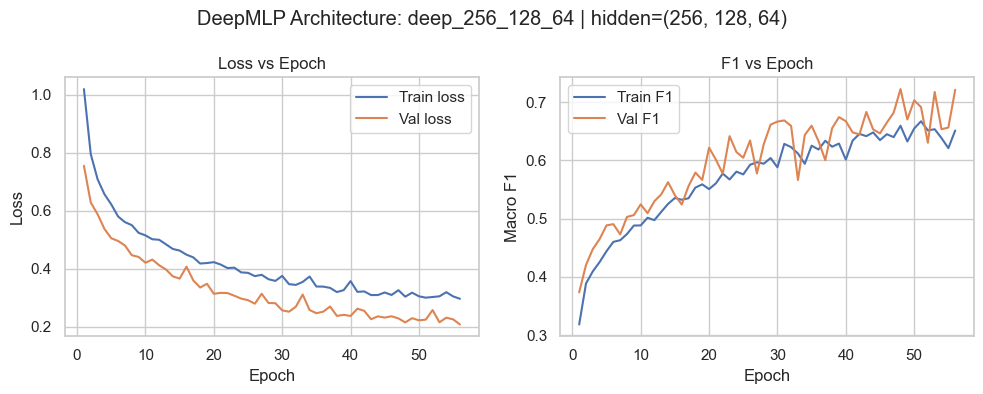

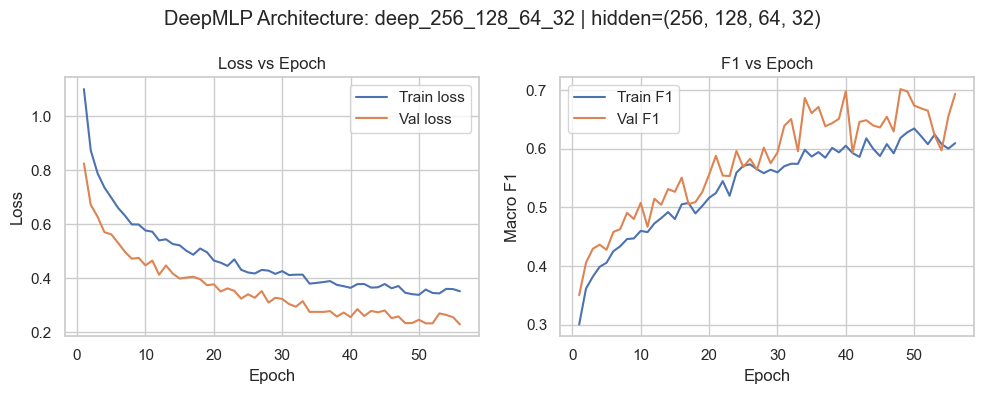

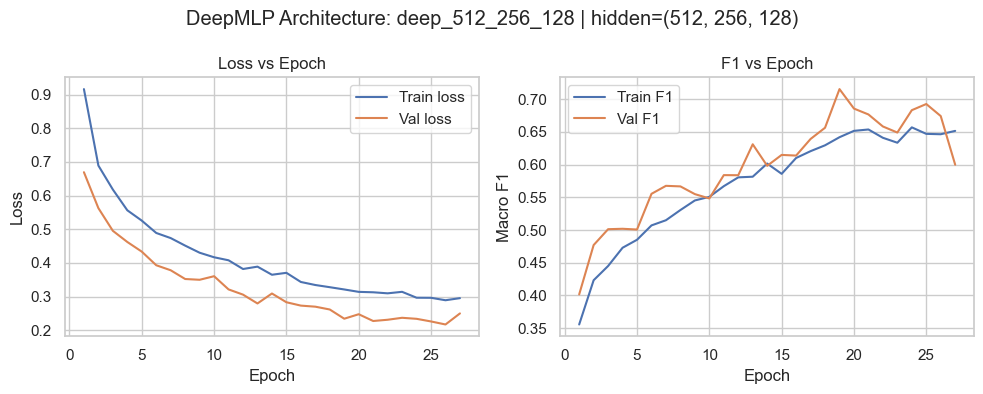

In [40]:
import matplotlib.pyplot as plt

for r in deep_arch_results:
    h = r["history"]
    epochs = range(1, len(h["train_loss"]) + 1)

    plt.figure(figsize=(10, 4))
    plt.suptitle(
        f"DeepMLP Architecture: {r['name']} | hidden={r['hidden_dims']}"
    )

    # Loss Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, h["train_loss"], label="Train loss")
    plt.plot(epochs, h["val_loss"], label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs Epoch")
    plt.legend()

    # F1 Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, h["train_macro_f1"], label="Train F1")
    plt.plot(epochs, h["val_macro_f1"], label="Val F1")
    plt.xlabel("Epoch")
    plt.ylabel("Macro F1")
    plt.title("F1 vs Epoch")
    plt.legend()

    plt.tight_layout()
    plt.show()


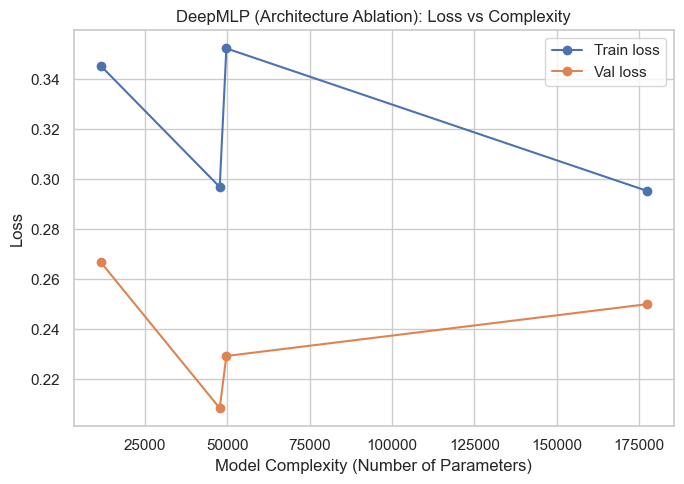

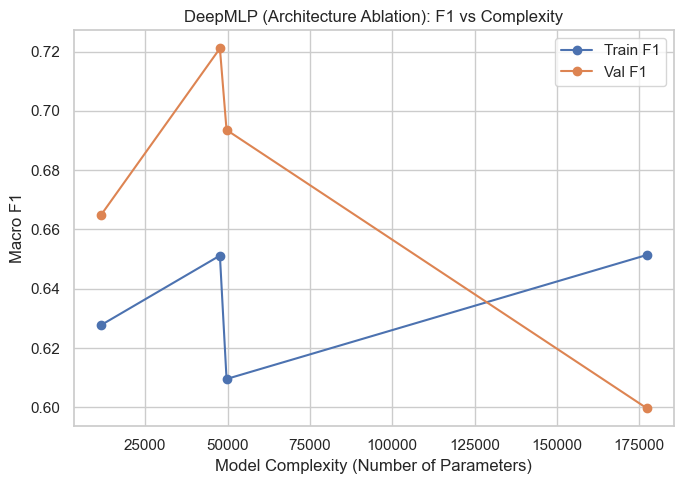

In [41]:
def plot_loss_f1_vs_complexity(results_list, title_prefix="Model"):
    """
    results_list must be a list of dicts where each dict contains:
      - 'num_params'
      - 'history' (with 'train_loss', 'val_loss', 'train_macro_f1', 'val_macro_f1')
    """

    # Sort by param count (complexity)
    sorted_res = sorted(results_list, key=lambda r: r["num_params"])

    complexities = [r["num_params"] for r in sorted_res]
    train_loss = [r["history"]["train_loss"][-1] for r in sorted_res]
    val_loss   = [r["history"]["val_loss"][-1]   for r in sorted_res]
    train_f1   = [r["history"]["train_macro_f1"][-1] for r in sorted_res]
    val_f1     = [r["history"]["val_macro_f1"][-1]   for r in sorted_res]

    # --------------------------
    # LOSS vs COMPLEXITY
    # --------------------------
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_loss, marker="o", label="Train loss")
    plt.plot(complexities, val_loss, marker="o", label="Val loss")
    plt.xlabel("Model Complexity (Number of Parameters)")
    plt.ylabel("Loss")
    plt.title(f"{title_prefix}: Loss vs Complexity")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --------------------------
    # F1 vs COMPLEXITY
    # --------------------------
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_f1, marker="o", label="Train F1")
    plt.plot(complexities, val_f1, marker="o", label="Val F1")
    plt.xlabel("Model Complexity (Number of Parameters)")
    plt.ylabel("Macro F1")
    plt.title(f"{title_prefix}: F1 vs Complexity")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_loss_f1_vs_complexity(deep_arch_results, title_prefix="DeepMLP (Architecture Ablation)")


## Ablation 2 learning rate, using best architecture

In [42]:
deep_lr_values = [3e-4, 1e-3, 3e-3, 1e-2]
deep_lr_results = []

for lr in deep_lr_values:
    print(f"\n=== DeepMLP LR ablation: lr={lr:.0e}, hidden={deep_hidden_dims} ===")

    model = DeepMLP(
        input_dim=input_dim,
        hidden_dims=deep_hidden_dims,
        num_classes=num_classes,
        dropout_p=0.3
    )

    model, history, best_val_f1 = train_model(
        model,
        train_loader,
        val_loader,
        class_weights_t,
        num_epochs=1500,
        lr=lr,
        weight_decay=arch_wd,   # still 1e-4 for now
        verbose=True,
        patience=8,
        min_delta=1e-3,
    )

    deep_lr_results.append({
        "lr": lr,
        "history": history,
        "best_val_f1": best_val_f1,
        "model": model,
    })

best_deep_lr_run = max(deep_lr_results, key=lambda r: r["best_val_f1"])
deep_lr = best_deep_lr_run["lr"]
print(
    f"Best DeepMLP learning rate by val macro F1: "
    f"{deep_lr:.0e} | F1 = {best_deep_lr_run['best_val_f1']}"
)



=== DeepMLP LR ablation: lr=3e-04, hidden=(256, 128, 64) ===
Epoch 01 | Train loss 1.1441, F1 0.3045 | Val loss 0.9712, F1 0.3202
Epoch 02 | Train loss 0.9358, F1 0.3558 | Val loss 0.8110, F1 0.3620
Epoch 03 | Train loss 0.8501, F1 0.3731 | Val loss 0.7287, F1 0.3756
Epoch 04 | Train loss 0.7932, F1 0.3896 | Val loss 0.6739, F1 0.3926
Epoch 05 | Train loss 0.7506, F1 0.3975 | Val loss 0.6364, F1 0.4081
Epoch 06 | Train loss 0.7138, F1 0.4040 | Val loss 0.6138, F1 0.3960
Epoch 07 | Train loss 0.6970, F1 0.4074 | Val loss 0.5831, F1 0.4083
Epoch 08 | Train loss 0.6583, F1 0.4228 | Val loss 0.5675, F1 0.4275
Epoch 09 | Train loss 0.6423, F1 0.4271 | Val loss 0.5520, F1 0.4281
Epoch 10 | Train loss 0.6249, F1 0.4356 | Val loss 0.5195, F1 0.4484
Epoch 11 | Train loss 0.6118, F1 0.4428 | Val loss 0.5380, F1 0.4451
Epoch 12 | Train loss 0.5838, F1 0.4512 | Val loss 0.4955, F1 0.4619
Epoch 13 | Train loss 0.5753, F1 0.4560 | Val loss 0.4794, F1 0.4744
Epoch 14 | Train loss 0.5761, F1 0.4599 |

## Ablation 3 – weight decay, using best arch + best lr

In [43]:
deep_wd_values = [0.0, 1e-5, 1e-4, 5e-4, 1e-3]
deep_wd_results = []

for wd in deep_wd_values:
    print(f"\n=== DeepMLP WD ablation: wd={wd:.0e}, hidden={deep_hidden_dims}, lr={deep_lr:.0e} ===")

    model = DeepMLP(
        input_dim=input_dim,
        hidden_dims=deep_hidden_dims,
        num_classes=num_classes,
        dropout_p=0.3
    )

    model, history, best_val_f1 = train_model(
        model,
        train_loader,
        val_loader,
        class_weights_t,
        num_epochs=1500,
        lr=deep_lr,
        weight_decay=wd,
        verbose=True,
        patience=8,
        min_delta=1e-3,
    )

    deep_wd_results.append({
        "weight_decay": wd,
        "history": history,
        "best_val_f1": best_val_f1,
        "model": model,
    })

best_deep_wd_run = max(deep_wd_results, key=lambda r: r["best_val_f1"])
deep_wd = best_deep_wd_run["weight_decay"]
print(
    f"Best DeepMLP weight decay by val macro F1: "
    f"{deep_wd:.0e} | F1 = {best_deep_wd_run['best_val_f1']}"
)



=== DeepMLP WD ablation: wd=0e+00, hidden=(256, 128, 64), lr=1e-03 ===
Epoch 01 | Train loss 0.9978, F1 0.3332 | Val loss 0.7896, F1 0.3418
Epoch 02 | Train loss 0.7895, F1 0.3831 | Val loss 0.6384, F1 0.4136
Epoch 03 | Train loss 0.7132, F1 0.4017 | Val loss 0.5777, F1 0.4248
Epoch 04 | Train loss 0.6477, F1 0.4262 | Val loss 0.5352, F1 0.4548
Epoch 05 | Train loss 0.6088, F1 0.4416 | Val loss 0.4995, F1 0.4679
Epoch 06 | Train loss 0.5893, F1 0.4514 | Val loss 0.4988, F1 0.4792
Epoch 07 | Train loss 0.5806, F1 0.4560 | Val loss 0.4563, F1 0.5007
Epoch 08 | Train loss 0.5456, F1 0.4738 | Val loss 0.4759, F1 0.4924
Epoch 09 | Train loss 0.5283, F1 0.4848 | Val loss 0.4266, F1 0.5149
Epoch 10 | Train loss 0.5287, F1 0.4881 | Val loss 0.4456, F1 0.4935
Epoch 11 | Train loss 0.5187, F1 0.4983 | Val loss 0.4285, F1 0.5089
Epoch 12 | Train loss 0.4878, F1 0.5116 | Val loss 0.3961, F1 0.5220
Epoch 13 | Train loss 0.4639, F1 0.5264 | Val loss 0.3809, F1 0.5391
Epoch 14 | Train loss 0.4729, F

In [44]:
print("Final DeepMLP config:")
print("  hidden_dims:", deep_hidden_dims)
print("  lr:", deep_lr)
print("  weight_decay:", deep_wd)
print("  best val macro F1:", best_deep_wd_run["best_val_f1"])


Final DeepMLP config:
  hidden_dims: (256, 128, 64)
  lr: 0.001
  weight_decay: 1e-05
  best val macro F1: 0.7339135697059868


## NOW FINAL DEEP MODEL

In [45]:
final_deep_model = DeepMLP(
    input_dim=input_dim,
    hidden_dims=deep_hidden_dims,
    num_classes=num_classes,
    dropout_p=0.3
)

final_deep_model, final_deep_history, final_deep_val_f1 = train_model(
    final_deep_model,
    train_loader,
    val_loader,
    class_weights_t,
    num_epochs=1500,
    lr=deep_lr,
    weight_decay=deep_wd,
    verbose=True,
    patience=8,
    min_delta=1e-3,
)

print("Final DeepMLP – best val macro F1:", final_deep_val_f1)


Epoch 01 | Train loss 1.0015, F1 0.3297 | Val loss 0.7302, F1 0.3967
Epoch 02 | Train loss 0.7778, F1 0.3952 | Val loss 0.6503, F1 0.4221
Epoch 03 | Train loss 0.7086, F1 0.4093 | Val loss 0.5660, F1 0.4614
Epoch 04 | Train loss 0.6485, F1 0.4308 | Val loss 0.5452, F1 0.4521
Epoch 05 | Train loss 0.6064, F1 0.4465 | Val loss 0.5078, F1 0.4650
Epoch 06 | Train loss 0.5775, F1 0.4576 | Val loss 0.4590, F1 0.5216
Epoch 07 | Train loss 0.5455, F1 0.4746 | Val loss 0.4990, F1 0.5088
Epoch 08 | Train loss 0.5481, F1 0.4856 | Val loss 0.4900, F1 0.4609
Epoch 09 | Train loss 0.5170, F1 0.4868 | Val loss 0.4092, F1 0.5379
Epoch 10 | Train loss 0.5042, F1 0.4980 | Val loss 0.3984, F1 0.5424
Epoch 11 | Train loss 0.4951, F1 0.5025 | Val loss 0.4084, F1 0.5258
Epoch 12 | Train loss 0.4680, F1 0.5160 | Val loss 0.3705, F1 0.5923
Epoch 13 | Train loss 0.4666, F1 0.5275 | Val loss 0.3607, F1 0.5658
Epoch 14 | Train loss 0.4519, F1 0.5312 | Val loss 0.3543, F1 0.5902
Epoch 15 | Train loss 0.4645, F1 0

DeepMLP (final) – Test loss: 0.2673
DeepMLP (final) – Test accuracy: 0.7999
DeepMLP (final) – Test macro F1: 0.6519

DeepMLP (final) – Classification report (test):
              precision    recall  f1-score   support

           0      0.978     0.785     0.871     11421
           C      0.488     0.837     0.616      2546
           M      0.526     0.979     0.684       387
           X      0.279     1.000     0.436        36

    accuracy                          0.800     14390
   macro avg      0.567     0.900     0.652     14390
weighted avg      0.877     0.800     0.820     14390



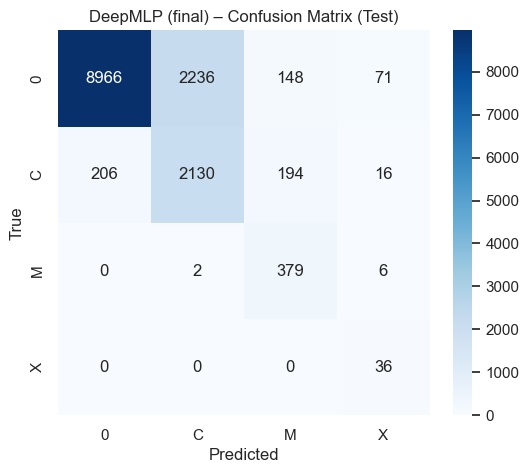

In [46]:
criterion = nn.CrossEntropyLoss(weight=class_weights_t)

test_loss, test_acc, test_f1, y_true_test, y_pred_test = run_epoch(
    final_deep_model, test_loader, optimizer=None, criterion=criterion, train=False
)

print(f"DeepMLP (final) – Test loss: {test_loss:.4f}")
print(f"DeepMLP (final) – Test accuracy: {test_acc:.4f}")
print(f"DeepMLP (final) – Test macro F1: {test_f1:.4f}")

target_names = ["0", "C", "M", "X"]  # your flare classes
print("\nDeepMLP (final) – Classification report (test):")
print(classification_report(y_true_test, y_pred_test, target_names=target_names, digits=3))

cm = confusion_matrix(y_true_test, y_pred_test)
cm_df = pd.DataFrame(cm, index=target_names, columns=target_names)

plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("DeepMLP (final) – Confusion Matrix (Test)")
plt.show()


In [47]:
print("\n=== Final Baseline Model Summary ===")
print(f"  hidden_dims     : {best_arch}")
print(f"  learning_rate   : {best_lr}")
print(f"  weight_decay    : {best_wd}")
print(f"  best val macro F1 : {best_baseline['best_val_f1']:.4f}")



=== Final Baseline Model Summary ===
  hidden_dims     : (256, 128, 64)
  learning_rate   : 0.003
  weight_decay    : 0.0
  best val macro F1 : 0.8814


In [48]:
criterion = nn.CrossEntropyLoss(weight=class_weights_t)

baseline_test_loss, baseline_test_acc, baseline_test_f1, _, _ = run_epoch(
    final_model, test_loader, optimizer=None, criterion=criterion, train=False
)

print("\nBaseline test performance:")
print(f"  Test loss       : {baseline_test_loss:.4f}")
print(f"  Test accuracy   : {baseline_test_acc:.4f}")
print(f"  Test macro F1   : {baseline_test_f1:.4f}")



Baseline test performance:
  Test loss       : 0.1240
  Test accuracy   : 0.9286
  Test macro F1   : 0.8408


In [49]:
best_baseline_test_f1 = baseline_test_f1


In [50]:
print("\n=== Baseline vs DeepMLP comparison ===")

print(f"Baseline – hidden={best_arch}, lr={best_lr}, wd={best_wd}")
print(f"  Best val macro F1: {best_baseline['best_val_f1']:.4f}")
print(f"  Test macro F1     : {best_baseline_test_f1:.4f}")

print(f"\nDeepMLP – hidden={deep_hidden_dims}, lr={deep_lr}, wd={deep_wd}")
print(f"  Best val macro F1: {final_deep_val_f1:.4f}")
print(f"  Test macro F1    : {test_f1:.4f}")



=== Baseline vs DeepMLP comparison ===
Baseline – hidden=(256, 128, 64), lr=0.003, wd=0.0
  Best val macro F1: 0.8814
  Test macro F1     : 0.8408

DeepMLP – hidden=(256, 128, 64), lr=0.001, wd=1e-05
  Best val macro F1: 0.6858
  Test macro F1    : 0.6519


## APPLYING SMOTE TO THE DEEP NEETWORK

Original train class counts: {0: 53297, 1: 11882, 2: 1804, 3: 167}


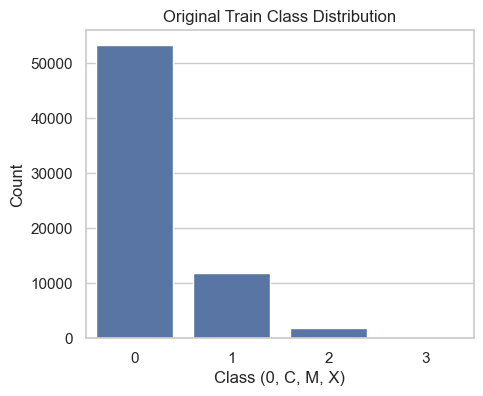

In [ ]:
from imblearn.over_sampling import SMOTE
# Cell 5.2.1: Original train class distribution

train_counts = pd.Series(y_train).value_counts().sort_index()
print("Original train class counts:", train_counts.to_dict())

plt.figure(figsize=(5,4))
sns.barplot(x=train_counts.index, y=train_counts.values)
plt.title("Original Train Class Distribution")
plt.xlabel("Class (0, C, M, X)")
plt.ylabel("Count")
plt.show()



In [52]:
import matplotlib.pyplot as plt
import numpy as np

def plot_class_distribution(y, title):
    classes, counts = np.unique(y, return_counts=True)

    plt.figure(figsize=(6, 4))
    plt.bar(classes, counts, color=["#4C72B0", "#55A868", "#C44E52", "#8172B3"])
    plt.xticks(classes)
    plt.ylabel("Count")
    plt.title(title)
    plt.grid(axis="y", linestyle="--", alpha=0.3)
    plt.show()


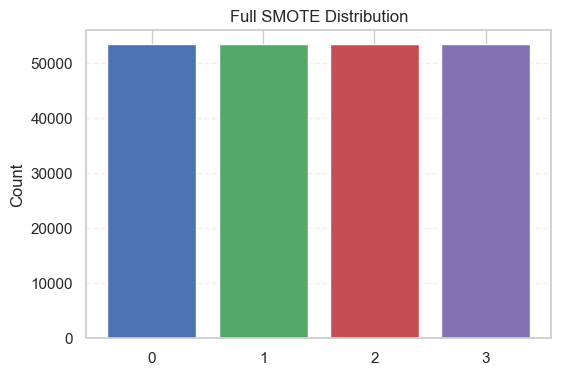

In [61]:
from imblearn.over_sampling import SMOTE

sm_full = SMOTE(random_state=RANDOM_STATE, k_neighbors=3)
X_fullsmote, y_fullsmote = sm_full.fit_resample(X_train, y_train)

X_train_1, X_test_fullsmote, y_train_1, y_test_fullsmote = train_test_split(
    X_fullsmote,
    y_fullsmote,
    test_size=0.15,
    random_state=RANDOM_STATE,
    stratify=y_fullsmote
)

X_train_fullsmote, X_val_fullsmote, y_train_fullsmote, y_val_fullsmote = train_test_split(
    X_train_1,
    y_train_1,
    test_size=0.1765,   # 0.1765 * 0.85 ≈ 0.15 -> total 70/15/15
    random_state=RANDOM_STATE,
    stratify=y_train_1
)


scaler = StandardScaler()
X_train_full_scaled = scaler.fit_transform(X_train_fullsmote)
X_val_full_scaled   = scaler.transform(X_val_fullsmote)
X_test_full_scaled  = scaler.transform(X_test_fullsmote)

plot_class_distribution(y_train_full, "Full SMOTE Distribution")

train_loader_full = DataLoader(
    TensorDataset(torch.tensor(X_train_full_scaled).float(), torch.tensor(y_train_fullsmote).long()),
    batch_size=512,
    shuffle=True
)

Custom sampling strategy: {1: 26648, 2: 26648, 3: 26648}
Custom SMOTE train class counts: {0: 53297, 1: 26648, 2: 26648, 3: 26648}


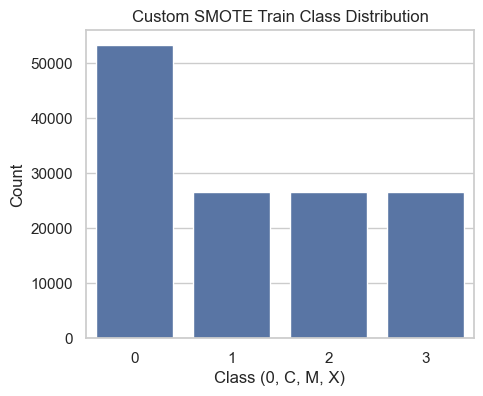

In [62]:
# Cell 5.3.2: Custom moderate SMOTE (optional)

target_perc = 0.5  # aim for each minority to be ~50% of majority

majority_n = train_counts.iloc[0]     # class 0 count
target_n = int(majority_n * target_perc)

sampling_strategy = {
    1: max(train_counts.get(1, 0), target_n),  # C
    2: max(train_counts.get(2, 0), target_n),  # M
    3: max(train_counts.get(3, 0), target_n),  # X
}

print("Custom sampling strategy:", sampling_strategy)

smote_custom = SMOTE(
    sampling_strategy=sampling_strategy,
    random_state=RANDOM_STATE,
    k_neighbors=5
)

X_partial, y_partial = smote_custom.fit_resample(X_train, y_train)



X_train_2, X_test_parsmote, y_train_2, y_test_parsmote = train_test_split(
    X_partial,
    y_partial,
    test_size=0.15,
    random_state=RANDOM_STATE,
    stratify=y_partial
)

X_train_parsmote, X_val_parsmote, y_train_parsmote, y_val_parsmote = train_test_split(
    X_train_2,
    y_train_2,
    test_size=0.1765,   # 0.1765 * 0.85 ≈ 0.15 -> total 70/15/15
    random_state=RANDOM_STATE,
    stratify=y_train_2
)


scaler = StandardScaler()
X_train_par_scaled = scaler.fit_transform(X_train_parsmote)
X_val_par_scaled   = scaler.transform(X_val_parsmote)
X_test_par_scaled  = scaler.transform(X_test_parsmote)


smote_counts = pd.Series(y_partial).value_counts().sort_index()
print("Custom SMOTE train class counts:", smote_counts.to_dict())

plt.figure(figsize=(5,4))
sns.barplot(x=smote_counts.index, y=smote_counts.values)
plt.title("Custom SMOTE Train Class Distribution")
plt.xlabel("Class (0, C, M, X)")
plt.ylabel("Count")
plt.show()

train_loader_partial = DataLoader(
    TensorDataset(torch.tensor(X_train_par_scaled).float(), torch.tensor(y_train_parsmote).long()),
    batch_size=512,
    shuffle=True
)

In [63]:
from imblearn.over_sampling import SMOTE
import pandas as pd

# original counts
class_counts = pd.Series(y_train).value_counts().sort_index()
print("Original train class counts:", class_counts.to_dict())

maj = class_counts[0]  # majority class size

sampling_strategy = {
    1: int(0.4 * maj),  # C  -> ~40% of class 0
    2: int(0.3 * maj),  # M  -> ~30% of class 0
    3: int(0.2 * maj),  # X  -> ~20% of class 0
}

print("Target counts (moderate SMOTE):", sampling_strategy)

smote_mod = SMOTE(
    sampling_strategy=sampling_strategy,
    random_state=RANDOM_STATE,
    k_neighbors=5
)

X_ctrl, y_ctrl = smote_mod.fit_resample(X_train, y_train)

X_train_3, X_test_ctrlsmote, y_train_3, y_test_ctrlsmote = train_test_split(
    X_ctrl,
    y_ctrl,
    test_size=0.15,
    random_state=RANDOM_STATE,
    stratify=y_ctrl
)

X_train_ctrlsmote, X_val_ctrlsmote, y_train_ctrlsmote, y_val_ctrlsmote = train_test_split(
    X_train_3,
    y_train_3,
    test_size=0.1765,   # 0.1765 * 0.85 ≈ 0.15 -> total 70/15/15
    random_state=RANDOM_STATE,
    stratify=y_train_3
)


scaler = StandardScaler()
X_train_ctrl_scaled = scaler.fit_transform(X_train_ctrlsmote)
X_val_ctrl_scaled   = scaler.transform(X_val_ctrlsmote)
X_test_ctrl_scaled  = scaler.transform(X_test_ctrlsmote)


print("After moderate SMOTE:", pd.Series(y_train_ctrlsmote).value_counts().sort_index().to_dict())

train_loader_ctrl = DataLoader(
    TensorDataset(torch.tensor(X_train_ctrl_scaled).float(), torch.tensor(y_train_ctrlsmote).long()),
    batch_size=512,
    shuffle=True
)


Original train class counts: {0: 53297, 1: 11882, 2: 1804, 3: 167}
Target counts (moderate SMOTE): {1: 21318, 2: 15989, 3: 10659}
After moderate SMOTE: {0: 37306, 1: 14922, 2: 11192, 3: 7461}


<Figure size 800x500 with 0 Axes>

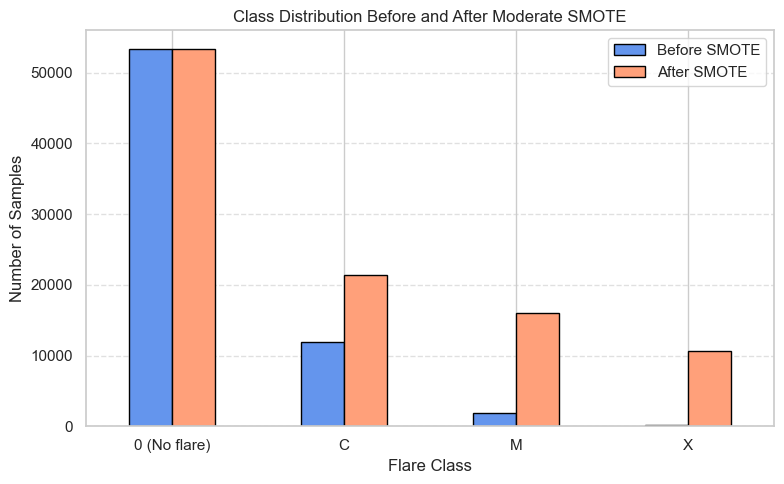

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Count class frequencies after SMOTE
counts_after = pd.Series(y_ctrl).value_counts().sort_index()
counts_before = pd.Series(y_train).value_counts().sort_index()

# Create dataframe for side-by-side plot
df_counts = pd.DataFrame({
    'Before SMOTE': counts_before,
    'After SMOTE': counts_after
})
df_counts.index = ['0 (No flare)', 'C', 'M', 'X']

# Plot
plt.figure(figsize=(8,5))
df_counts.plot(kind='bar', color=['#6495ED', '#FFA07A'], edgecolor='black')
plt.title('Class Distribution Before and After Moderate SMOTE')
plt.ylabel('Number of Samples')
plt.xlabel('Flare Class')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()


In [67]:
def train_deep_variant(name, train_loader):
    print(f"\n=== Deep + {name} ===")
    model = DeepMLP(
        input_dim=input_dim,
        hidden_dims=deep_hidden_dims,
        num_classes=4,
        dropout_p=0.3
    )
    print(deep_hidden_dims)
    model, history, best_val_f1 = train_model(
        model,
        train_loader,
        val_loader,
        class_weights_t,
        num_epochs=1500,
        lr=deep_lr,
        weight_decay=deep_wd,
        patience=8,
        min_delta=1e-3,
        verbose=True
    )
    return {"name": name, "model": model, "history": history, "val_f1": best_val_f1}

deep_smote_results = []

deep_smote_results.append(train_deep_variant("no_smote", train_loader))
deep_smote_results.append(train_deep_variant("full_smote", train_loader_full))
deep_smote_results.append(train_deep_variant("partial_smote", train_loader_partial))
deep_smote_results.append(train_deep_variant("controlled_smote", train_loader_ctrl))



=== Deep + no_smote ===
(256, 128, 64)
Epoch 01 | Train loss 1.0169, F1 0.3217 | Val loss 0.7715, F1 0.3701
Epoch 02 | Train loss 0.7727, F1 0.3823 | Val loss 0.6225, F1 0.4508
Epoch 03 | Train loss 0.7137, F1 0.4024 | Val loss 0.5845, F1 0.4199
Epoch 04 | Train loss 0.6460, F1 0.4266 | Val loss 0.5455, F1 0.4474
Epoch 05 | Train loss 0.6211, F1 0.4357 | Val loss 0.5261, F1 0.4496
Epoch 06 | Train loss 0.5784, F1 0.4592 | Val loss 0.4749, F1 0.4958
Epoch 07 | Train loss 0.5651, F1 0.4613 | Val loss 0.4721, F1 0.4789
Epoch 08 | Train loss 0.5577, F1 0.4721 | Val loss 0.4536, F1 0.4945
Epoch 09 | Train loss 0.5180, F1 0.4915 | Val loss 0.4175, F1 0.5259
Epoch 10 | Train loss 0.5018, F1 0.5042 | Val loss 0.4129, F1 0.5598
Epoch 11 | Train loss 0.4975, F1 0.5106 | Val loss 0.4469, F1 0.5321
Epoch 12 | Train loss 0.4990, F1 0.5067 | Val loss 0.4007, F1 0.5411
Epoch 13 | Train loss 0.4683, F1 0.5154 | Val loss 0.3781, F1 0.5753
Epoch 14 | Train loss 0.4697, F1 0.5226 | Val loss 0.3896, F1 0

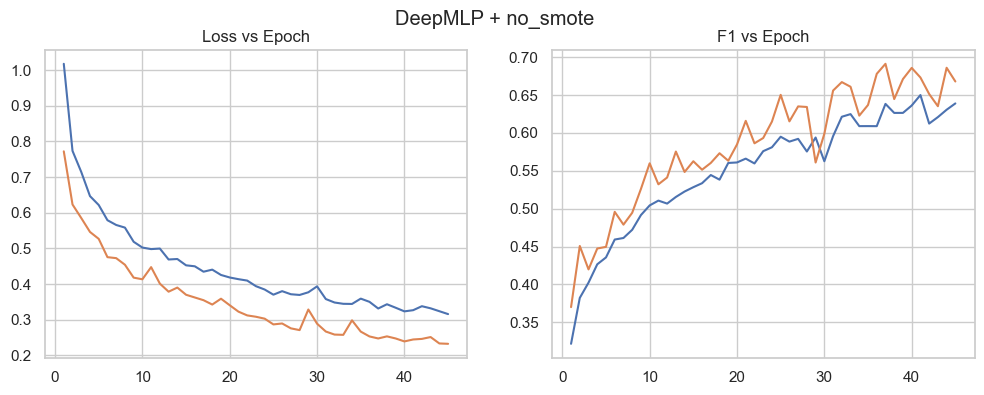

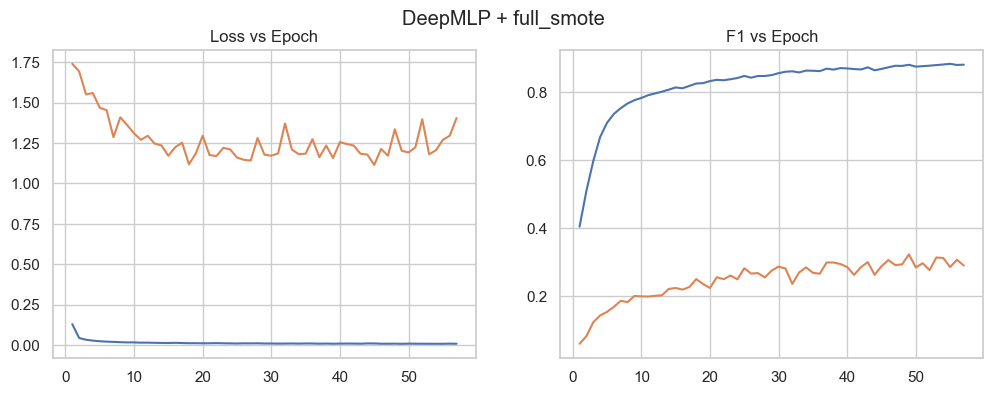

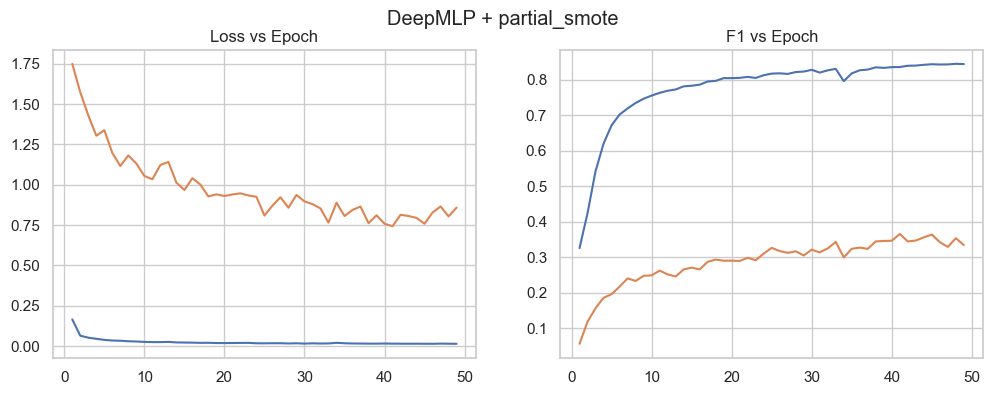

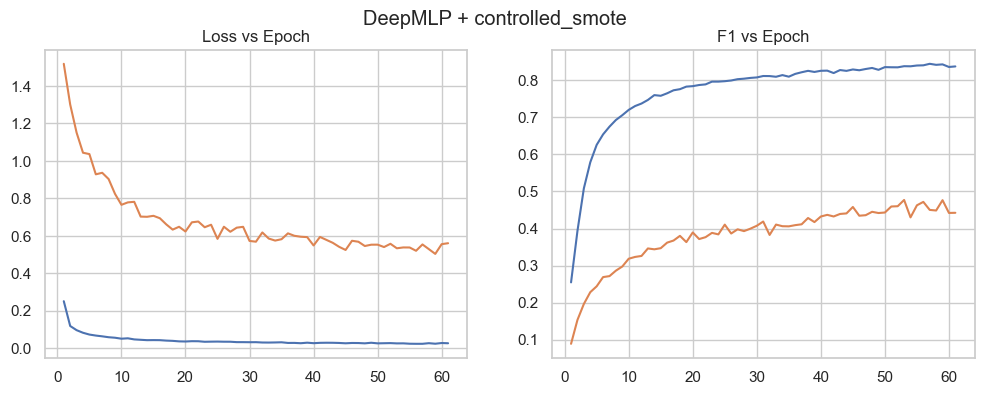

In [68]:
for r in deep_smote_results:
    h = r["history"]
    epochs = range(1, len(h["train_loss"]) + 1)

    plt.figure(figsize=(12, 4))
    plt.suptitle(f"DeepMLP + {r['name']}")

    plt.subplot(1, 2, 1)
    plt.plot(epochs, h["train_loss"])
    plt.plot(epochs, h["val_loss"])
    plt.title("Loss vs Epoch")

    plt.subplot(1, 2, 2)
    plt.plot(epochs, h["train_macro_f1"])
    plt.plot(epochs, h["val_macro_f1"])
    plt.title("F1 vs Epoch")

    plt.show()


In [69]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

def eval_and_plot_model(model, data_loader, class_names, title):
    model.to(device)
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for xb, yb in data_loader:
            xb = xb.to(device)
            yb = yb.to(device)

            logits = model(xb)
            preds = torch.argmax(logits, dim=1)

            all_preds.append(preds.cpu().numpy())
            all_labels.append(yb.cpu().numpy())

    y_true = np.concatenate(all_labels)
    y_pred = np.concatenate(all_preds)

    # text summary
    print(f"\n===== {title} =====")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

    # confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    plt.figure(figsize=(5, 4))
    disp.plot(values_format="d", cmap="Blues", colorbar=False)
    plt.title(f"Confusion matrix – {title}")
    plt.tight_layout()
    plt.show()



===== DeepMLP + no_smote =====
              precision    recall  f1-score   support

           0      0.984     0.801     0.883     11424
           C      0.518     0.870     0.650      2547
           M      0.557     0.982     0.711       387
           X      0.271     1.000     0.427        35

    accuracy                          0.819     14393
   macro avg      0.583     0.913     0.668     14393
weighted avg      0.888     0.819     0.836     14393



<Figure size 500x400 with 0 Axes>

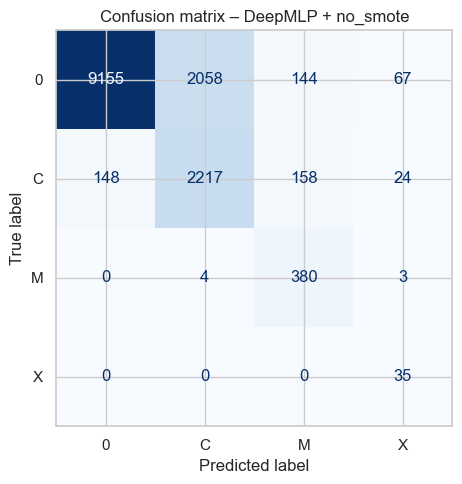


===== DeepMLP + full_smote =====
              precision    recall  f1-score   support

           0      1.000     0.288     0.448     11424
           C      0.194     0.615     0.294      2547
           M      0.136     0.974     0.238       387
           X      0.105     0.686     0.183        35

    accuracy                          0.365     14393
   macro avg      0.359     0.641     0.291     14393
weighted avg      0.832     0.365     0.414     14393



<Figure size 500x400 with 0 Axes>

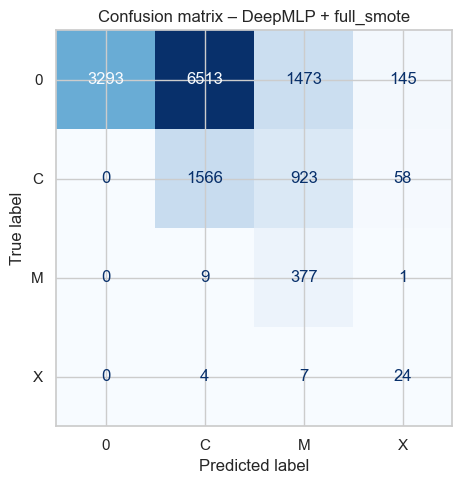


===== DeepMLP + partial_smote =====
              precision    recall  f1-score   support

           0      0.996     0.394     0.565     11424
           C      0.221     0.623     0.326      2547
           M      0.167     0.984     0.286       387
           X      0.088     1.000     0.161        35

    accuracy                          0.452     14393
   macro avg      0.368     0.750     0.334     14393
weighted avg      0.835     0.452     0.514     14393



<Figure size 500x400 with 0 Axes>

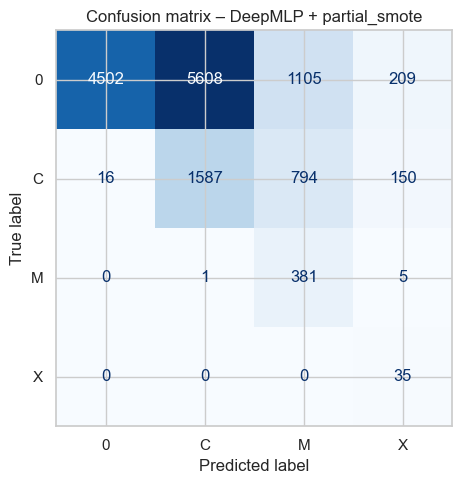


===== DeepMLP + controlled_smote =====
              precision    recall  f1-score   support

           0      0.995     0.528     0.690     11424
           C      0.297     0.758     0.426      2547
           M      0.239     0.984     0.384       387
           X      0.156     1.000     0.269        35

    accuracy                          0.582     14393
   macro avg      0.422     0.818     0.443     14393
weighted avg      0.849     0.582     0.634     14393



<Figure size 500x400 with 0 Axes>

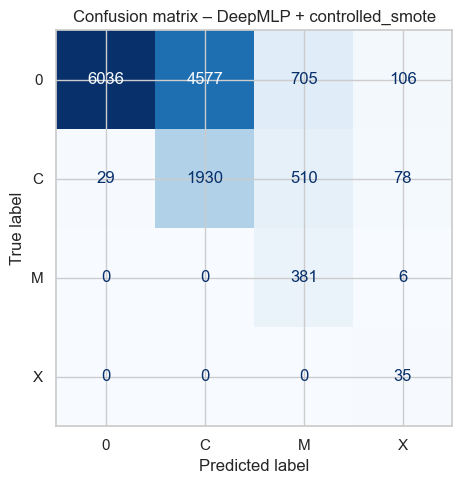

In [70]:
class_names = ["0", "C", "M", "X"]  # adjust if needed

for r in deep_smote_results:
    eval_and_plot_model(
        model=r["model"],
        data_loader=val_loader,          # or test_loader
        class_names=class_names,
        title=f"DeepMLP + {r['name']}"
    )


In [71]:
best_smote_run = max(deep_smote_results, key=lambda r: r["val_f1"])
best_smote_model = best_smote_run["model"]

test_loss, test_acc, test_f1, y_true, y_pred = run_epoch(
    best_smote_model, test_loader, optimizer=None, criterion=criterion, train=False
)

print("\nBest SMOTE variant:", best_smote_run["name"])
print("Val macro F1:", best_smote_run["val_f1"])
print("Test macro F1:", test_f1)



Best SMOTE variant: no_smote
Val macro F1: 0.6909905183379494
Test macro F1: 0.6793994828075842


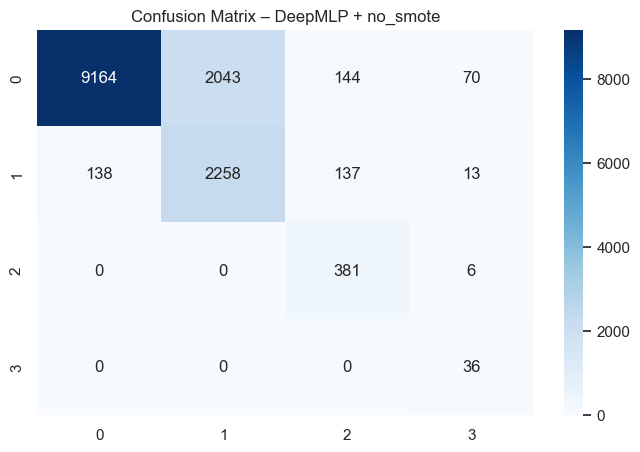

In [72]:
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, cmap="Blues", fmt="d")
plt.title(f"Confusion Matrix – DeepMLP + {best_smote_run['name']}")
plt.show()


# NOW HERE WE TRY EVERY SINGLE ONE ALONE TO SEE IF OVERFITTING OR UNDERFITTING WE INCREASE THE COMPLEXITY HERE

In [73]:
# Deep model configs for complexity ablation on SMOTE data
deep_smote_configs = [
    {"name": "d128",          "hidden_dims": (128,)},
    {"name": "d256_128",      "hidden_dims": (256, 128)},
    {"name": "d256_128_64",   "hidden_dims": (256, 128, 64)},
    {"name": "d512_256_128",  "hidden_dims": (512, 256, 128)},
    {"name": "d512_512_256",  "hidden_dims": (512, 512, 256)},
]

# use the best LR / WD you found earlier for DeepMLP
deep_lr = 0.001       # replace with your best value
deep_wd = 1e-5       # replace with your best value


In [74]:
def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
def run_deep_arch_ablation_on_loader(variant_name, train_loader):
    print(f"\n=== DeepMLP complexity ablation on {variant_name} ===")
    variant_results = []

    for cfg in deep_smote_configs:
        print(f"\n  >> Config {cfg['name']} | hidden_dims={cfg['hidden_dims']}")
        model = DeepMLP(
            input_dim=input_dim,
            hidden_dims=cfg["hidden_dims"],
            num_classes=4,
            dropout_p=0.3
        )

        model, history, best_val_f1 = train_model(
            model,
            train_loader,
            val_loader,
            class_weights_t,
            num_epochs=200,
            lr=deep_lr,
            weight_decay=deep_wd,
            patience=8,
            min_delta=1e-3,
            verbose=True
        )

        num_params = count_params(model)

        variant_results.append({
            "variant": variant_name,
            "name": cfg["name"],
            "hidden_dims": cfg["hidden_dims"],
            "num_params": num_params,
            "model": model,
            "history": history,
            "best_val_f1": best_val_f1,
        })

    return variant_results


In [75]:
smote_variants = {
    "full_smote":       train_loader_full,
    "partial_smote":    train_loader_partial,
    "controlled_smote": train_loader_ctrl,
}

deep_smote_arch_results = {}

for var_name, loader in smote_variants.items():
    deep_smote_arch_results[var_name] = run_deep_arch_ablation_on_loader(
        var_name, loader
    )



=== DeepMLP complexity ablation on full_smote ===

  >> Config d128 | hidden_dims=(128,)
Epoch 01 | Train loss 0.2221, F1 0.2778 | Val loss 2.4059, F1 0.0184
Epoch 02 | Train loss 0.0790, F1 0.3720 | Val loss 2.1552, F1 0.0413
Epoch 03 | Train loss 0.0565, F1 0.4591 | Val loss 1.9516, F1 0.0598
Epoch 04 | Train loss 0.0471, F1 0.5345 | Val loss 1.9424, F1 0.0873
Epoch 05 | Train loss 0.0421, F1 0.5924 | Val loss 1.8740, F1 0.1047
Epoch 06 | Train loss 0.0384, F1 0.6280 | Val loss 1.8164, F1 0.1215
Epoch 07 | Train loss 0.0357, F1 0.6504 | Val loss 1.6934, F1 0.1329
Epoch 08 | Train loss 0.0335, F1 0.6672 | Val loss 1.7381, F1 0.1348
Epoch 09 | Train loss 0.0316, F1 0.6798 | Val loss 1.6298, F1 0.1458
Epoch 10 | Train loss 0.0302, F1 0.6879 | Val loss 1.6282, F1 0.1450
Epoch 11 | Train loss 0.0288, F1 0.6986 | Val loss 1.5789, F1 0.1456
Epoch 12 | Train loss 0.0280, F1 0.7042 | Val loss 1.5815, F1 0.1515
Epoch 13 | Train loss 0.0267, F1 0.7121 | Val loss 1.5567, F1 0.1561
Epoch 14 | Tr

In [76]:
import matplotlib.pyplot as plt
import numpy as np

def plot_complexity_curves(results_list, title_prefix):
    # sort by number of parameters
    res_sorted = sorted(results_list, key=lambda r: r["num_params"])

    complexities = [r["num_params"] for r in res_sorted]
    train_loss   = [r["history"]["train_loss"][-1] for r in res_sorted]
    val_loss     = [r["history"]["val_loss"][-1]   for r in res_sorted]
    train_f1     = [r["history"]["train_macro_f1"][-1] for r in res_sorted]
    val_f1       = [r["history"]["val_macro_f1"][-1]   for r in res_sorted]

    # Loss vs complexity
    plt.figure(figsize=(7, 5))
    plt.plot(complexities, train_loss, marker="o", label="Train loss")
    plt.plot(complexities, val_loss, marker="o", label="Val loss")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Loss")
    plt.title(f"{title_prefix}: train/val loss vs complexity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # F1 vs complexity
    plt.figure(figsize=(7, 5))
    plt.plot(complexities, train_f1, marker="o", label="Train macro F1")
    plt.plot(complexities, val_f1, marker="o", label="Val macro F1")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Macro F1")
    plt.title(f"{title_prefix}: train/val F1 vs complexity")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()


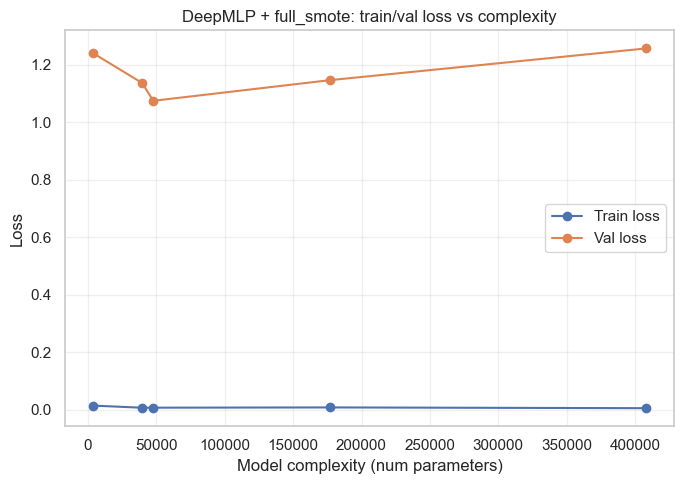

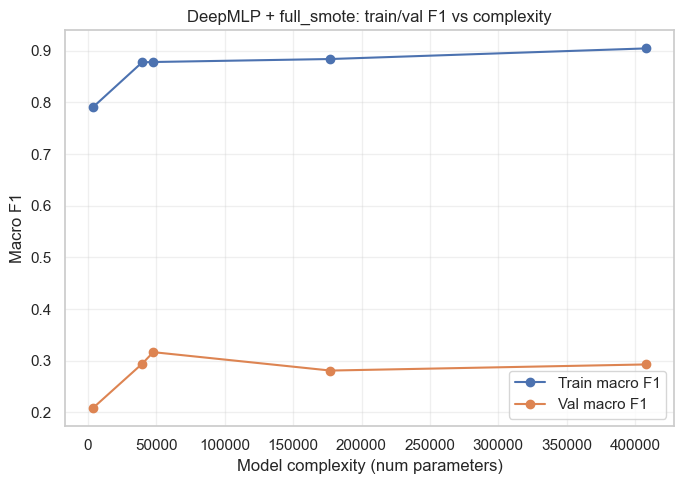

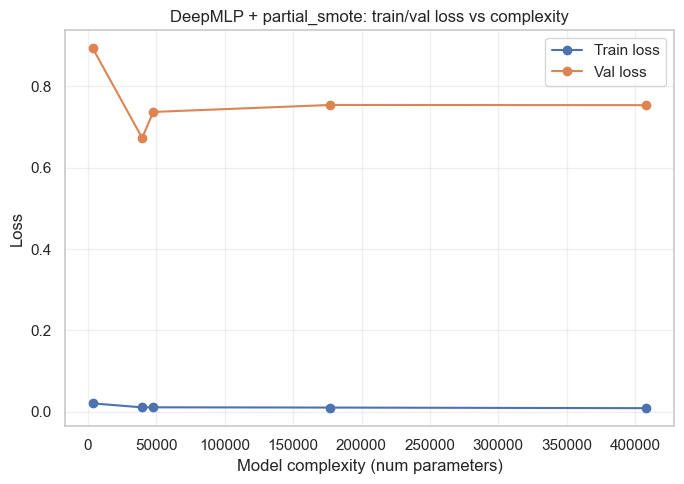

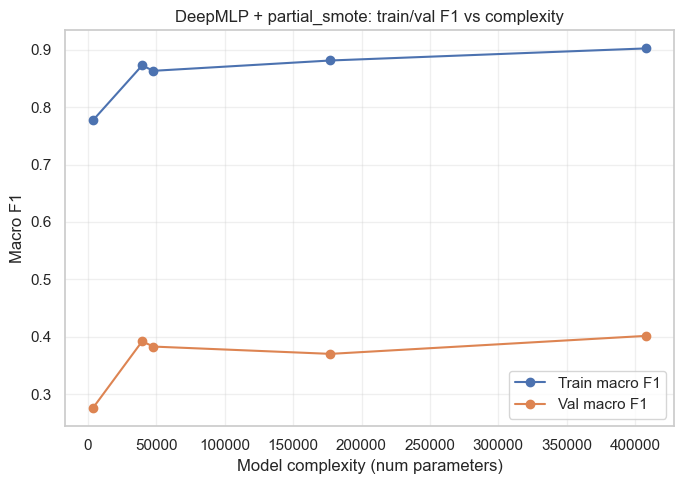

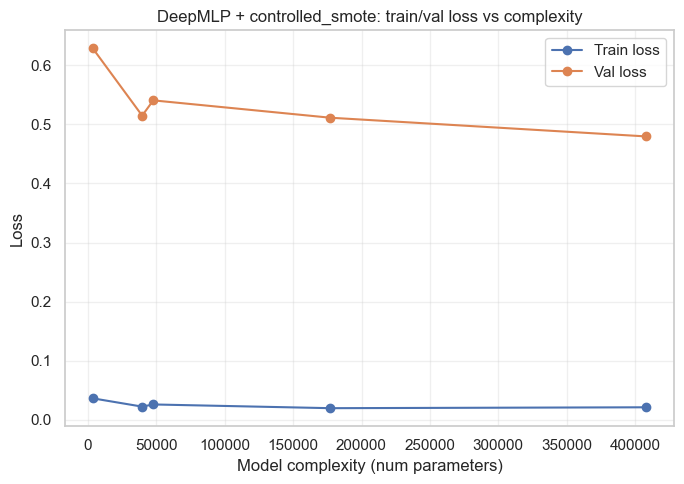

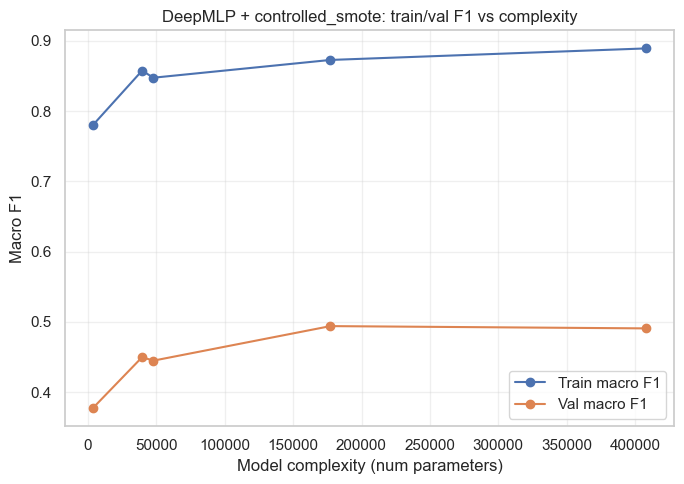

In [77]:
for var_name, res_list in deep_smote_arch_results.items():
    plot_complexity_curves(res_list, f"DeepMLP + {var_name}")


## FOCAL LOSS WITH THE 4 MODELS ABOVE

In [79]:
# 1. Imports and global config
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score

import torch
from torch import nn
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F

# Plot style
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (8,5)
RANDOM_STATE = 42
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


In [80]:
# 2. Load dataset
DATA_PATH =r"C:\Users\admin\Desktop\Dataset\Validation_Data_by_AR.csv"  # update path if needed
df = pd.read_csv(DATA_PATH)

print("Shape:", df.shape)
print("Columns:", len(df.columns))
display(df.head())


Shape: (95933, 32)
Columns: 32


,grad_mean,grad_std,grad_median,grad_min,grad_max,grad_skewness,grad_kurtosis,nl_length,nl_num_fragments,nl_grad_weighted_length,...,wavelet_energy_3,wavelet_energy_4,wavelet_energy_5,flux_unsigned,flux_signed,flux_negative,flux_positive,class_label,flare_strength,image_path
0,0.088865,0.123889,0.067672,6.970000e-15,0.062065,0.065042,0.005481,0.004564,0.007859,0.454516,...,0.077134,0.063655,0.064294,0.039729,0.955609,0.484761,0.031962,0,0,1064_hmi.M_720s.20100501_000000_TAI.1.magnetog...
1,0.088015,0.123875,0.065964,0.000000e+00,0.061718,0.064940,0.005449,0.006460,0.010478,0.454045,...,0.077012,0.063388,0.064738,0.039485,0.955798,0.484666,0.031735,0,0,1064_hmi.M_720s.20100501_001200_TAI.1.magnetog...
2,0.088024,0.124069,0.065912,2.773501e-01,0.065522,0.065113,0.005458,0.005863,0.010478,0.457687,...,0.076065,0.064053,0.064150,0.039331,0.955774,0.484451,0.031661,0,0,1064_hmi.M_720s.20100501_002400_TAI.1.magnetog...
3,0.088125,0.124757,0.065166,2.460000e-15,0.061962,0.064936,0.005430,0.007197,0.012133,0.442897,...,0.075074,0.064159,0.064113,0.039374,0.955674,0.484395,0.031734,0,0,1064_hmi.M_720s.20100501_003600_TAI.1.magnetog...
4,0.088481,0.125191,0.065047,4.690000e-15,0.059259,0.063794,0.005219,0.002703,0.003033,0.444012,...,0.075782,0.063614,0.065080,0.039516,0.955530,0.484414,0.031883,0,0,1064_hmi.M_720s.20100501_004800_TAI.1.magnetog...


flare_class4
0    76142
C    16975
M     2578
X      238
Name: count, dtype: int64


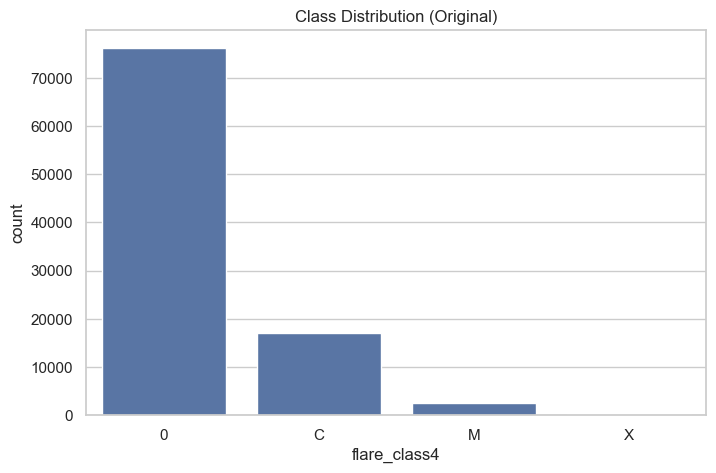

In [81]:
# 3. Map flare_strength to 4 coarse classes
def map_flare_class(fs):
    if fs == 0 or str(fs) == "0":
        return "0"
    s = str(fs)
    if s.startswith("C"): return "C"
    if s.startswith("M"): return "M"
    if s.startswith("X"): return "X"
    return "other"

df["flare_class4"] = df["flare_strength"].apply(map_flare_class)
print(df["flare_class4"].value_counts())

sns.countplot(x="flare_class4", data=df, order=["0","C","M","X"])
plt.title("Class Distribution (Original)")
plt.show()


In [82]:
# 7. Focal Loss
class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        log_probs = F.log_softmax(inputs, dim=1)
        probs = torch.exp(log_probs)
        targets_one_hot = F.one_hot(targets, num_classes=inputs.shape[1]).to(inputs.device)

        pt = (probs * targets_one_hot).sum(1)
        log_pt = (log_probs * targets_one_hot).sum(1)

        if self.alpha is not None:
            at = self.alpha.gather(0, targets)
            loss = -at * (1 - pt)**self.gamma * log_pt
        else:
            loss = -(1 - pt)**self.gamma * log_pt

        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        else:
            return loss


In [83]:
# 8. Compute alpha (inverse-frequency weights)
class_counts = pd.Series(y_train).value_counts().sort_index()
alpha = 1.0 / class_counts
alpha = alpha / alpha.sum()
alpha_t = torch.tensor(alpha.values, dtype=torch.float32).to(device)
print("Alpha (class weights):", alpha_t)


Alpha (class weights): tensor([0.0028, 0.0127, 0.0834, 0.9011], device='cuda:0')


In [84]:
# 9. Helper function
def run_epoch(model, loader, optimizer, criterion, train=True):
    if train:
        model.train()
    else:
        model.eval()
    total_loss, preds, targets = 0, [], []

    for xb, yb in loader:
        xb, yb = xb.to(device), yb.to(device)
        if train:
            optimizer.zero_grad()
        logits = model(xb)
        loss = criterion(logits, yb)
        if train:
            loss.backward()
            optimizer.step()
        total_loss += loss.item() * xb.size(0)
        preds.extend(torch.argmax(logits, 1).cpu().numpy())
        targets.extend(yb.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)
    acc = accuracy_score(targets, preds)
    macro_f1 = f1_score(targets, preds, average="macro")
    return avg_loss, acc, macro_f1, targets, preds


In [88]:
gamma_values = [1.0, 1.5, 2.0, 2.5, 3.0]

smote_variants = {
    "no_smote":        train_loader,
    "full_smote":      train_loader_full,
    "partial_smote":   train_loader_partial,
    "controlled_smote": train_loader_ctrl,
}


In [90]:
deep_smote_configs = [
    {"name": "d128",          "hidden_dims": (128,)},
    {"name": "d256_128",      "hidden_dims": (256, 128)},
    {"name": "d256_128_64",   "hidden_dims": (256, 128, 64)},
    {"name": "d512_256_128",  "hidden_dims": (512, 256, 128)},
    {"name": "d512_512_256",  "hidden_dims": (512, 512, 256)},
]
deep_lr = 0.001       # replace with your best value
deep_wd = 1e-5       # replace with your best value



In [93]:
gamma_values = [1.0, 1.5, 2.0, 2.5, 3.0]

def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


In [94]:
def run_focal_arch_gamma_ablation(variant_name, train_loader,
                                  gammas=gamma_values,
                                  max_epochs=1500,
                                  patience=8,
                                  min_delta=1e-3):

    print(f"\n=== DeepMLP + {variant_name} – focal loss arch × gamma ablation ===")
    results = []

    for cfg in deep_smote_configs:
        for gamma in gammas:
            print(f"\n  >> config={cfg['name']} hidden={cfg['hidden_dims']} | gamma={gamma}")

            torch.manual_seed(RANDOM_STATE)

            model = DeepMLP(
                input_dim=input_dim,
                hidden_dims=cfg["hidden_dims"],
                num_classes=4,
                dropout_p=0.3
            ).to(device)

            # focal loss with class weights in alpha (optional)
            alpha = class_weights_t.to(device) if class_weights_t is not None else None
            criterion = FocalLoss(alpha=alpha, gamma=gamma)

            optimizer = torch.optim.Adam(
                model.parameters(),
                lr=deep_lr,
                weight_decay=deep_wd
            )

            history = {
                "train_loss": [],
                "val_loss": [],
                "train_macro_f1": [],
                "val_macro_f1": [],
            }

            best_val_f1 = -float("inf")
            best_state = None
            patience_counter = 0

            for epoch in range(1, max_epochs + 1):
                train_loss, train_acc, train_f1, _, _ = run_epoch(
                    model, train_loader, optimizer, criterion, train=True
                )
                val_loss, val_acc, val_f1, _, _ = run_epoch(
                    model, val_loader, optimizer, criterion, train=False
                )

                history["train_loss"].append(train_loss)
                history["val_loss"].append(val_loss)
                history["train_macro_f1"].append(train_f1)
                history["val_macro_f1"].append(val_f1)

                if val_f1 > best_val_f1 + min_delta:
                    best_val_f1 = val_f1
                    best_state = model.state_dict()
                    patience_counter = 0
                else:
                    patience_counter += 1
                    if patience_counter >= patience:
                        print(f"     Early stopping at epoch {epoch:02d}")
                        break

                print(
                    f"     Epoch {epoch:02d} | "
                    f"Train loss {train_loss:.4f}, F1 {train_f1:.4f} | "
                    f"Val loss {val_loss:.4f}, F1 {val_f1:.4f}"
                )

            if best_state is not None:
                model.load_state_dict(best_state)

            results.append({
                "variant": variant_name,
                "config_name": cfg["name"],
                "hidden_dims": cfg["hidden_dims"],
                "gamma": gamma,
                "num_params": count_params(model),
                "model": model,
                "history": history,
                "best_val_f1": best_val_f1,
            })

    return results


In [95]:
focal_arch_gamma_results = {}

for var_name, loader in smote_variants.items():
    focal_arch_gamma_results[var_name] = run_focal_arch_gamma_ablation(
        variant_name=var_name,
        train_loader=loader
    )



=== DeepMLP + no_smote – focal loss arch × gamma ablation ===

  >> config=d128 hidden=(128,) | gamma=1.0
     Epoch 01 | Train loss 0.0250, F1 0.3296 | Val loss 0.0197, F1 0.3671
     Epoch 02 | Train loss 0.0181, F1 0.3938 | Val loss 0.0156, F1 0.4111
     Epoch 03 | Train loss 0.0157, F1 0.4097 | Val loss 0.0140, F1 0.4465
     Epoch 04 | Train loss 0.0142, F1 0.4235 | Val loss 0.0125, F1 0.4439
     Epoch 05 | Train loss 0.0131, F1 0.4366 | Val loss 0.0118, F1 0.4524
     Epoch 06 | Train loss 0.0126, F1 0.4448 | Val loss 0.0114, F1 0.4548
     Epoch 07 | Train loss 0.0120, F1 0.4499 | Val loss 0.0110, F1 0.4714
     Epoch 08 | Train loss 0.0120, F1 0.4554 | Val loss 0.0107, F1 0.4852
     Epoch 09 | Train loss 0.0115, F1 0.4645 | Val loss 0.0103, F1 0.4950
     Epoch 10 | Train loss 0.0112, F1 0.4731 | Val loss 0.0100, F1 0.4890
     Epoch 11 | Train loss 0.0109, F1 0.4745 | Val loss 0.0099, F1 0.5063
     Epoch 12 | Train loss 0.0109, F1 0.4766 | Val loss 0.0100, F1 0.4812
     

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# assume: test_loader exists on the original (non-SMOTE) test set

def evaluate_on_test(model, gamma, num_classes=4):
    """
    Evaluates a trained model on the global test_loader
    and returns metrics, report, and confusion matrix.
    """
    model.eval()
    
    # rebuild the same focal loss used in training
    alpha_eval = class_weights_t.to(device) if class_weights_t is not None else None
    criterion_eval = FocalLoss(alpha=alpha_eval, gamma=gamma)

    test_loss, test_acc, test_f1, y_true, y_pred = run_epoch(
        model,
        test_loader,
        optimizer=None,
        criterion=criterion_eval,
        train=False
    )

    report = classification_report(y_true, y_pred, digits=4)
    cm = confusion_matrix(y_true, y_pred, labels=list(range(num_classes)))

    return {
        "test_loss": test_loss,
        "test_acc": test_acc,
        "test_macro_f1": test_f1,
        "y_true": y_true,
        "y_pred": y_pred,
        "report": report,
        "cm": cm,
    }


In [ ]:
# evaluate every model in focal_arch_gamma_results on the same test_loader

for var_name, results_list in focal_arch_gamma_results.items():
    print(f"\n=== Testing models for variant: {var_name} ===")
    for res in results_list:
        model = res["model"]
        gamma = res["gamma"]

        test_metrics = evaluate_on_test(model, gamma=gamma, num_classes=4)

        # attach everything to the result dict
        res["test_loss"]       = test_metrics["test_loss"]
        res["test_acc"]        = test_metrics["test_acc"]
        res["test_macro_f1"]   = test_metrics["test_macro_f1"]
        res["y_true"]          = test_metrics["y_true"]
        res["y_pred"]          = test_metrics["y_pred"]
        res["confusion_matrix"] = test_metrics["cm"]
        res["classification_report"] = test_metrics["report"]

        # short console summary for trace
        print(
            f"  cfg={res['config_name']:<12} "
            f"gamma={gamma:<3} "
            f"params={res['num_params']:<8} "
            f"val_F1={res['best_val_f1']:.4f} "
            f"test_acc={res['test_acc']:.4f} "
            f"test_F1={res['test_macro_f1']:.4f}"
        )



=== Testing models for variant: no_smote ===
  cfg=d128         gamma=1.0 params=3460     val_F1=0.5865 test_acc=0.7379 test_F1=0.5634
  cfg=d128         gamma=1.5 params=3460     val_F1=0.6207 test_acc=0.7368 test_F1=0.6054
  cfg=d128         gamma=2.0 params=3460     val_F1=0.5890 test_acc=0.7503 test_F1=0.5801
  cfg=d128         gamma=2.5 params=3460     val_F1=0.6229 test_acc=0.7279 test_F1=0.5610
  cfg=d128         gamma=3.0 params=3460     val_F1=0.6355 test_acc=0.7269 test_F1=0.5546
  cfg=d256_128     gamma=1.0 params=39556    val_F1=0.6667 test_acc=0.8224 test_F1=0.6855
  cfg=d256_128     gamma=1.5 params=39556    val_F1=0.6442 test_acc=0.8074 test_F1=0.6438
  cfg=d256_128     gamma=2.0 params=39556    val_F1=0.6462 test_acc=0.8152 test_F1=0.6460
  cfg=d256_128     gamma=2.5 params=39556    val_F1=0.6379 test_acc=0.8042 test_F1=0.6181
  cfg=d256_128     gamma=3.0 params=39556    val_F1=0.6306 test_acc=0.7931 test_F1=0.6149
  cfg=d256_128_64  gamma=1.0 params=47684    val_F1=0.

              precision    recall  f1-score   support

           0     0.9916    0.8251    0.9007     11421
           1     0.5572    0.9049    0.6897      2546
           2     0.6105    0.9922    0.7559       387
           3     0.2927    1.0000    0.4528        36

    accuracy                         0.8441     14390
   macro avg     0.6130    0.9306    0.6998     14390
weighted avg     0.9027    0.8441    0.8583     14390



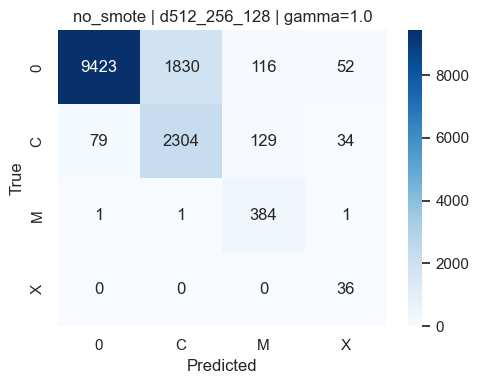

In [ ]:
def plot_confusion_matrix_for_result(res, class_names=None):
    cm = res["confusion_matrix"]
    if class_names is None:
        class_names = ["0", "C", "M", "X"]  # adjust if needed

    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    title = f"{res['variant']} | {res['config_name']} | gamma={res['gamma']}"
    plt.title(title)
    plt.tight_layout()
    plt.show()

# pick best by validation macro F1 inside one variant
best_no_smote = max(
    focal_arch_gamma_results["no_smote"],
    key=lambda r: r["best_val_f1"]
)

print(best_no_smote["classification_report"])
plot_confusion_matrix_for_result(best_no_smote)


In [ ]:
from collections import defaultdict

# best_results[variant] = list of best results (one per architecture)
best_results = defaultdict(list)

for var_name, results_list in focal_arch_gamma_results.items():
    # group by architecture name
    by_arch = defaultdict(list)
    for r in results_list:
        by_arch[r["config_name"]].append(r)

    # keep best gamma for each architecture (by validation F1)
    for arch_name, arch_res in by_arch.items():
        best = max(arch_res, key=lambda x: x["best_val_f1"])
        best_results[var_name].append(best)

# sort by complexity (num_params) inside each variant
for var_name in best_results:
    best_results[var_name] = sorted(best_results[var_name],
                                    key=lambda r: r["num_params"])


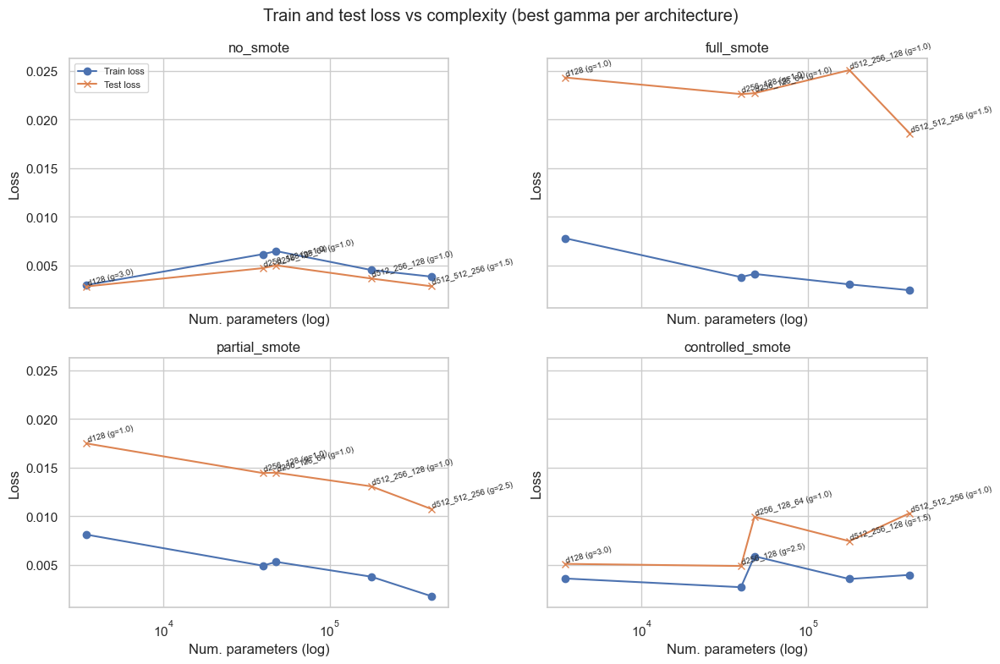

In [ ]:
variants_order = ["no_smote", "full_smote", "partial_smote", "controlled_smote"]
n_vars = len(variants_order)

fig, axes = plt.subplots(2, 2, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

for ax, var_name in zip(axes, variants_order):
    res_list = best_results.get(var_name, [])
    if not res_list:
        ax.set_visible(False)
        continue

    xs = [r["num_params"] for r in res_list]
    train_ls = [float(np.min(r["history"]["train_loss"])) for r in res_list]
    test_ls  = [r["test_loss"] for r in res_list]

    arch_labels = [r["config_name"] + f" (g={r['gamma']})" for r in res_list]

    ax.plot(xs, train_ls, marker="o", label="Train loss")
    ax.plot(xs, test_ls,  marker="x", label="Test loss")

    for x, y, label in zip(xs, test_ls, arch_labels):
        ax.text(x, y, label, fontsize=7, ha="left", va="bottom", rotation=15)

    ax.set_xscale("log")
    ax.set_title(f"{var_name}")
    ax.set_xlabel("Num. parameters (log)")
    ax.set_ylabel("Loss")
    ax.grid(True)

axes[0].legend(loc="upper left", fontsize=8)
fig.suptitle("Train and test loss vs complexity (best gamma per architecture)", y=0.98)
plt.tight_layout()
plt.show()


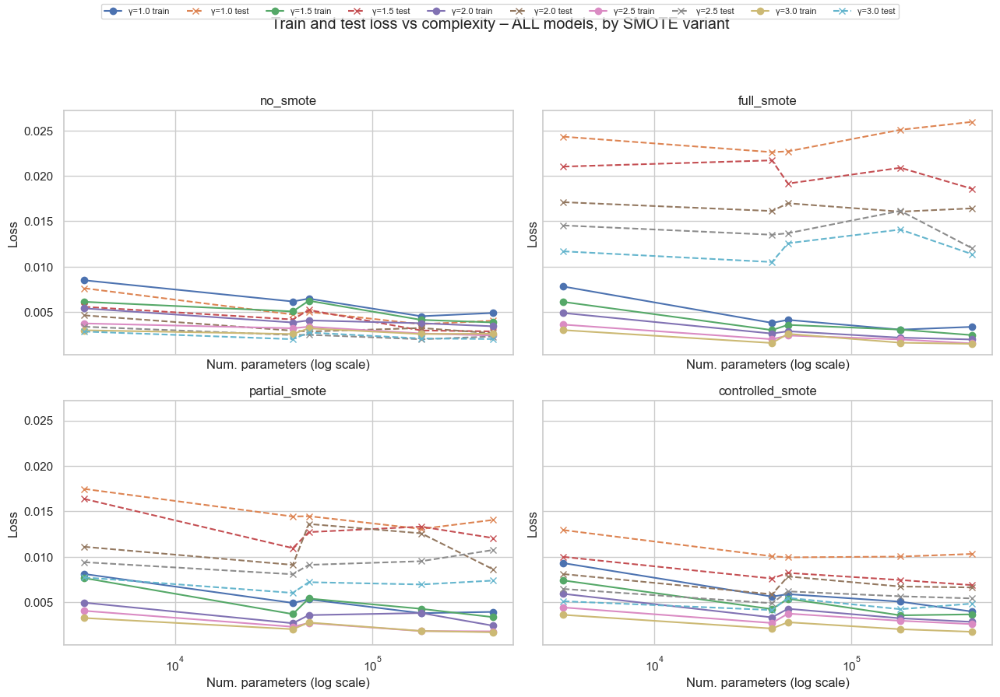

In [ ]:
from collections import defaultdict

variants_order = ["no_smote", "full_smote", "partial_smote", "controlled_smote"]
gammas_order   = sorted(list({r["gamma"]
                              for v in focal_arch_gamma_results.values()
                              for r in v}))

fig, axes = plt.subplots(2, 2, figsize=(13, 9), sharex=True, sharey=True)
axes = axes.flatten()

for ax, var_name in zip(axes, variants_order):
    res_list = focal_arch_gamma_results.get(var_name, [])
    if not res_list:
        ax.set_visible(False)
        continue

    # group models by gamma
    by_gamma = defaultdict(list)
    for r in res_list:
        by_gamma[r["gamma"]].append(r)

    for g in gammas_order:
        if g not in by_gamma:
            continue

        group = by_gamma[g]
        # sort by complexity so lines are ordered
        group = sorted(group, key=lambda x: x["num_params"])

        xs = [r["num_params"] for r in group]
        train_ls = [float(np.min(r["history"]["train_loss"])) for r in group]
        test_ls  = [r["test_loss"] for r in group]

        # one line for train, one for test for this gamma
        ax.plot(xs, train_ls, marker="o", linestyle="-",
                label=f"γ={g} train")
        ax.plot(xs, test_ls, marker="x", linestyle="--",
                label=f"γ={g} test")

    ax.set_xscale("log")
    ax.set_title(var_name)
    ax.set_xlabel("Num. parameters (log scale)")
    ax.set_ylabel("Loss")
    ax.grid(True)

# single legend outside
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center",
           ncol=len(gammas_order)*2, fontsize=8)
fig.suptitle("Train and test loss vs complexity – ALL models, by SMOTE variant", y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

all_results = []

for var_name, results_list in focal_arch_gamma_results.items():
    for r in results_list:
        y_true = r["y_true"]
        y_pred = r["y_pred"]

        prec = precision_score(y_true, y_pred, average="macro", zero_division=0)
        rec  = recall_score(y_true, y_pred, average="macro", zero_division=0)
        f1   = f1_score(y_true, y_pred, average="macro", zero_division=0)
        acc  = accuracy_score(y_true, y_pred)

        r["test_precision"] = prec
        r["test_recall"]    = rec
        r["test_macro_f1"]  = f1
        r["test_accuracy"]  = acc

        all_results.append(r)

# sort by macro F1 on test set (descending) and take top 7
top_k = sorted(all_results, key=lambda x: x["test_macro_f1"], reverse=True)[:7]

print("Top 7 models by test macro F1:")
for i, r in enumerate(top_k, 1):
    print(
        f"Model {i}: variant={r['variant']}, config={r['config_name']}, "
        f"gamma={r['gamma']}, params={r['num_params']}, "
        f"Acc={r['test_accuracy']:.4f}, "
        f"P={r['test_precision']:.4f}, "
        f"R={r['test_recall']:.4f}, "
        f"F1={r['test_macro_f1']:.4f}"
    )


Top 7 models by test macro F1:
Model 1: variant=no_smote, config=d512_512_256, gamma=1.5, params=408324, Acc=0.8589, P=0.6343, R=0.9264, F1=0.7260
Model 2: variant=no_smote, config=d512_256_128, gamma=1.0, params=177284, Acc=0.8441, P=0.6130, R=0.9306, F1=0.6998
Model 3: variant=no_smote, config=d512_256_128, gamma=1.5, params=177284, Acc=0.8184, P=0.6113, R=0.9159, F1=0.6981
Model 4: variant=no_smote, config=d256_128, gamma=1.0, params=39556, Acc=0.8224, P=0.5955, R=0.9057, F1=0.6855
Model 5: variant=no_smote, config=d512_512_256, gamma=2.0, params=408324, Acc=0.8208, P=0.5682, R=0.9051, F1=0.6555
Model 6: variant=no_smote, config=d512_512_256, gamma=1.0, params=408324, Acc=0.8310, P=0.5706, R=0.9236, F1=0.6521
Model 7: variant=no_smote, config=d256_128, gamma=2.0, params=39556, Acc=0.8152, P=0.5609, R=0.8910, F1=0.6460


In [ ]:
# Build labels like: "Model 1\n(no_smote, d128, γ=1.5)"
models = []
performance_data = {}

for i, r in enumerate(top_k, 1):
    model_id = f"Model {i}"
    # multi-line label for the radar legend
    pretty_label = f"{model_id}\n({r['variant']}, {r['config_name']}, γ={r['gamma']})"
    models.append(pretty_label)

    performance_data[model_id] = {
        "Precision": r["test_precision"],
        "Recall":    r["test_recall"],
        "F1-Score":  r["test_macro_f1"],
        "Accuracy":  r["test_accuracy"],
    }

# Convert to DataFrame (index = 'Model 1', 'Model 2', ...)
df = pd.DataFrame(performance_data).T
display(df)


,Precision,Recall,F1-Score,Accuracy
Model 1,0.634250,0.926424,0.726024,0.858930
Model 2,0.612988,0.930564,0.699785,0.844128
Model 3,0.611346,0.915938,0.698087,0.818416
Model 4,0.595508,0.905651,0.685487,0.822446
Model 5,0.568220,0.905133,0.655523,0.820778
Model 6,0.570638,0.923617,0.652065,0.830994
Model 7,0.560852,0.890985,0.646030,0.815219


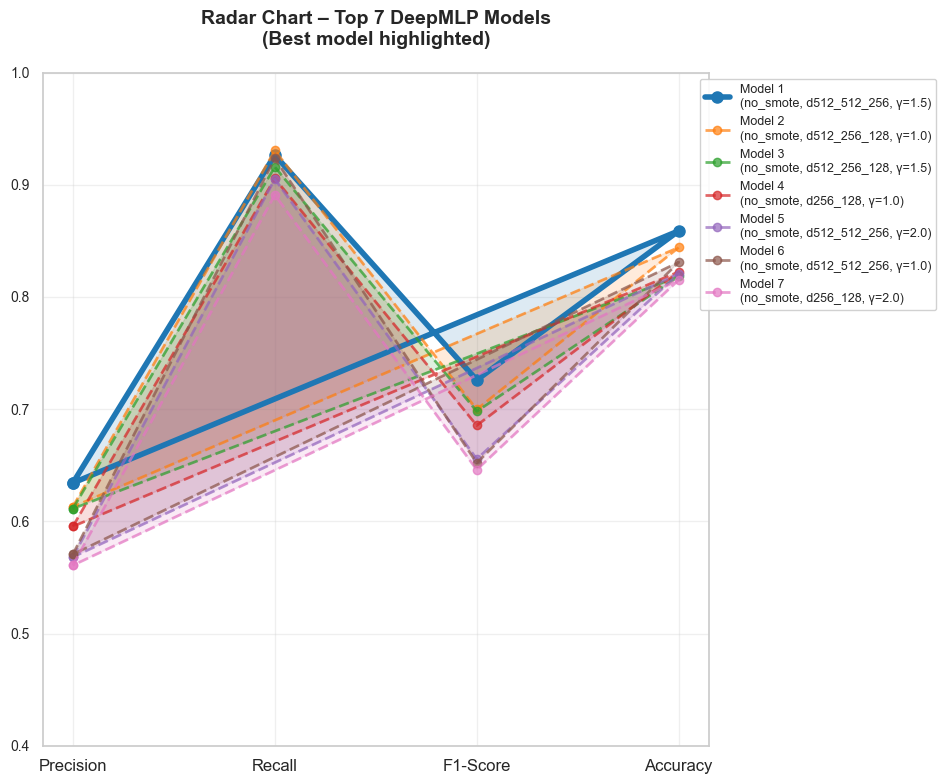

TypeError: _LocationIndexer.__call__() takes from 1 to 2 positional arguments but 3 were given

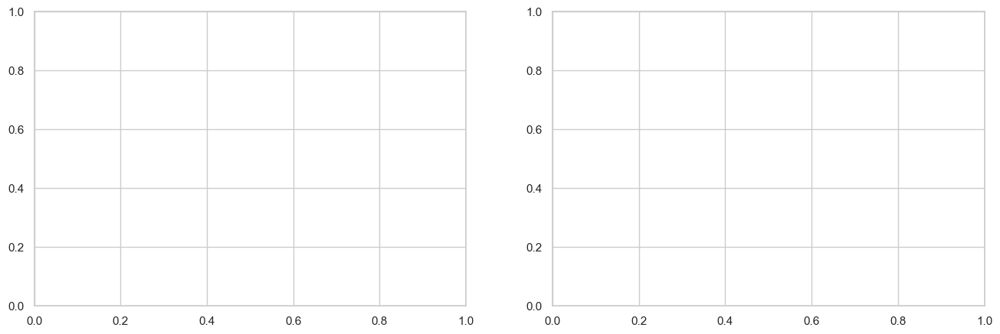

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# --- RADAR CHART ---

categories = ["Precision", "Recall", "F1-Score", "Accuracy"]
N = len(categories)

# angles for radar
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(10, 8))

# colors: one per model (first = best)
n_models = len(models)
palette = sns.color_palette("tab10", n_colors=n_models)
model_colors = palette

# line styles to make best one stand out
model_linewidths  = [4] + [2]*(n_models-1)
model_linestyles  = ["-"] + ["--"]*(n_models-1)
model_alphas      = [1.0] + [0.7]*(n_models-1)
model_markersize  = [8] + [6]*(n_models-1)

for i, label in enumerate(models):
    model_id = label.split("\n")[0]   # "Model 1", "Model 2", ...
    values = df.loc[model_id, categories].values.flatten().tolist()
    values += values[:1]

    plt.plot(
        angles, values,
        marker="o",
        linewidth=model_linewidths[i],
        linestyle=model_linestyles[i],
        color=model_colors[i],
        alpha=model_alphas[i],
        label=label,
        markersize=model_markersize[i],
    )
    plt.fill(angles, values, color=model_colors[i], alpha=0.15)

plt.xticks(angles[:-1], categories, fontsize=12)
plt.yticks(np.arange(0.4, 1.01, 0.1), fontsize=10)
plt.ylim(0.4, 1.0)
plt.title("Radar Chart – Top 7 DeepMLP Models\n(Best model highlighted)", fontsize=14, fontweight="bold", pad=20)
plt.legend(bbox_to_anchor=(1.35, 1.0), fontsize=9, framealpha=0.9)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# --- BAR CHARTS: F1 for all + best vs runner-up ---

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Left: overall F1 comparison
f1_scores = [df.loc(f"Model {i+1}", "F1-Score") for i in range(n_models)]
# easier: recompute directly
f1_scores = [df.loc[f"Model {i+1}", "F1-Score"] for i in range(n_models)]

bars1 = ax1.bar(
    models,
    f1_scores,
    color=model_colors,
    alpha=0.8,
    edgecolor="black",
    linewidth=1,
)

ax1.set_title("Top 7 Models – Test Macro F1", fontweight="bold")
ax1.set_ylabel("F1-Score")
ax1.set_xticklabels(models, rotation=45, ha="right")
ax1.grid(True, alpha=0.3)

for bar, score in zip(bars1, f1_scores):
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2.,
        height + 0.005,
        f"{score:.3f}",
        ha="center",
        va="bottom",
        fontweight="bold",
    )

# Right: best vs second-best on P/R/F1
metrics_compare = ["Precision", "Recall", "F1-Score"]

best_id = "Model 1"
second_id = "Model 2"

best_scores   = [df.loc[best_id,   m] for m in metrics_compare]
second_scores = [df.loc[second_id, m] for m in metrics_compare]

x = np.arange(len(metrics_compare))
width = 0.35

ax2.bar(
    x - width/2, second_scores, width,
    label=f"{second_id} (2nd best)",
    color=palette[1],
    alpha=0.7,
)
ax2.bar(
    x + width/2, best_scores, width,
    label=f"{best_id} (best)",
    color=palette[0],
    alpha=0.9,
    edgecolor="black",
    linewidth=2,
)

ax2.set_title("Best Model vs Runner-Up – Key Metrics", fontweight="bold")
ax2.set_ylabel("Score")
ax2.set_xticks(x)
ax2.set_xticklabels(metrics_compare)
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


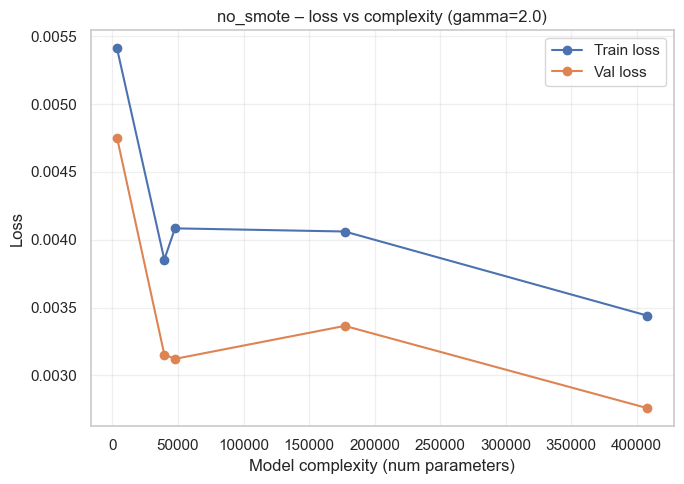

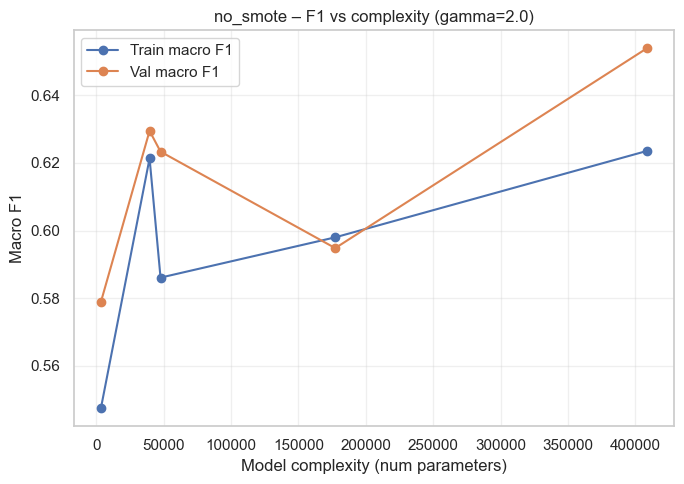

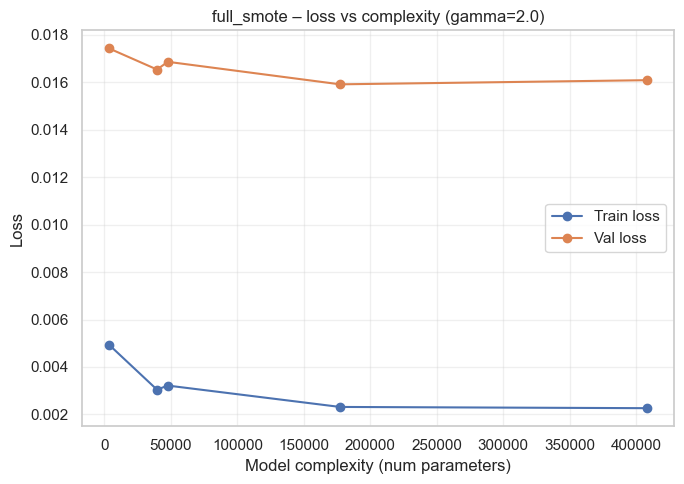

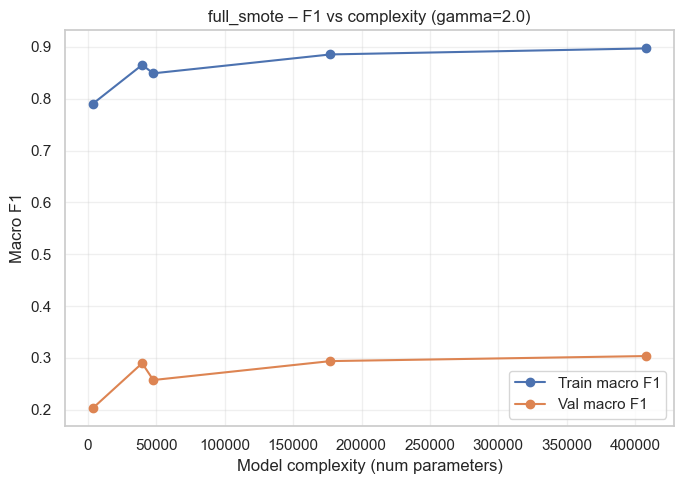

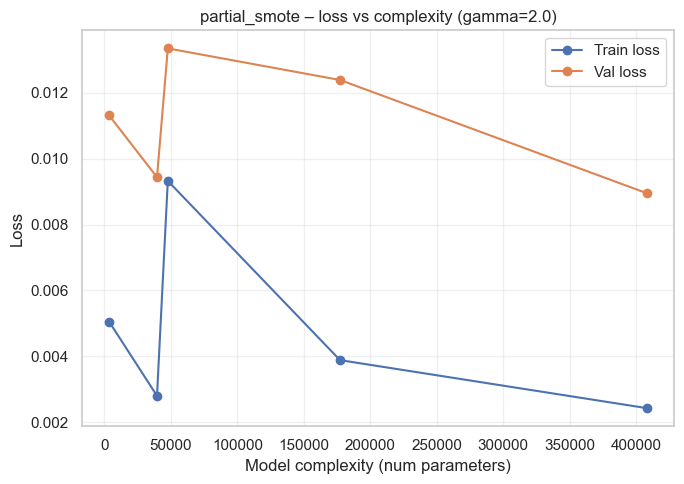

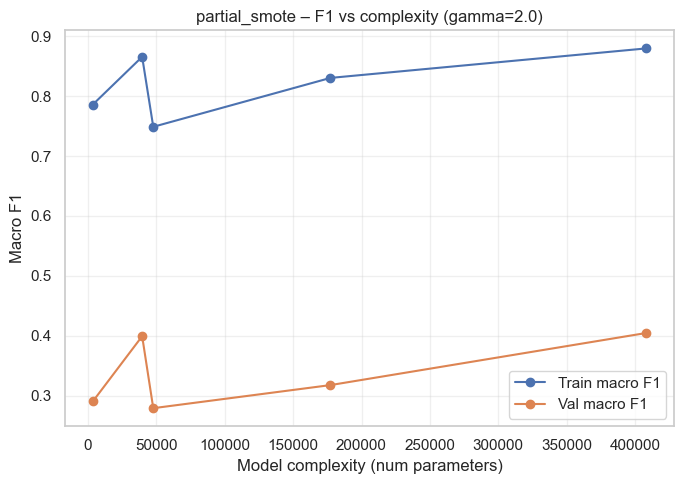

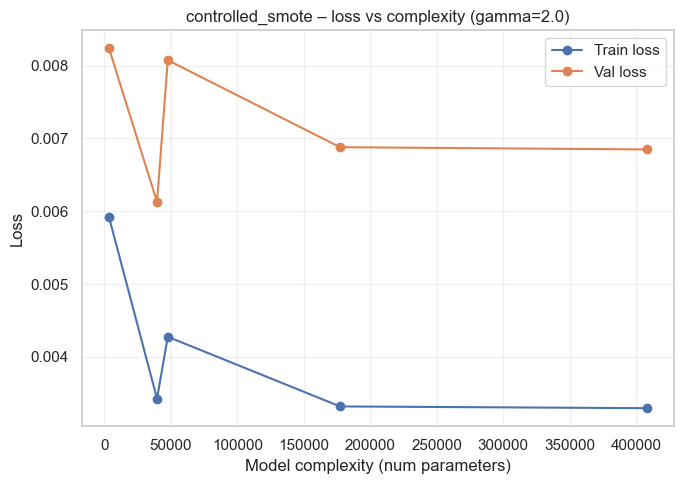

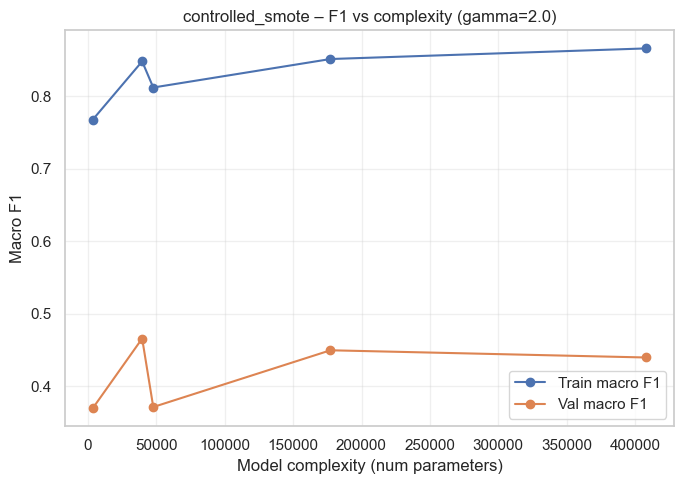

In [97]:
import matplotlib.pyplot as plt

def plot_complexity_for_gamma(variant_name, results_list, gamma):
    # pick runs for this gamma
    subset = [r for r in results_list if abs(r["gamma"] - gamma) < 1e-8]
    if not subset:
        print(f"No runs for variant={variant_name}, gamma={gamma}")
        return

    subset = sorted(subset, key=lambda r: r["num_params"])
    
    complexities = [r["num_params"] for r in subset]
    train_loss   = [r["history"]["train_loss"][-1] for r in subset]
    val_loss     = [r["history"]["val_loss"][-1]   for r in subset]
    train_f1     = [r["history"]["train_macro_f1"][-1] for r in subset]
    val_f1       = [r["history"]["val_macro_f1"][-1]   for r in subset]

    # Loss vs complexity
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_loss, marker="o", label="Train loss")
    plt.plot(complexities, val_loss,   marker="o", label="Val loss")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Loss")
    plt.title(f"{variant_name} – loss vs complexity (gamma={gamma})")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # F1 vs complexity
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_f1, marker="o", label="Train macro F1")
    plt.plot(complexities, val_f1,   marker="o", label="Val macro F1")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Macro F1")
    plt.title(f"{variant_name} – F1 vs complexity (gamma={gamma})")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

for var_name, res_list in focal_arch_gamma_results.items():
    plot_complexity_for_gamma(var_name, res_list, gamma=2.0)


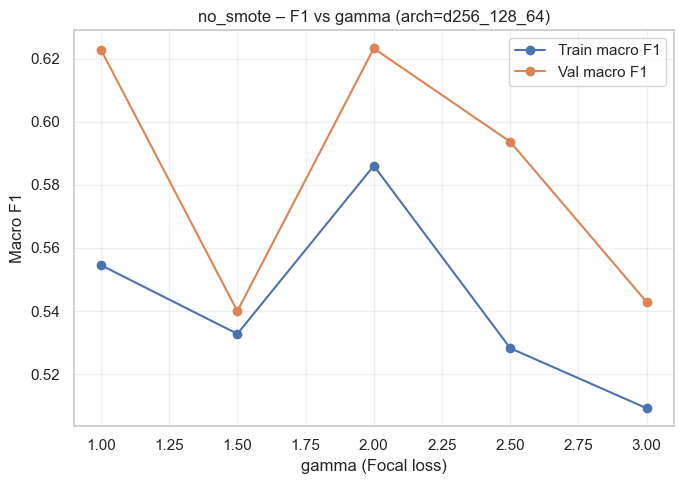

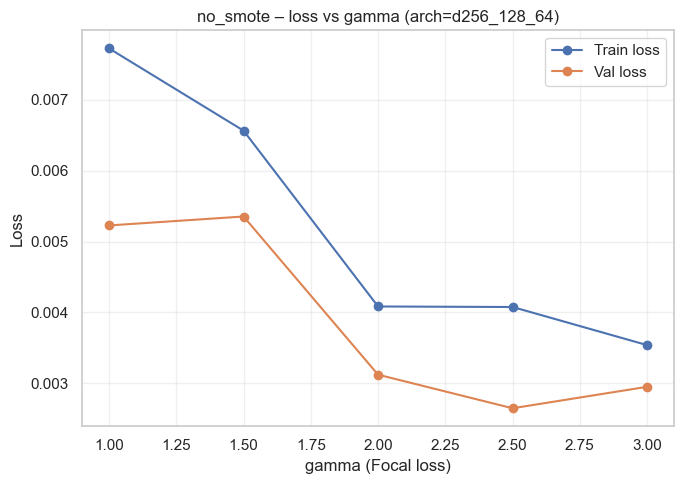

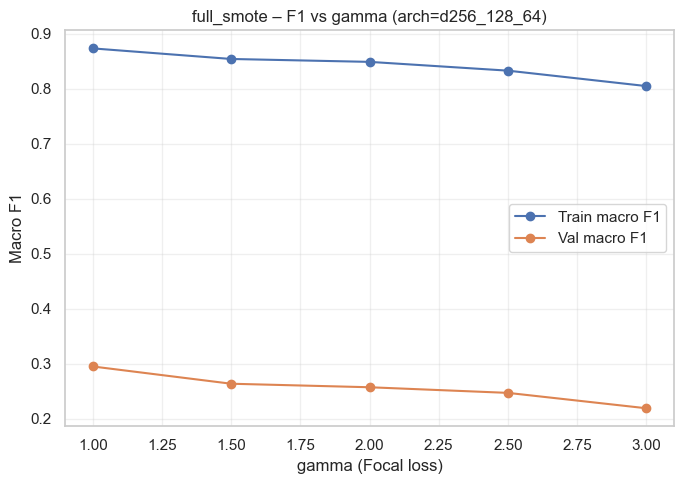

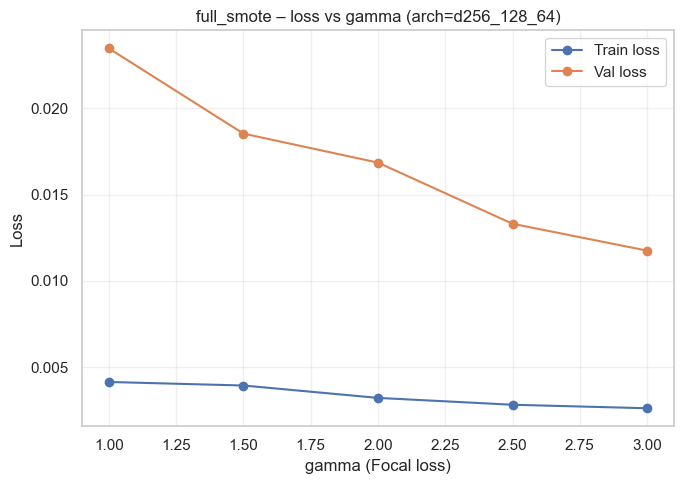

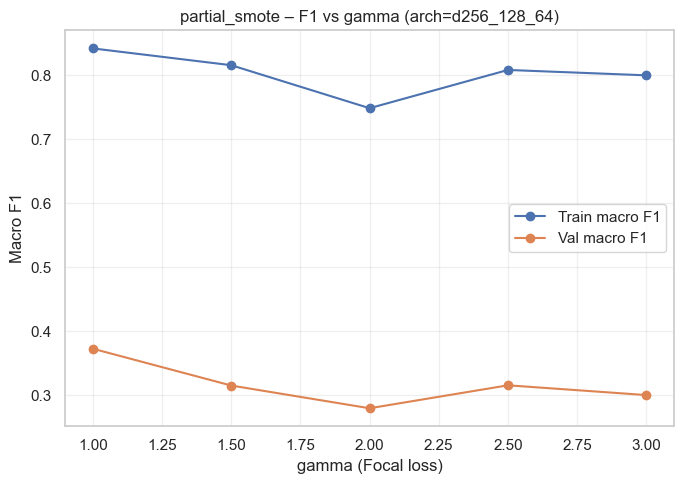

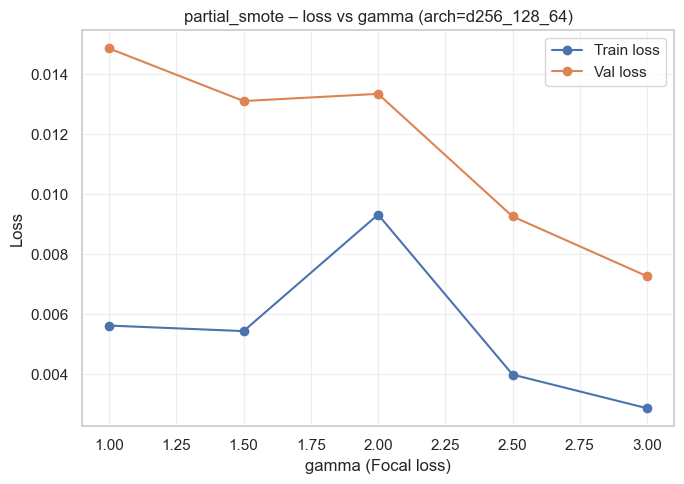

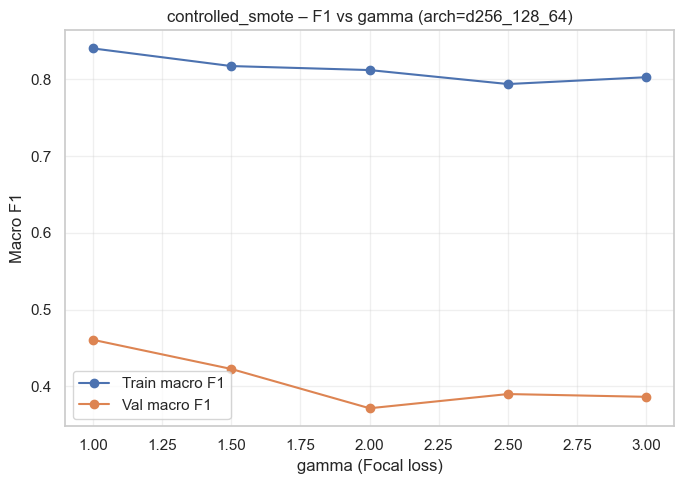

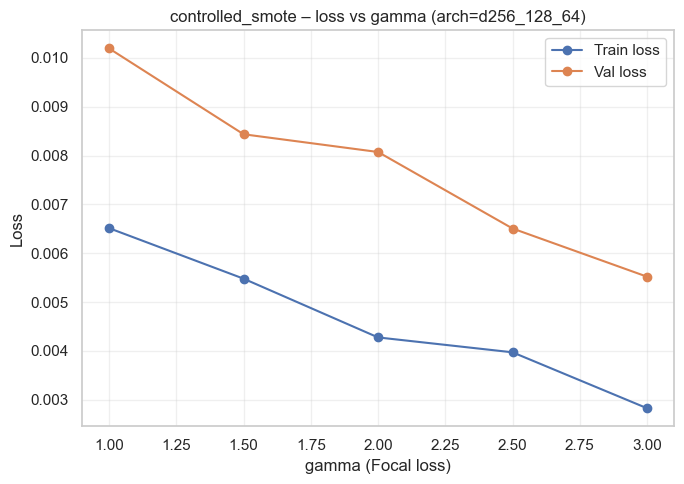

In [98]:
def plot_gamma_for_arch(variant_name, results_list, config_name):
    # pick runs with this architecture
    subset = [r for r in results_list if r["config_name"] == config_name]
    if not subset:
        print(f"No runs for variant={variant_name}, arch={config_name}")
        return

    subset = sorted(subset, key=lambda r: r["gamma"])

    gammas    = [r["gamma"] for r in subset]
    train_f1  = [r["history"]["train_macro_f1"][-1] for r in subset]
    val_f1    = [r["history"]["val_macro_f1"][-1]   for r in subset]
    train_loss = [r["history"]["train_loss"][-1] for r in subset]
    val_loss   = [r["history"]["val_loss"][-1]   for r in subset]

    # F1 vs gamma
    plt.figure(figsize=(7,5))
    plt.plot(gammas, train_f1, marker="o", label="Train macro F1")
    plt.plot(gammas, val_f1,   marker="o", label="Val macro F1")
    plt.xlabel("gamma (Focal loss)")
    plt.ylabel("Macro F1")
    plt.title(f"{variant_name} – F1 vs gamma (arch={config_name})")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Loss vs gamma (optional but nice)
    plt.figure(figsize=(7,5))
    plt.plot(gammas, train_loss, marker="o", label="Train loss")
    plt.plot(gammas, val_loss,   marker="o", label="Val loss")
    plt.xlabel("gamma (Focal loss)")
    plt.ylabel("Loss")
    plt.title(f"{variant_name} – loss vs gamma (arch={config_name})")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

for var_name, res_list in focal_arch_gamma_results.items():
    plot_gamma_for_arch(var_name, res_list, config_name="d256_128_64")


Best no_smote: d512_256_128 gamma= 1.0 val F1= 0.7325107949031815


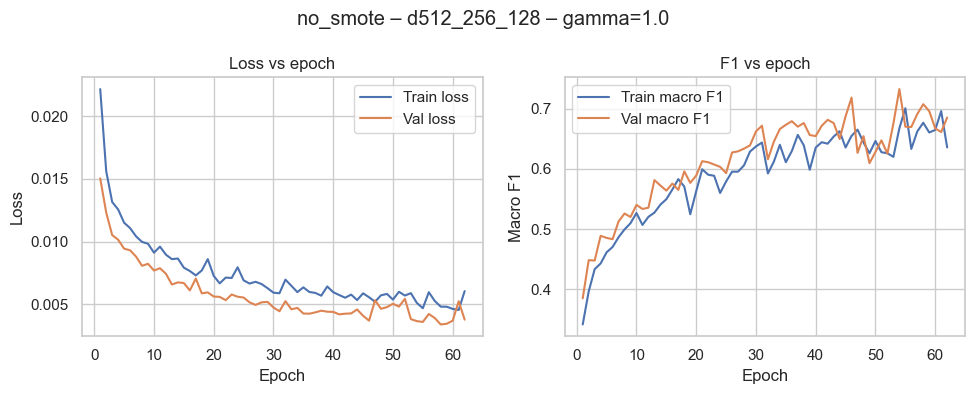

Best controlled_smote: d512_512_256 gamma= 1.0 val F1= 0.5299504183376545


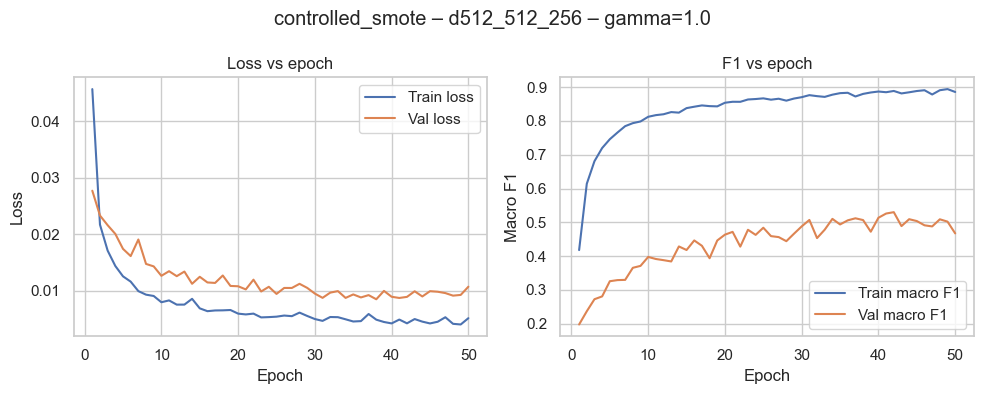

Best partial_smote: d512_256_128 gamma= 1.0 val F1= 0.4471018621945604


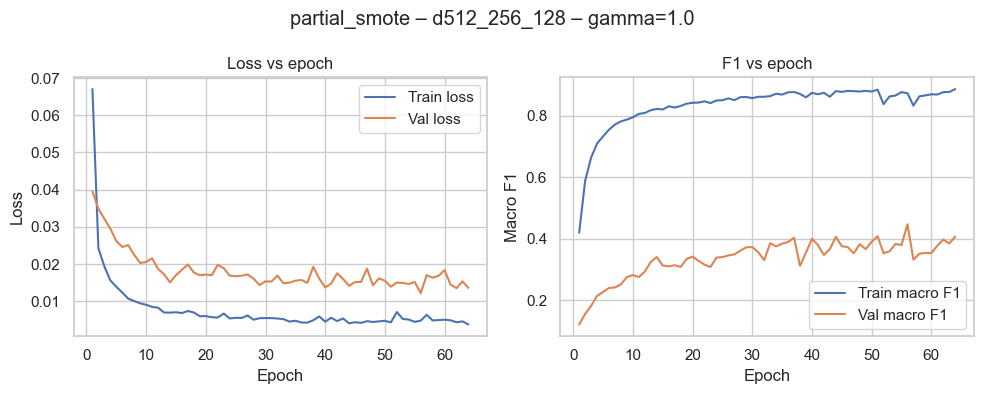

Best full_smote: d512_512_256 gamma= 1.5 val F1= 0.3329054557380309


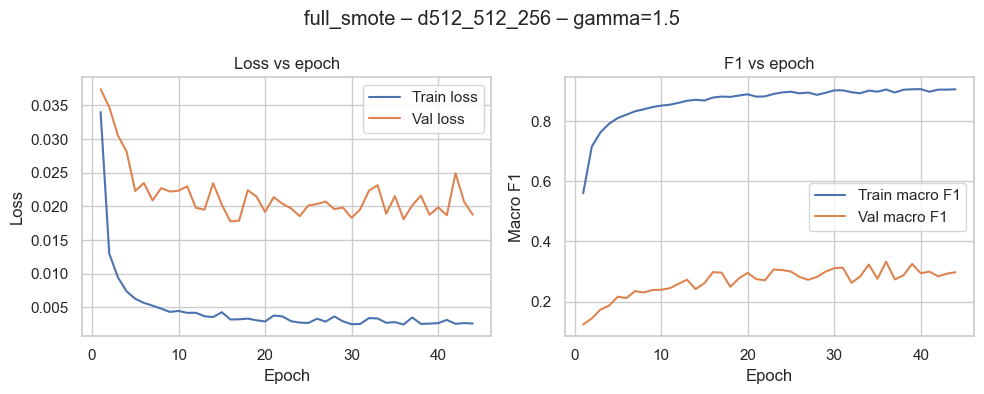

In [103]:
def plot_learning_curves(run, title):
    h = run["history"]
    epochs = range(1, len(h["train_loss"]) + 1)

    plt.figure(figsize=(10,4))
    plt.suptitle(title)

    # Loss
    plt.subplot(1,2,1)
    plt.plot(epochs, h["train_loss"], label="Train loss")
    plt.plot(epochs, h["val_loss"],   label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs epoch")
    plt.legend()

    # F1
    plt.subplot(1,2,2)
    plt.plot(epochs, h["train_macro_f1"], label="Train macro F1")
    plt.plot(epochs, h["val_macro_f1"],   label="Val macro F1")
    plt.xlabel("Epoch")
    plt.ylabel("Macro F1")
    plt.title("F1 vs epoch")
    plt.legend()

    plt.tight_layout()
    plt.show()

# pick best run for controlled_smote
runs_ctrl = focal_arch_gamma_results["no_smote"]
best_ctrl = max(runs_ctrl, key=lambda r: r["best_val_f1"])

print("Best no_smote:",
      best_ctrl["config_name"],
      "gamma=", best_ctrl["gamma"],
      "val F1=", best_ctrl["best_val_f1"])

plot_learning_curves(
    best_ctrl,
    title=f"no_smote – {best_ctrl['config_name']} – gamma={best_ctrl['gamma']}"
)



# pick best run for controlled_smote
runs_ctrl = focal_arch_gamma_results["controlled_smote"]
best_ctrl = max(runs_ctrl, key=lambda r: r["best_val_f1"])

print("Best controlled_smote:",
      best_ctrl["config_name"],
      "gamma=", best_ctrl["gamma"],
      "val F1=", best_ctrl["best_val_f1"])

plot_learning_curves(
    best_ctrl,
    title=f"controlled_smote – {best_ctrl['config_name']} – gamma={best_ctrl['gamma']}"
)

# pick best run for controlled_smote
runs_ctrl = focal_arch_gamma_results["partial_smote"]
best_ctrl = max(runs_ctrl, key=lambda r: r["best_val_f1"])

print("Best partial_smote:",
      best_ctrl["config_name"],
      "gamma=", best_ctrl["gamma"],
      "val F1=", best_ctrl["best_val_f1"])

plot_learning_curves(
    best_ctrl,
    title=f"partial_smote – {best_ctrl['config_name']} – gamma={best_ctrl['gamma']}"
)

# pick best run for controlled_smote
runs_ctrl = focal_arch_gamma_results["full_smote"]
best_ctrl = max(runs_ctrl, key=lambda r: r["best_val_f1"])

print("Best full_smote:",
      best_ctrl["config_name"],
      "gamma=", best_ctrl["gamma"],
      "val F1=", best_ctrl["best_val_f1"])

plot_learning_curves(
    best_ctrl,
    title=f"full_smote – {best_ctrl['config_name']} – gamma={best_ctrl['gamma']}"
)


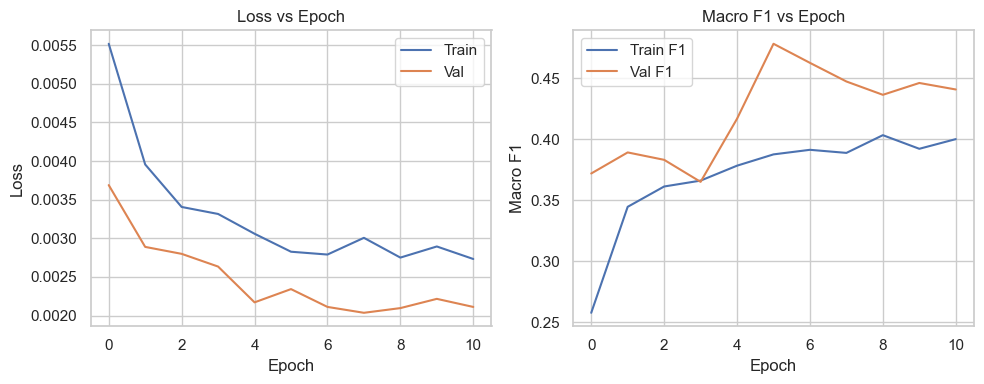

In [54]:
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(history["train_loss"], label="Train")
plt.plot(history["val_loss"], label="Val")
plt.title("Loss vs Epoch")
plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.legend()

plt.subplot(1,2,2)
plt.plot(history["train_f1"], label="Train F1")
plt.plot(history["val_f1"], label="Val F1")
plt.title("Macro F1 vs Epoch")
plt.xlabel("Epoch"); plt.ylabel("Macro F1"); plt.legend()

plt.tight_layout()
plt.show()


# RES MLP

Reason for choosing ResMLP

The ResMLP adds residual skip connections between dense layers, helping the model:

Preserve important features across layers.

Avoid vanishing gradients.

Improve gradient flow and training stability when stacking deeper layers.

In essence, it allows deeper non-linear transformations while retaining earlier layer information — ideal for datasets where patterns overlap (like C vs. M flares).

→ By introducing residual paths, we expected better class boundary refinement, especially in the C–M transition zone that the DeepMLP struggled with.

## Without Smote + No Focal Loss

In [114]:
import torch
import torch.nn as nn
import torch.nn.functional as F


In [115]:
class ResidualBlock(nn.Module):
    def __init__(self, dim, dropout_p=0.3):
        super().__init__()
        self.fc1 = nn.Linear(dim, dim)
        self.bn1 = nn.BatchNorm1d(dim)
        self.fc2 = nn.Linear(dim, dim)
        self.bn2 = nn.BatchNorm1d(dim)
        self.dropout = nn.Dropout(dropout_p)

    def forward(self, x):
        identity = x

        out = self.fc1(x)
        out = self.bn1(out)
        out = F.relu(out)
        out = self.dropout(out)

        out = self.fc2(out)
        out = self.bn2(out)

        out = out + identity     # residual / skip connection
        out = F.relu(out)
        out = self.dropout(out)
        return out


class ResMLP(nn.Module):
    def __init__(self, input_dim, hidden_dim=256, num_blocks=3,
                 num_classes=4, dropout_p=0.3):
        super().__init__()

        # input projection
        self.input_layer = nn.Linear(input_dim, hidden_dim)
        self.input_bn = nn.BatchNorm1d(hidden_dim)
        self.dropout = nn.Dropout(dropout_p)

        # residual blocks
        self.blocks = nn.ModuleList([
            ResidualBlock(hidden_dim, dropout_p=dropout_p)
            for _ in range(num_blocks)
        ])

        # output head
        self.output_layer = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        x = self.input_layer(x)
        x = self.input_bn(x)
        x = F.relu(x)
        x = self.dropout(x)

        for block in self.blocks:
            x = block(x)

        logits = self.output_layer(x)
        return logits


In [116]:
torch.manual_seed(RANDOM_STATE)

input_dim = X_train.shape[1]
num_classes = 4

res_model_no_smote = ResMLP(
    input_dim=input_dim,
    hidden_dim=256,
    num_blocks=3,
    num_classes=num_classes,
    dropout_p=0.3
).to(device)


In [117]:
import pandas as pd

# compute inverse-frequency class weights
class_counts = pd.Series(y_train).value_counts().sort_index()
inv_freq = 1.0 / class_counts
weights = (inv_freq / inv_freq.sum()).values
class_weights_ce = torch.tensor(weights, dtype=torch.float32).to(device)

criterion_ce = nn.CrossEntropyLoss(weight=class_weights_ce)


In [118]:
import torch
import torch.nn as nn
import numpy as np

def train_resmlp_config(
    hidden_dim,
    num_blocks,
    lr,
    weight_decay,
    max_epochs=120,
    patience=8,
    min_delta=1e-3,
    verbose=True
):
    model = ResMLP(
        input_dim=input_dim,
        hidden_dim=hidden_dim,
        num_blocks=num_blocks,
        num_classes=num_classes,
        dropout_p=0.3
    ).to(device)

    criterion = nn.CrossEntropyLoss(weight=class_weights_ce)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    history = {
        "train_loss": [],
        "val_loss": [],
        "train_macro_f1": [],
        "val_macro_f1": [],
    }

    best_val_f1 = -np.inf
    best_state = None
    patience_counter = 0

    for epoch in range(1, max_epochs + 1):
        train_loss, train_acc, train_f1, _, _ = run_epoch(
            model, train_loader, optimizer, criterion, train=True
        )
        val_loss, val_acc, val_f1, _, _ = run_epoch(
            model, val_loader, optimizer, criterion, train=False
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_macro_f1"].append(train_f1)
        history["val_macro_f1"].append(val_f1)

        if val_f1 > best_val_f1 + min_delta:
            best_val_f1 = val_f1
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                if verbose:
                    print(f"  Early stopping at epoch {epoch:02d}")
                break

        if verbose:
            print(
                f"  Epoch {epoch:02d} | "
                f"Train loss {train_loss:.4f}, F1 {train_f1:.4f} | "
                f"Val loss {val_loss:.4f}, F1 {val_f1:.4f}"
            )

    if best_state is not None:
        model.load_state_dict(best_state)

    return model, history, best_val_f1


In [119]:
def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


In [120]:
# ResMLP architecture configs
res_arch_configs = [
    {"name": "h128_b2",  "hidden_dim": 128, "num_blocks": 2},
    {"name": "h256_b2",  "hidden_dim": 256, "num_blocks": 2},
    {"name": "h256_b3",  "hidden_dim": 256, "num_blocks": 3},
    {"name": "h512_b3",  "hidden_dim": 512, "num_blocks": 3},
    {"name": "h512_b4",  "hidden_dim": 512, "num_blocks": 4},
]

res_arch_results = []

base_lr = 1e-3
base_wd = 1e-4

for cfg in res_arch_configs:
    print(f"\n=== ResMLP arch ablation: {cfg['name']} "
          f"(hidden={cfg['hidden_dim']}, blocks={cfg['num_blocks']}) ===")

    model, history, best_val_f1 = train_resmlp_config(
        hidden_dim=cfg["hidden_dim"],
        num_blocks=cfg["num_blocks"],
        lr=base_lr,
        weight_decay=base_wd,
        max_epochs=1500,
        patience=8,
        min_delta=1e-3,
        verbose=True
    )

    num_params = count_params(model)

    res_arch_results.append({
        "name": cfg["name"],
        "hidden_dim": cfg["hidden_dim"],
        "num_blocks": cfg["num_blocks"],
        "lr": base_lr,
        "weight_decay": base_wd,
        "model": model,
        "history": history,
        "best_val_f1": best_val_f1,
        "num_params": num_params,
    })



=== ResMLP arch ablation: h128_b2 (hidden=128, blocks=2) ===
  Epoch 01 | Train loss 1.1245, F1 0.3066 | Val loss 0.8068, F1 0.3444
  Epoch 02 | Train loss 0.9014, F1 0.3478 | Val loss 0.7041, F1 0.3763
  Epoch 03 | Train loss 0.7874, F1 0.3725 | Val loss 0.6678, F1 0.3780
  Epoch 04 | Train loss 0.7423, F1 0.3880 | Val loss 0.6251, F1 0.3922
  Epoch 05 | Train loss 0.7040, F1 0.3908 | Val loss 0.5908, F1 0.3966
  Epoch 06 | Train loss 0.6652, F1 0.4105 | Val loss 0.5616, F1 0.3988
  Epoch 07 | Train loss 0.6558, F1 0.4157 | Val loss 0.5558, F1 0.4316
  Epoch 08 | Train loss 0.6352, F1 0.4234 | Val loss 0.5558, F1 0.4121
  Epoch 09 | Train loss 0.6212, F1 0.4322 | Val loss 0.5133, F1 0.4475
  Epoch 10 | Train loss 0.6017, F1 0.4455 | Val loss 0.4875, F1 0.5091
  Epoch 11 | Train loss 0.5671, F1 0.4525 | Val loss 0.4931, F1 0.4562
  Epoch 12 | Train loss 0.5693, F1 0.4602 | Val loss 0.4712, F1 0.4733
  Epoch 13 | Train loss 0.5481, F1 0.4734 | Val loss 0.4508, F1 0.5012
  Epoch 14 | Tr

In [121]:
best_arch_run = max(res_arch_results, key=lambda r: r["best_val_f1"])

best_res_hidden = best_arch_run["hidden_dim"]
best_res_blocks = best_arch_run["num_blocks"]

print("\nBest ResMLP architecture by val macro F1:")
print(f"  hidden_dim = {best_res_hidden}")
print(f"  num_blocks = {best_res_blocks}")
print(f"  best val macro F1 = {best_arch_run['best_val_f1']:.4f}")
print(f"  num_params = {best_arch_run['num_params']}")



Best ResMLP architecture by val macro F1:
  hidden_dim = 512
  num_blocks = 4
  best val macro F1 = 0.7562
  num_params = 2123268


## Ablation 2learning rate

In [122]:
res_lr_values = [3e-4, 1e-3, 3e-3, 1e-2]
res_lr_results = []

for lr in res_lr_values:
    print(f"\n=== ResMLP LR ablation: lr={lr} ===")

    model, history, best_val_f1 = train_resmlp_config(
        hidden_dim=best_res_hidden,
        num_blocks=best_res_blocks,
        lr=lr,
        weight_decay=base_wd,
        max_epochs=1500,
        patience=8,
        min_delta=1e-3,
        verbose=True
    )

    num_params = count_params(model)

    res_lr_results.append({
        "hidden_dim": best_res_hidden,
        "num_blocks": best_res_blocks,
        "lr": lr,
        "weight_decay": base_wd,
        "model": model,
        "history": history,
        "best_val_f1": best_val_f1,
        "num_params": num_params,
    })

best_lr_run = max(res_lr_results, key=lambda r: r["best_val_f1"])
best_res_lr = best_lr_run["lr"]

print("\nBest ResMLP LR by val macro F1:")
print(f"  hidden_dim = {best_res_hidden}")
print(f"  num_blocks = {best_res_blocks}")
print(f"  lr = {best_res_lr}")
print(f"  best val macro F1 = {best_lr_run['best_val_f1']:.4f}")



=== ResMLP LR ablation: lr=0.0003 ===
  Epoch 01 | Train loss 1.4054, F1 0.2937 | Val loss 0.8295, F1 0.3501
  Epoch 02 | Train loss 0.9823, F1 0.3437 | Val loss 0.7134, F1 0.3976
  Epoch 03 | Train loss 0.8342, F1 0.3679 | Val loss 0.6990, F1 0.3875
  Epoch 04 | Train loss 0.7749, F1 0.3794 | Val loss 0.6245, F1 0.4083
  Epoch 05 | Train loss 0.7419, F1 0.3913 | Val loss 0.6376, F1 0.4005
  Epoch 06 | Train loss 0.6868, F1 0.4048 | Val loss 0.5897, F1 0.4376
  Epoch 07 | Train loss 0.6644, F1 0.4141 | Val loss 0.5613, F1 0.4387
  Epoch 08 | Train loss 0.6489, F1 0.4212 | Val loss 0.5872, F1 0.4072
  Epoch 09 | Train loss 0.6233, F1 0.4304 | Val loss 0.5601, F1 0.4388
  Epoch 10 | Train loss 0.6153, F1 0.4371 | Val loss 0.5181, F1 0.4480
  Epoch 11 | Train loss 0.6109, F1 0.4420 | Val loss 0.5558, F1 0.4344
  Epoch 12 | Train loss 0.5871, F1 0.4478 | Val loss 0.4928, F1 0.4476
  Epoch 13 | Train loss 0.5576, F1 0.4633 | Val loss 0.4714, F1 0.4635
  Epoch 14 | Train loss 0.5622, F1 0.4

## Ablation 3 — weight decay

In [123]:
res_wd_values = [0.0, 1e-5, 1e-4, 5e-4, 1e-3]
res_wd_results = []

for wd in res_wd_values:
    print(f"\n=== ResMLP WD ablation: wd={wd} ===")

    model, history, best_val_f1 = train_resmlp_config(
        hidden_dim=best_res_hidden,
        num_blocks=best_res_blocks,
        lr=best_res_lr,
        weight_decay=wd,
        max_epochs=1500,
        patience=8,
        min_delta=1e-3,
        verbose=True
    )

    num_params = count_params(model)

    res_wd_results.append({
        "hidden_dim": best_res_hidden,
        "num_blocks": best_res_blocks,
        "lr": best_res_lr,
        "weight_decay": wd,
        "model": model,
        "history": history,
        "best_val_f1": best_val_f1,
        "num_params": num_params,
    })

best_wd_run = max(res_wd_results, key=lambda r: r["best_val_f1"])
best_res_wd = best_wd_run["weight_decay"]

print("\nBest ResMLP WD by val macro F1:")
print(f"  hidden_dim = {best_res_hidden}")
print(f"  num_blocks = {best_res_blocks}")
print(f"  lr = {best_res_lr}")
print(f"  weight_decay = {best_res_wd}")
print(f"  best val macro F1 = {best_wd_run['best_val_f1']:.4f}")



=== ResMLP WD ablation: wd=0.0 ===
  Epoch 01 | Train loss 1.4008, F1 0.2946 | Val loss 0.8524, F1 0.3592
  Epoch 02 | Train loss 1.0027, F1 0.3399 | Val loss 0.7653, F1 0.3162
  Epoch 03 | Train loss 0.8430, F1 0.3608 | Val loss 0.6833, F1 0.3488
  Epoch 04 | Train loss 0.7778, F1 0.3830 | Val loss 0.6603, F1 0.3762
  Epoch 05 | Train loss 0.7376, F1 0.3855 | Val loss 0.6505, F1 0.3657
  Epoch 06 | Train loss 0.7012, F1 0.4043 | Val loss 0.6608, F1 0.4038
  Epoch 07 | Train loss 0.6832, F1 0.4093 | Val loss 0.5773, F1 0.4203
  Epoch 08 | Train loss 0.6647, F1 0.4109 | Val loss 0.5944, F1 0.4130
  Epoch 09 | Train loss 0.6263, F1 0.4257 | Val loss 0.5585, F1 0.4050
  Epoch 10 | Train loss 0.6188, F1 0.4311 | Val loss 0.5936, F1 0.4095
  Epoch 11 | Train loss 0.6123, F1 0.4394 | Val loss 0.5539, F1 0.4056
  Epoch 12 | Train loss 0.5750, F1 0.4481 | Val loss 0.5396, F1 0.4160
  Epoch 13 | Train loss 0.5844, F1 0.4512 | Val loss 0.5115, F1 0.4348
  Epoch 14 | Train loss 0.5594, F1 0.4618

## Best Final Model

In [124]:
best_res_config = {
    "hidden_dim": best_res_hidden,
    "num_blocks": best_res_blocks,
    "lr": best_res_lr,
    "weight_decay": best_res_wd,
}

print("\nFinal best ResMLP config (no SMOTE):")
print(best_res_config)



Final best ResMLP config (no SMOTE):
{'hidden_dim': 512, 'num_blocks': 4, 'lr': 0.0003, 'weight_decay': 0.001}


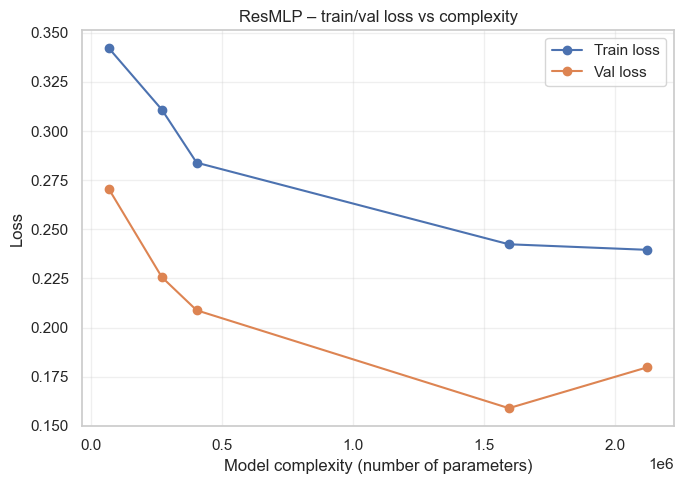

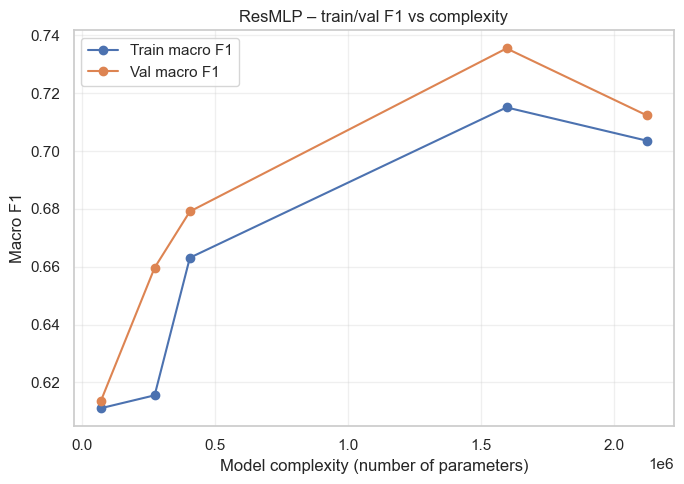

In [125]:
import matplotlib.pyplot as plt

# sort by complexity
res_arch_sorted = sorted(res_arch_results, key=lambda r: r["num_params"])

complexities = [r["num_params"] for r in res_arch_sorted]
names        = [r["name"] for r in res_arch_sorted]
train_loss   = [r["history"]["train_loss"][-1] for r in res_arch_sorted]
val_loss     = [r["history"]["val_loss"][-1]   for r in res_arch_sorted]
train_f1     = [r["history"]["train_macro_f1"][-1] for r in res_arch_sorted]
val_f1       = [r["history"]["val_macro_f1"][-1]   for r in res_arch_sorted]

# Loss vs complexity
plt.figure(figsize=(7,5))
plt.plot(complexities, train_loss, marker="o", label="Train loss")
plt.plot(complexities, val_loss,   marker="o", label="Val loss")
plt.xlabel("Model complexity (number of parameters)")
plt.ylabel("Loss")
plt.title("ResMLP – train/val loss vs complexity")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# F1 vs complexity
plt.figure(figsize=(7,5))
plt.plot(complexities, train_f1, marker="o", label="Train macro F1")
plt.plot(complexities, val_f1,   marker="o", label="Val macro F1")
plt.xlabel("Model complexity (number of parameters)")
plt.ylabel("Macro F1")
plt.title("ResMLP – train/val F1 vs complexity")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


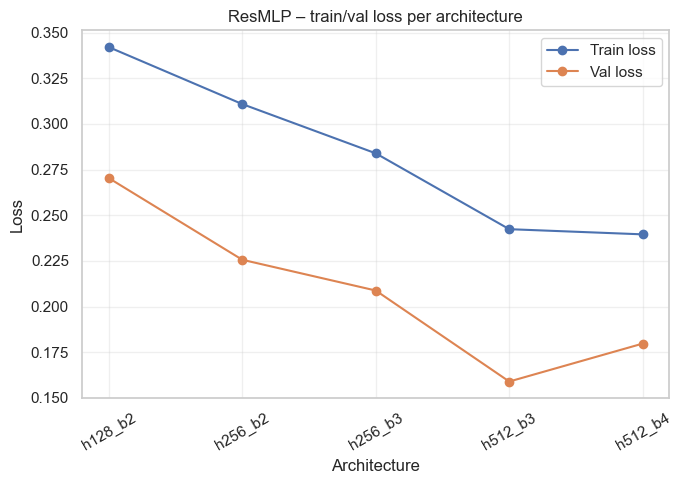

In [126]:
plt.figure(figsize=(7,5))
plt.plot(range(len(names)), train_loss, marker="o", label="Train loss")
plt.plot(range(len(names)), val_loss,   marker="o", label="Val loss")
plt.xticks(range(len(names)), names, rotation=30)
plt.xlabel("Architecture")
plt.ylabel("Loss")
plt.title("ResMLP – train/val loss per architecture")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


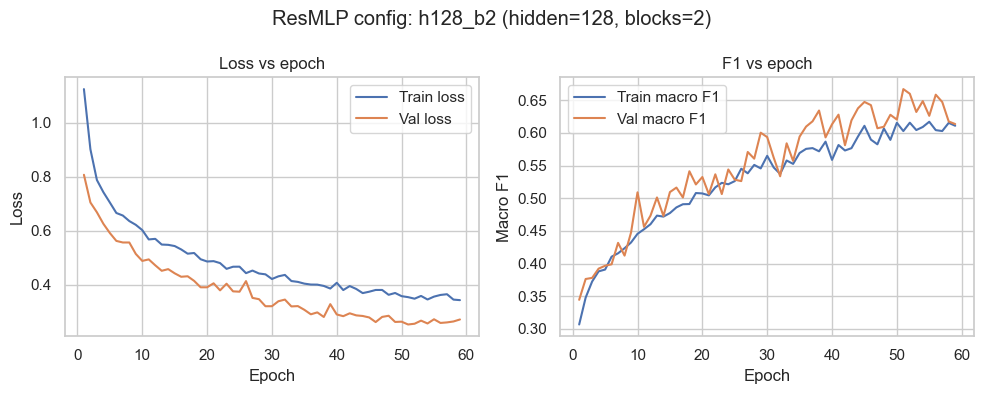

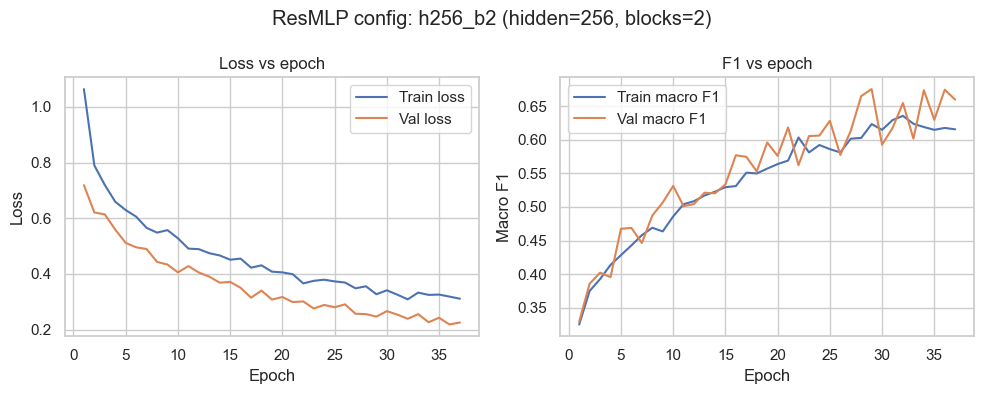

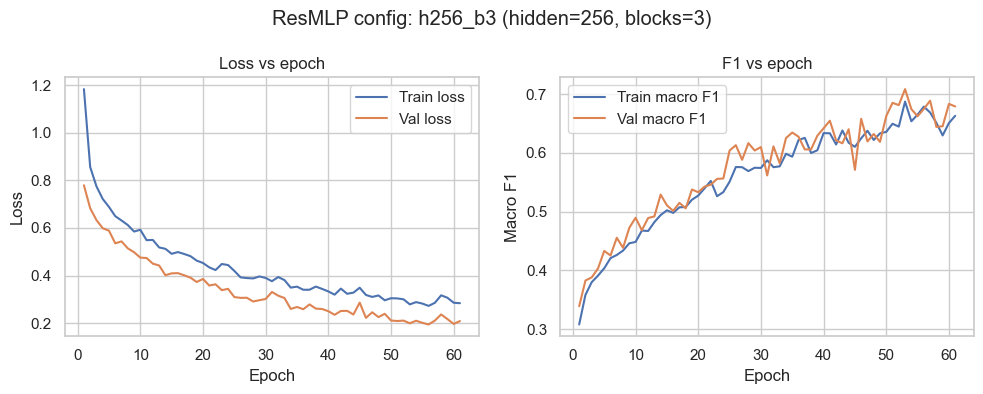

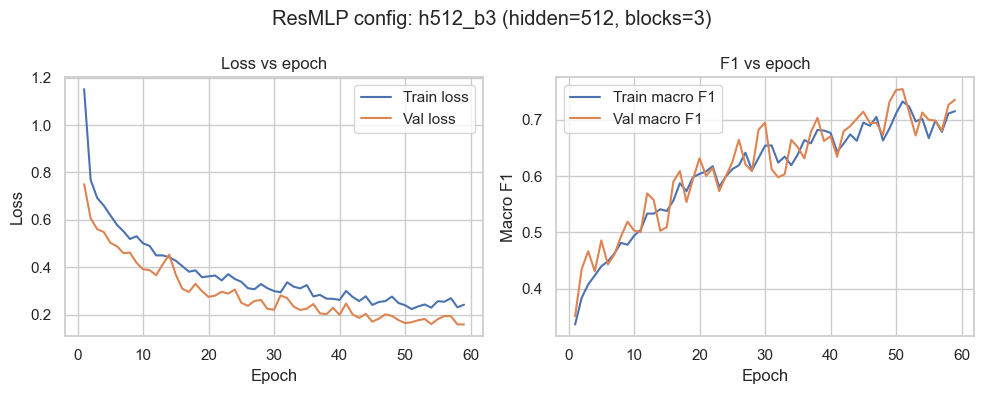

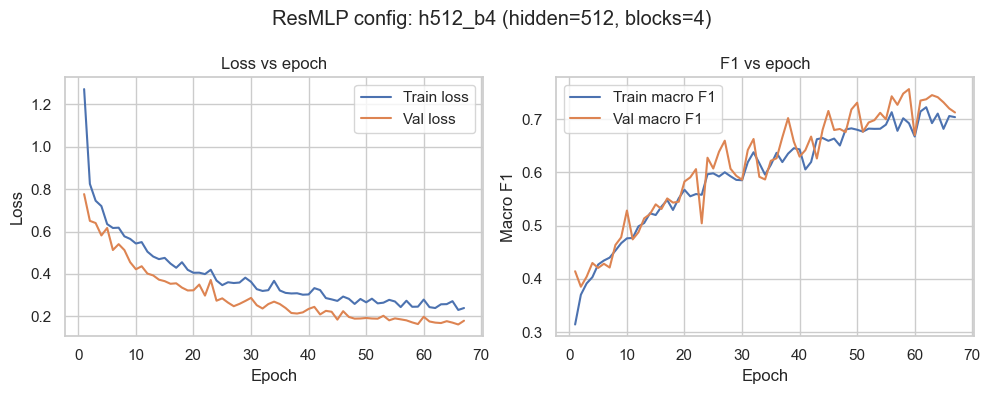

In [127]:
for r in res_arch_results:
    h = r["history"]
    epochs = range(1, len(h["train_loss"]) + 1)

    plt.figure(figsize=(10,4))
    plt.suptitle(f"ResMLP config: {r['name']} "
                 f"(hidden={r['hidden_dim']}, blocks={r['num_blocks']})")

    # Loss
    plt.subplot(1,2,1)
    plt.plot(epochs, h["train_loss"], label="Train loss")
    plt.plot(epochs, h["val_loss"],   label="Val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss vs epoch")
    plt.legend()

    # F1
    plt.subplot(1,2,2)
    plt.plot(epochs, h["train_macro_f1"], label="Train macro F1")
    plt.plot(epochs, h["val_macro_f1"],   label="Val macro F1")
    plt.xlabel("Epoch")
    plt.ylabel("Macro F1")
    plt.title("F1 vs epoch")
    plt.legend()

    plt.tight_layout()
    plt.show()


# RESMLP WITH SMOTE AND FOCAL LOSS

In [128]:
# SMOTE variants
smote_variants = {
    "no_smote":         train_loader,
    "full_smote":       train_loader_full,
    "partial_smote":    train_loader_partial,
    "controlled_smote": train_loader_ctrl,
}

# ResMLP configs (complexity)
res_smote_configs = [
    {"name": "h128_b2",  "hidden_dim": 128, "num_blocks": 2},
    {"name": "h256_b2",  "hidden_dim": 256, "num_blocks": 2},
    {"name": "h256_b3",  "hidden_dim": 256, "num_blocks": 3},
    {"name": "h512_b3",  "hidden_dim": 512, "num_blocks": 3},
    {"name": "h512_b4",  "hidden_dim": 512, "num_blocks": 4},
]

# gamma values to test
gamma_values = [1.0, 1.5, 2.0, 2.5, 3.0]

# use your best ResMLP hyperparams (or set manually)
res_focal_lr = best_res_lr      # e.g. 1e-3
res_focal_wd = best_res_wd      # e.g. 1e-4

def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


In [129]:
import numpy as np
import torch.nn as nn

def train_resmlp_focal_on_loader(
    train_loader,
    hidden_dim,
    num_blocks,
    lr,
    weight_decay,
    gamma,
    max_epochs=120,
    patience=8,
    min_delta=1e-3,
    verbose=True,
):
    model = ResMLP(
        input_dim=input_dim,
        hidden_dim=hidden_dim,
        num_blocks=num_blocks,
        num_classes=num_classes,
        dropout_p=0.3
    ).to(device)

    alpha = class_weights_ce.to(device)
    criterion = FocalLoss(alpha=alpha, gamma=gamma)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    history = {
        "train_loss": [],
        "val_loss": [],
        "train_macro_f1": [],
        "val_macro_f1": [],
    }

    best_val_f1 = -np.inf
    best_state = None
    patience_counter = 0

    for epoch in range(1, max_epochs + 1):
        train_loss, train_acc, train_f1, _, _ = run_epoch(
            model, train_loader, optimizer, criterion, train=True
        )
        val_loss, val_acc, val_f1, _, _ = run_epoch(
            model, val_loader, optimizer, criterion, train=False
        )

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_macro_f1"].append(train_f1)
        history["val_macro_f1"].append(val_f1)

        if val_f1 > best_val_f1 + min_delta:
            best_val_f1 = val_f1
            best_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                if verbose:
                    print(f"  Early stopping at epoch {epoch:02d}")
                break

        if verbose:
            print(
                f"  Epoch {epoch:02d} | "
                f"Train loss {train_loss:.4f}, F1 {train_f1:.4f} | "
                f"Val loss {val_loss:.4f}, F1 {val_f1:.4f}"
            )

    if best_state is not None:
        model.load_state_dict(best_state)

    return model, history, best_val_f1


In [131]:
res_smote_focal_gamma_results = {}  # variant -> list of runs

for variant_name, loader in smote_variants.items():
    print(f"\n=== ResMLP + SMOTE + Focal γ-ablation on {variant_name} ===")
    variant_results = []

    for cfg in res_smote_configs:
        for gamma in gamma_values:
            print(f"\n  >> {variant_name} | {cfg['name']} "
                  f"(hidden={cfg['hidden_dim']}, blocks={cfg['num_blocks']}) | γ={gamma}")

            model, history, best_val_f1 = train_resmlp_focal_on_loader(
                train_loader=loader,
                hidden_dim=cfg["hidden_dim"],
                num_blocks=cfg["num_blocks"],
                lr=res_focal_lr,
                weight_decay=res_focal_wd,
                gamma=gamma,
                max_epochs=1500,
                patience=8,
                min_delta=1e-3,
                verbose=True,
            )

            num_params = count_params(model)

            variant_results.append({
                "variant": variant_name,
                "config_name": cfg["name"],
                "hidden_dim": cfg["hidden_dim"],
                "num_blocks": cfg["num_blocks"],
                "gamma": gamma,
                "lr": res_focal_lr,
                "weight_decay": res_focal_wd,
                "model": model,
                "history": history,
                "best_val_f1": best_val_f1,
                "num_params": num_params,
            })

    res_smote_focal_gamma_results[variant_name] = variant_results



=== ResMLP + SMOTE + Focal γ-ablation on no_smote ===

  >> no_smote | h128_b2 (hidden=128, blocks=2) | γ=1.0
  Epoch 01 | Train loss 0.0095, F1 0.2221 | Val loss 0.0067, F1 0.2483
  Epoch 02 | Train loss 0.0068, F1 0.2938 | Val loss 0.0053, F1 0.2910
  Epoch 03 | Train loss 0.0060, F1 0.3179 | Val loss 0.0045, F1 0.3327
  Epoch 04 | Train loss 0.0051, F1 0.3371 | Val loss 0.0041, F1 0.3448
  Epoch 05 | Train loss 0.0049, F1 0.3507 | Val loss 0.0042, F1 0.3331
  Epoch 06 | Train loss 0.0044, F1 0.3631 | Val loss 0.0035, F1 0.4150
  Epoch 07 | Train loss 0.0044, F1 0.3664 | Val loss 0.0035, F1 0.3721
  Epoch 08 | Train loss 0.0042, F1 0.3745 | Val loss 0.0035, F1 0.3910
  Epoch 09 | Train loss 0.0039, F1 0.3865 | Val loss 0.0034, F1 0.4010
  Epoch 10 | Train loss 0.0039, F1 0.3898 | Val loss 0.0032, F1 0.4105
  Epoch 11 | Train loss 0.0039, F1 0.3946 | Val loss 0.0033, F1 0.4184
  Epoch 12 | Train loss 0.0040, F1 0.3907 | Val loss 0.0031, F1 0.4407
  Epoch 13 | Train loss 0.0038, F1 0.

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def evaluate_res_model_on_test(model, gamma, num_classes=4):
    model.eval()
    alpha_eval = class_weights_ce.to(device)
    criterion_eval = FocalLoss(alpha=alpha_eval, gamma=gamma)

    test_loss, test_acc, test_f1, y_true, y_pred = run_epoch(
        model,
        test_loader,
        optimizer=None,
        criterion=criterion_eval,
        train=False
    )

    return {
        "test_loss": test_loss,
        "test_acc": test_acc,
        "test_macro_f1": test_f1,
        "y_true": y_true,
        "y_pred": y_pred,
    }

# evaluate every ResMLP run
res_all_results = []

for var_name, results_list in res_smote_focal_gamma_results.items():
    print(f"\n=== Testing ResMLP models for variant: {var_name} ===")
    for r in results_list:
        metrics = evaluate_res_model_on_test(r["model"], gamma=r["gamma"])

        y_true = metrics["y_true"]
        y_pred = metrics["y_pred"]

        # per-metric
        prec = precision_score(y_true, y_pred, average="macro", zero_division=0)
        rec  = recall_score(y_true, y_pred, average="macro", zero_division=0)
        f1   = metrics["test_macro_f1"]   # already macro F1 from run_epoch
        acc  = accuracy_score(y_true, y_pred)

        r["test_loss"]      = metrics["test_loss"]
        r["test_accuracy"]  = acc
        r["test_precision"] = prec
        r["test_recall"]    = rec
        r["test_macro_f1"]  = f1
        r["y_true"]         = y_true
        r["y_pred"]         = y_pred

        res_all_results.append(r)

        print(
            f"  {r['variant']} | {r['config_name']} | γ={r['gamma']} | "
            f"params={r['num_params']} | "
            f"Acc={acc:.4f}, P={prec:.4f}, R={rec:.4f}, F1={f1:.4f}"
        )



=== Testing ResMLP models for variant: no_smote ===
  no_smote | h128_b2 | γ=1.0 | params=70532 | Acc=0.7611, P=0.4841, R=0.8621, F1=0.5483
  no_smote | h128_b2 | γ=1.5 | params=70532 | Acc=0.7421, P=0.4873, R=0.8613, F1=0.5576
  no_smote | h128_b2 | γ=2.0 | params=70532 | Acc=0.7249, P=0.4516, R=0.8330, F1=0.5104
  no_smote | h128_b2 | γ=2.5 | params=70532 | Acc=0.7721, P=0.4993, R=0.8386, F1=0.5768
  no_smote | h128_b2 | γ=3.0 | params=70532 | Acc=0.7348, P=0.4560, R=0.8315, F1=0.5196
  no_smote | h256_b2 | γ=1.0 | params=272132 | Acc=0.7903, P=0.5495, R=0.8932, F1=0.6236
  no_smote | h256_b2 | γ=1.5 | params=272132 | Acc=0.7553, P=0.5083, R=0.8766, F1=0.5840
  no_smote | h256_b2 | γ=2.0 | params=272132 | Acc=0.7622, P=0.5288, R=0.8872, F1=0.5949
  no_smote | h256_b2 | γ=2.5 | params=272132 | Acc=0.7049, P=0.4683, R=0.8438, F1=0.5288
  no_smote | h256_b2 | γ=3.0 | params=272132 | Acc=0.7024, P=0.4017, R=0.7824, F1=0.4212
  no_smote | h256_b3 | γ=1.0 | params=404740 | Acc=0.7748, P=0


################################################################################
SMOTE variant: no_smote
################################################################################
MODEL: h128_b2 | γ=1.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.761 | Test macro F1: 0.548
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.963     0.763     0.851     11421
           C      0.443     0.719     0.548      2546
           M      0.406     0.966     0.571       387
           X      0.125     1.000     0.222        36

    accuracy                          0.761     14390
   macro avg      0.484     0.862     0.548     14390
weighted avg      0.854     0.761     0.788     14390



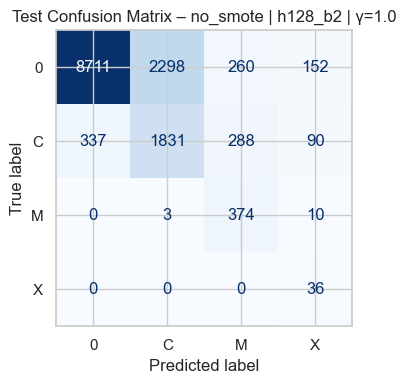

MODEL: h128_b2 | γ=1.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.742 | Test macro F1: 0.558
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.973     0.735     0.837     11421
           C      0.413     0.736     0.529      2546
           M      0.359     0.974     0.524       387
           X      0.205     1.000     0.340        36

    accuracy                          0.742     14390
   macro avg      0.487     0.861     0.558     14390
weighted avg      0.855     0.742     0.773     14390



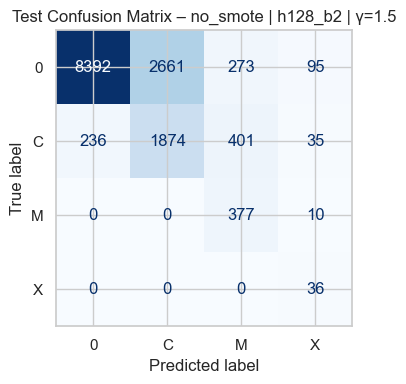

MODEL: h128_b2 | γ=2.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.725 | Test macro F1: 0.510
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.952     0.735     0.830     11421
           C      0.389     0.638     0.483      2546
           M      0.332     0.959     0.494       387
           X      0.133     1.000     0.235        36

    accuracy                          0.725     14390
   macro avg      0.452     0.833     0.510     14390
weighted avg      0.833     0.725     0.758     14390



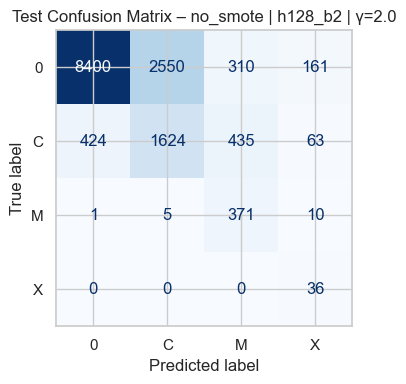

MODEL: h128_b2 | γ=2.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.772 | Test macro F1: 0.577
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.938     0.812     0.870     11421
           C      0.433     0.558     0.488      2546
           M      0.349     0.984     0.516       387
           X      0.277     1.000     0.434        36

    accuracy                          0.772     14390
   macro avg      0.499     0.839     0.577     14390
weighted avg      0.831     0.772     0.792     14390



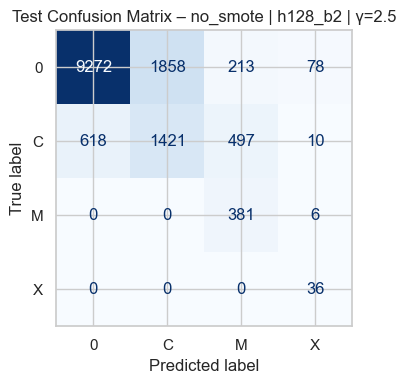

MODEL: h128_b2 | γ=3.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.735 | Test macro F1: 0.520
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.937     0.760     0.839     11421
           C      0.390     0.582     0.467      2546
           M      0.351     0.984     0.517       387
           X      0.146     1.000     0.255        36

    accuracy                          0.735     14390
   macro avg      0.456     0.832     0.520     14390
weighted avg      0.822     0.735     0.763     14390



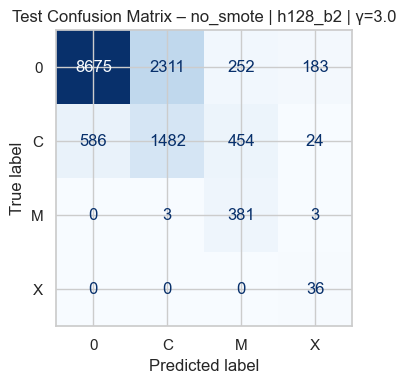

MODEL: h256_b2 | γ=1.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.790 | Test macro F1: 0.624
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.985     0.771     0.865     11421
           C      0.470     0.848     0.605      2546
           M      0.543     0.953     0.692       387
           X      0.199     1.000     0.332        36

    accuracy                          0.790     14390
   macro avg      0.550     0.893     0.624     14390
weighted avg      0.880     0.790     0.813     14390



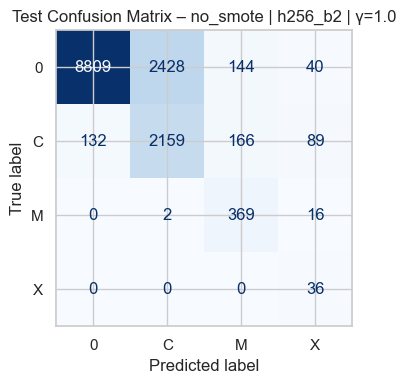

MODEL: h256_b2 | γ=1.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.755 | Test macro F1: 0.584
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.972     0.740     0.840     11421
           C      0.435     0.784     0.560      2546
           M      0.406     0.982     0.574       387
           X      0.221     1.000     0.362        36

    accuracy                          0.755     14390
   macro avg      0.508     0.877     0.584     14390
weighted avg      0.860     0.755     0.782     14390



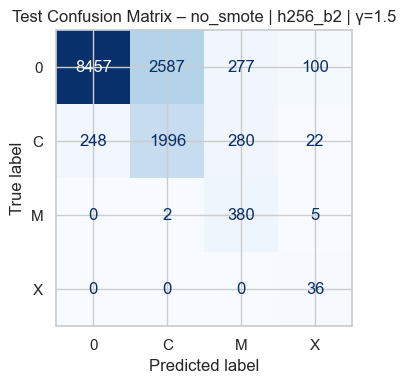

MODEL: h256_b2 | γ=2.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.762 | Test macro F1: 0.595
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.974     0.739     0.840     11421
           C      0.441     0.831     0.576      2546
           M      0.553     0.979     0.707       387
           X      0.147     1.000     0.256        36

    accuracy                          0.762     14390
   macro avg      0.529     0.887     0.595     14390
weighted avg      0.866     0.762     0.788     14390



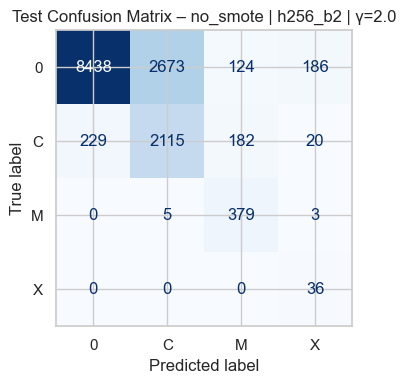

MODEL: h256_b2 | γ=2.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.705 | Test macro F1: 0.529
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.962     0.694     0.806     11421
           C      0.364     0.710     0.481      2546
           M      0.390     0.972     0.557       387
           X      0.157     1.000     0.271        36

    accuracy                          0.705     14390
   macro avg      0.468     0.844     0.529     14390
weighted avg      0.839     0.705     0.741     14390



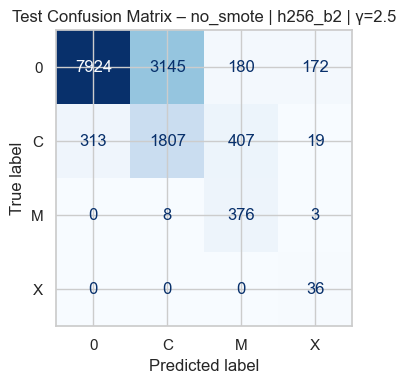

MODEL: h256_b2 | γ=3.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.702 | Test macro F1: 0.421
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.929     0.760     0.836     11421
           C      0.411     0.397     0.404      2546
           M      0.229     0.972     0.370       387
           X      0.039     1.000     0.074        36

    accuracy                          0.702     14390
   macro avg      0.402     0.782     0.421     14390
weighted avg      0.816     0.702     0.745     14390



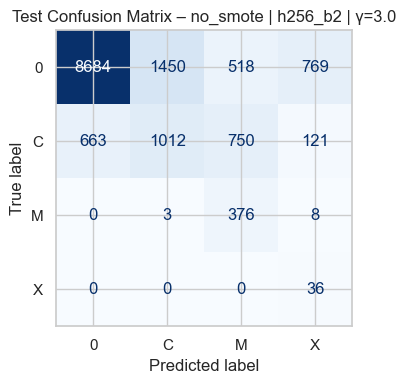

MODEL: h256_b3 | γ=1.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.775 | Test macro F1: 0.609
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.985     0.752     0.853     11421
           C      0.451     0.844     0.588      2546
           M      0.520     0.959     0.674       387
           X      0.191     1.000     0.321        36

    accuracy                          0.775     14390
   macro avg      0.537     0.889     0.609     14390
weighted avg      0.876     0.775     0.800     14390



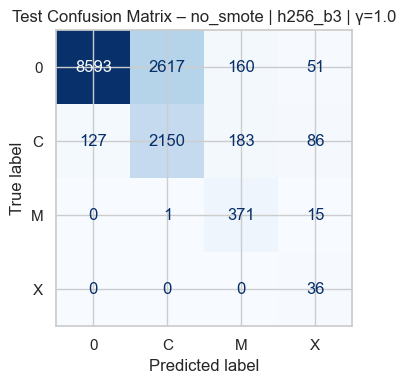

MODEL: h256_b3 | γ=1.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.751 | Test macro F1: 0.583
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.973     0.740     0.840     11421
           C      0.420     0.764     0.542      2546
           M      0.406     0.969     0.573       387
           X      0.232     1.000     0.377        36

    accuracy                          0.751     14390
   macro avg      0.508     0.868     0.583     14390
weighted avg      0.858     0.751     0.779     14390



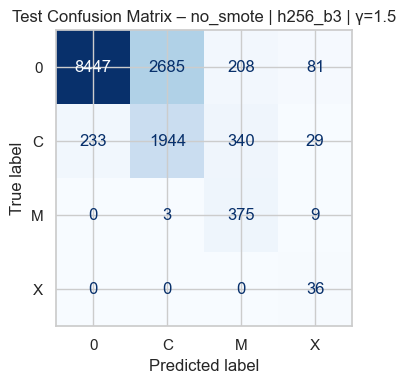

MODEL: h256_b3 | γ=2.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.735 | Test macro F1: 0.578
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.980     0.712     0.825     11421
           C      0.403     0.797     0.536      2546
           M      0.426     0.974     0.592       387
           X      0.218     1.000     0.358        36

    accuracy                          0.735     14390
   macro avg      0.507     0.871     0.578     14390
weighted avg      0.861     0.735     0.766     14390



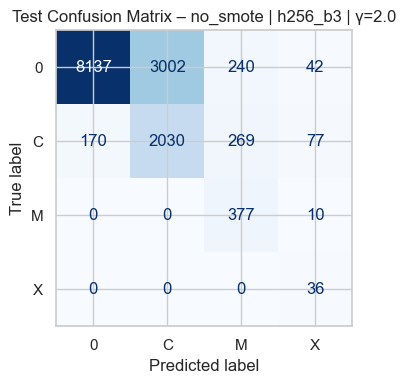

MODEL: h256_b3 | γ=2.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.714 | Test macro F1: 0.483
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.943     0.734     0.825     11421
           C      0.375     0.582     0.456      2546
           M      0.340     0.966     0.503       387
           X      0.081     1.000     0.150        36

    accuracy                          0.714     14390
   macro avg      0.435     0.821     0.483     14390
weighted avg      0.824     0.714     0.750     14390



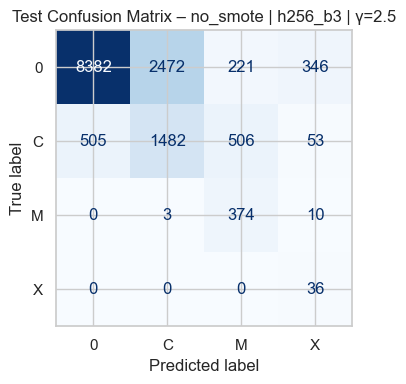

MODEL: h256_b3 | γ=3.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.688 | Test macro F1: 0.430
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.937     0.740     0.827     11421
           C      0.319     0.409     0.359      2546
           M      0.211     0.956     0.345       387
           X      0.105     1.000     0.190        36

    accuracy                          0.688     14390
   macro avg      0.393     0.776     0.430     14390
weighted avg      0.806     0.688     0.730     14390



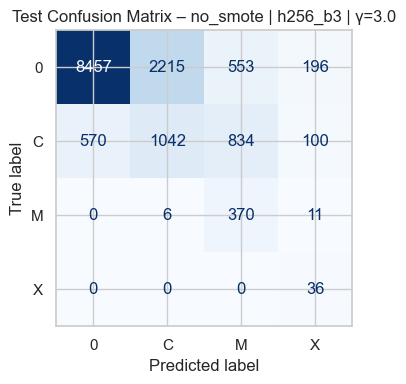

MODEL: h512_b3 | γ=1.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.757 | Test macro F1: 0.552
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.977     0.754     0.851     11421
           C      0.429     0.732     0.541      2546
           M      0.366     0.959     0.530       387
           X      0.169     0.972     0.288        36

    accuracy                          0.757     14390
   macro avg      0.485     0.854     0.552     14390
weighted avg      0.861     0.757     0.786     14390



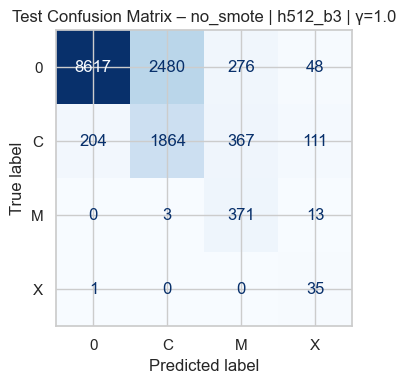

MODEL: h512_b3 | γ=1.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.721 | Test macro F1: 0.495
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.953     0.725     0.824     11421
           C      0.425     0.660     0.517      2546
           M      0.384     0.961     0.549       387
           X      0.046     1.000     0.088        36

    accuracy                          0.721     14390
   macro avg      0.452     0.837     0.495     14390
weighted avg      0.842     0.721     0.760     14390



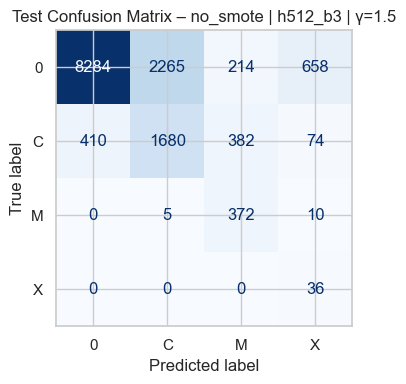

MODEL: h512_b3 | γ=2.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.735 | Test macro F1: 0.547
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.968     0.727     0.831     11421
           C      0.403     0.727     0.519      2546
           M      0.377     0.984     0.545       387
           X      0.172     1.000     0.294        36

    accuracy                          0.735     14390
   macro avg      0.480     0.860     0.547     14390
weighted avg      0.850     0.735     0.766     14390



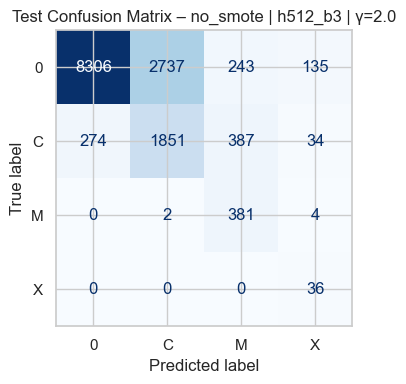

MODEL: h512_b3 | γ=2.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.656 | Test macro F1: 0.409
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.949     0.683     0.794     11421
           C      0.326     0.485     0.390      2546
           M      0.209     0.956     0.343       387
           X      0.059     1.000     0.111        36

    accuracy                          0.656     14390
   macro avg      0.386     0.781     0.409     14390
weighted avg      0.817     0.656     0.709     14390



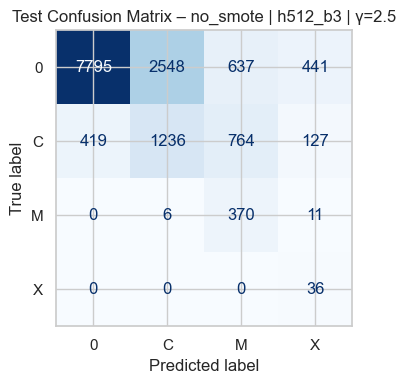

MODEL: h512_b3 | γ=3.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.665 | Test macro F1: 0.441
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.948     0.677     0.790     11421
           C      0.329     0.580     0.420      2546
           M      0.312     0.850     0.457       387
           X      0.052     1.000     0.098        36

    accuracy                          0.665     14390
   macro avg      0.410     0.777     0.441     14390
weighted avg      0.819     0.665     0.714     14390



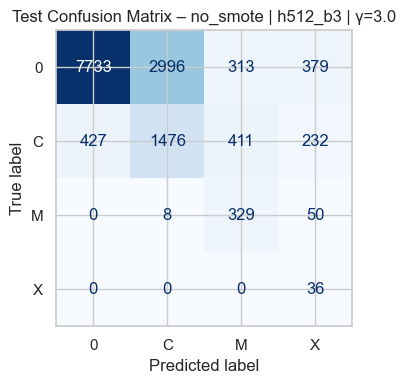

MODEL: h512_b4 | γ=1.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.768 | Test macro F1: 0.613
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.981     0.744     0.847     11421
           C      0.447     0.839     0.583      2546
           M      0.484     0.984     0.649       387
           X      0.231     1.000     0.375        36

    accuracy                          0.768     14390
   macro avg      0.536     0.892     0.613     14390
weighted avg      0.871     0.768     0.793     14390



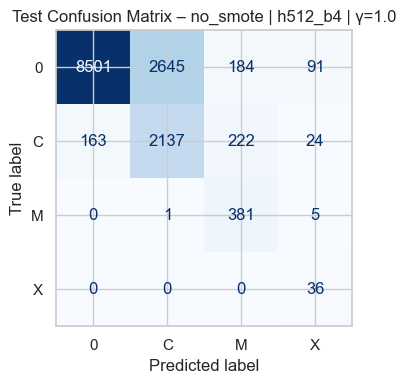

MODEL: h512_b4 | γ=1.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.762 | Test macro F1: 0.568
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.972     0.757     0.851     11421
           C      0.440     0.747     0.554      2546
           M      0.385     0.974     0.552       387
           X      0.187     1.000     0.314        36

    accuracy                          0.762     14390
   macro avg      0.496     0.870     0.568     14390
weighted avg      0.860     0.762     0.789     14390



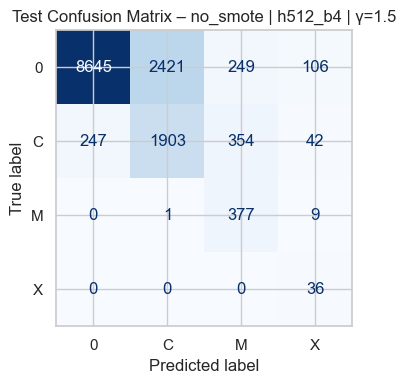

MODEL: h512_b4 | γ=2.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.726 | Test macro F1: 0.497
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.950     0.748     0.837     11421
           C      0.387     0.586     0.466      2546
           M      0.292     0.964     0.449       387
           X      0.134     1.000     0.236        36

    accuracy                          0.726     14390
   macro avg      0.441     0.824     0.497     14390
weighted avg      0.831     0.726     0.759     14390



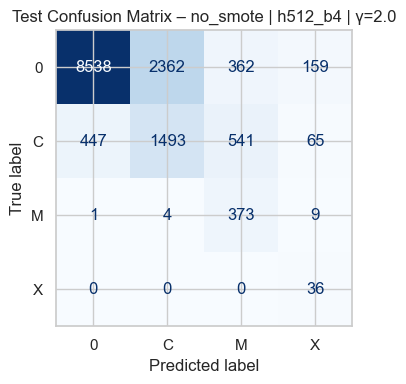

MODEL: h512_b4 | γ=2.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.726 | Test macro F1: 0.479
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.942     0.760     0.841     11421
           C      0.380     0.534     0.444      2546
           M      0.301     0.951     0.457       387
           X      0.094     1.000     0.172        36

    accuracy                          0.726     14390
   macro avg      0.429     0.811     0.479     14390
weighted avg      0.823     0.726     0.759     14390



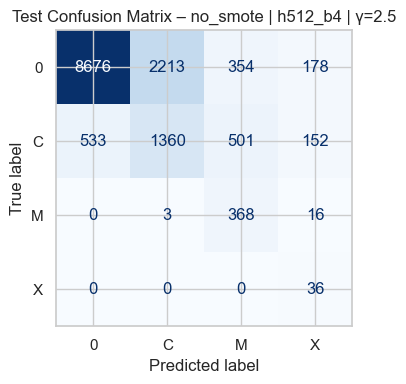

MODEL: h512_b4 | γ=3.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.716 | Test macro F1: 0.456
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.933     0.764     0.840     11421
           C      0.359     0.455     0.401      2546
           M      0.262     0.964     0.412       387
           X      0.094     1.000     0.172        36

    accuracy                          0.716     14390
   macro avg      0.412     0.796     0.456     14390
weighted avg      0.812     0.716     0.750     14390



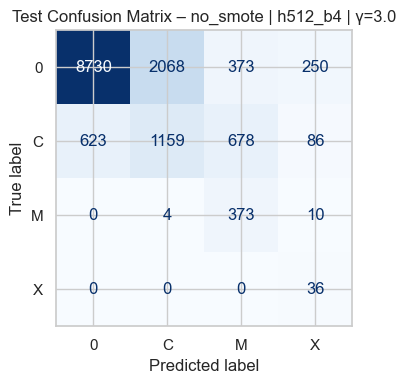


################################################################################
SMOTE variant: full_smote
################################################################################
MODEL: h128_b2 | γ=1.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.230 | Test macro F1: 0.209
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      1.000     0.135     0.239     11421
           C      0.144     0.533     0.227      2546
           M      0.120     0.946     0.213       387
           X      0.086     0.944     0.157        36

    accuracy                          0.230     14390
   macro avg      0.338     0.640     0.209     14390
weighted avg      0.823     0.230     0.236     14390



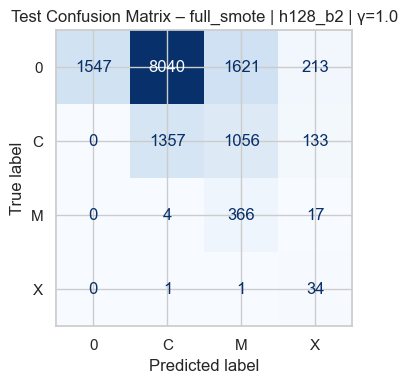

MODEL: h128_b2 | γ=1.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.246 | Test macro F1: 0.207
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.152     0.264     11421
           C      0.157     0.546     0.244      2546
           M      0.115     0.979     0.205       387
           X      0.062     0.889     0.116        36

    accuracy                          0.246     14390
   macro avg      0.333     0.641     0.207     14390
weighted avg      0.824     0.246     0.259     14390



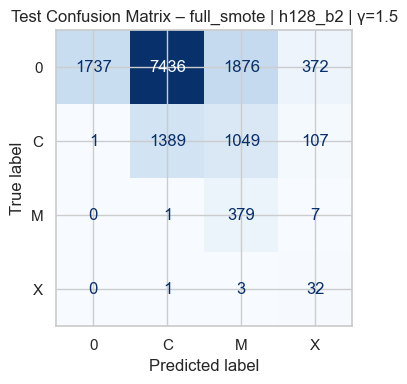

MODEL: h128_b2 | γ=2.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.227 | Test macro F1: 0.206
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.141     0.247     11421
           C      0.141     0.494     0.220      2546
           M      0.106     0.956     0.191       387
           X      0.091     1.000     0.167        36

    accuracy                          0.227     14390
   macro avg      0.334     0.648     0.206     14390
weighted avg      0.821     0.227     0.240     14390



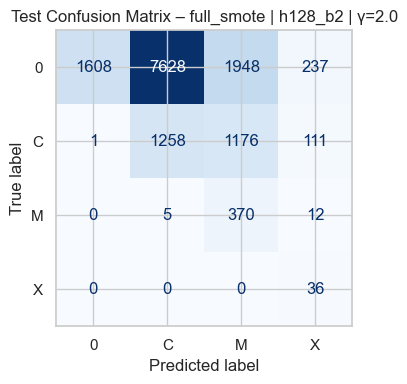

MODEL: h128_b2 | γ=2.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.207 | Test macro F1: 0.173
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.137     0.240     11421
           C      0.126     0.406     0.193      2546
           M      0.088     0.899     0.160       387
           X      0.052     0.972     0.098        36

    accuracy                          0.207     14390
   macro avg      0.316     0.604     0.173     14390
weighted avg      0.818     0.207     0.229     14390



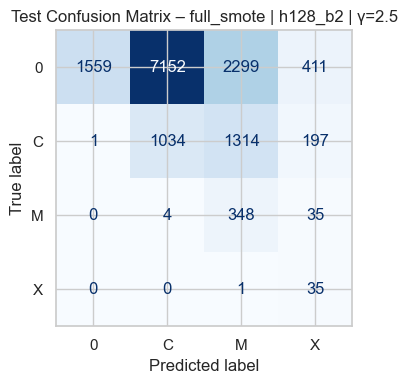

MODEL: h128_b2 | γ=3.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.205 | Test macro F1: 0.173
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.136     0.239     11421
           C      0.124     0.394     0.188      2546
           M      0.088     0.928     0.160       387
           X      0.056     0.972     0.105        36

    accuracy                          0.205     14390
   macro avg      0.317     0.607     0.173     14390
weighted avg      0.818     0.205     0.228     14390



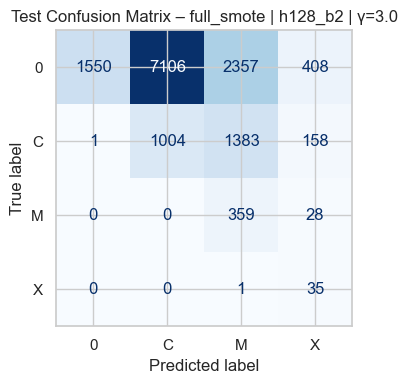

MODEL: h256_b2 | γ=1.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.285 | Test macro F1: 0.224
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      1.000     0.209     0.346     11421
           C      0.161     0.522     0.246      2546
           M      0.111     0.915     0.198       387
           X      0.056     0.889     0.105        36

    accuracy                          0.285     14390
   macro avg      0.332     0.634     0.224     14390
weighted avg      0.825     0.285     0.324     14390



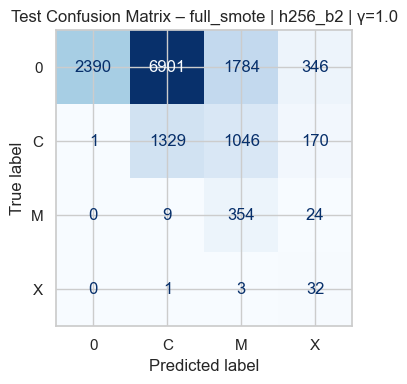

MODEL: h256_b2 | γ=1.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.347 | Test macro F1: 0.280
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.996     0.267     0.422     11421
           C      0.183     0.601     0.280      2546
           M      0.142     0.977     0.248       387
           X      0.096     0.778     0.171        36

    accuracy                          0.347     14390
   macro avg      0.354     0.656     0.280     14390
weighted avg      0.827     0.347     0.391     14390



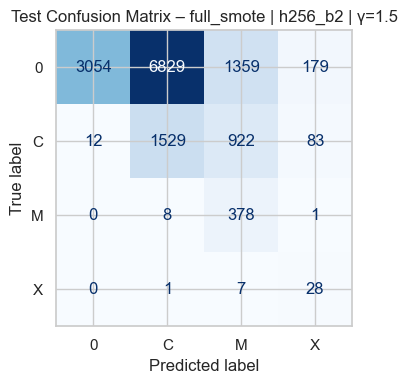

MODEL: h256_b2 | γ=2.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.301 | Test macro F1: 0.254
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.212     0.349     11421
           C      0.174     0.599     0.269      2546
           M      0.126     0.930     0.222       387
           X      0.098     0.917     0.176        36

    accuracy                          0.301     14390
   macro avg      0.349     0.664     0.254     14390
weighted avg      0.827     0.301     0.331     14390



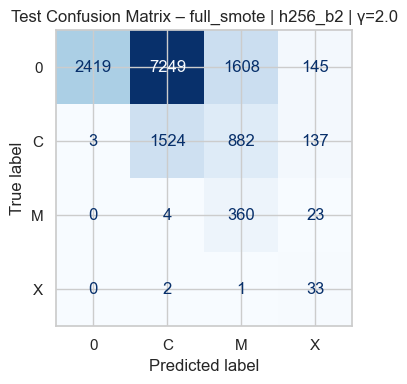

MODEL: h256_b2 | γ=2.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.264 | Test macro F1: 0.227
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.173     0.296     11421
           C      0.158     0.557     0.246      2546
           M      0.123     0.959     0.218       387
           X      0.081     0.944     0.148        36

    accuracy                          0.264     14390
   macro avg      0.340     0.658     0.227     14390
weighted avg      0.825     0.264     0.284     14390



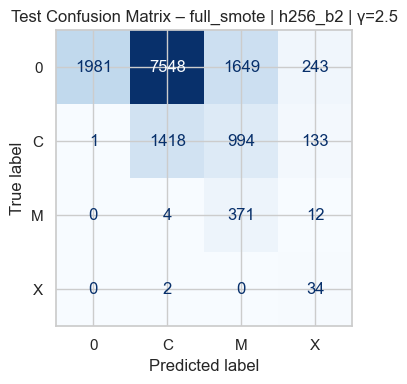

MODEL: h256_b2 | γ=3.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.238 | Test macro F1: 0.199
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      1.000     0.142     0.249     11421
           C      0.156     0.557     0.244      2546
           M      0.116     0.899     0.206       387
           X      0.052     1.000     0.099        36

    accuracy                          0.238     14390
   macro avg      0.331     0.649     0.199     14390
weighted avg      0.825     0.238     0.246     14390



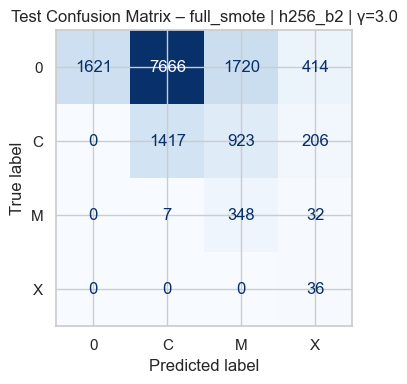

MODEL: h256_b3 | γ=1.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.270 | Test macro F1: 0.226
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.184     0.311     11421
           C      0.156     0.546     0.243      2546
           M      0.121     0.933     0.214       387
           X      0.075     0.833     0.138        36

    accuracy                          0.270     14390
   macro avg      0.337     0.624     0.226     14390
weighted avg      0.822     0.270     0.296     14390



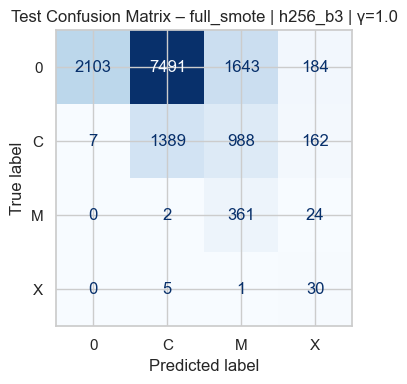

MODEL: h256_b3 | γ=1.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.265 | Test macro F1: 0.214
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.186     0.314     11421
           C      0.155     0.502     0.237      2546
           M      0.113     0.974     0.202       387
           X      0.055     1.000     0.105        36

    accuracy                          0.265     14390
   macro avg      0.330     0.666     0.214     14390
weighted avg      0.823     0.265     0.297     14390



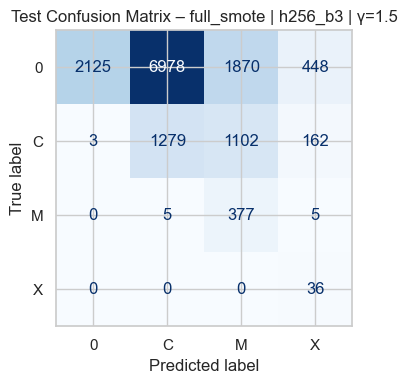

MODEL: h256_b3 | γ=2.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.215 | Test macro F1: 0.189
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.137     0.241     11421
           C      0.133     0.452     0.205      2546
           M      0.095     0.917     0.173       387
           X      0.073     0.917     0.135        36

    accuracy                          0.215     14390
   macro avg      0.325     0.606     0.189     14390
weighted avg      0.819     0.215     0.232     14390



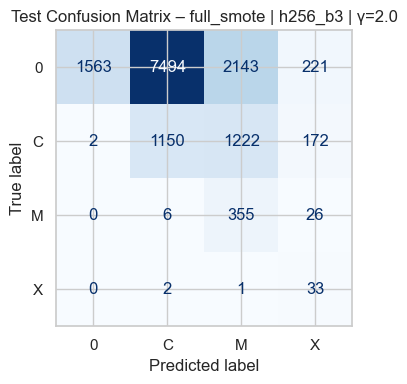

MODEL: h256_b3 | γ=2.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.237 | Test macro F1: 0.195
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      1.000     0.145     0.253     11421
           C      0.150     0.533     0.234      2546
           M      0.116     0.982     0.208       387
           X      0.045     0.528     0.083        36

    accuracy                          0.237     14390
   macro avg      0.328     0.547     0.195     14390
weighted avg      0.823     0.237     0.248     14390



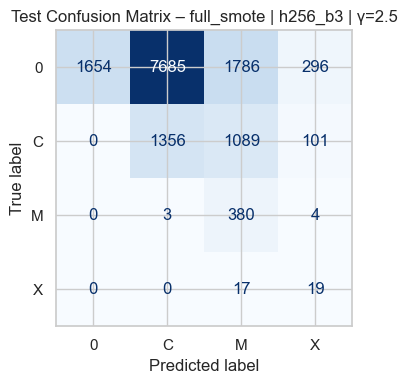

MODEL: h256_b3 | γ=3.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.219 | Test macro F1: 0.187
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.998     0.132     0.234     11421
           C      0.139     0.504     0.218      2546
           M      0.106     0.840     0.189       387
           X      0.057     0.917     0.108        36

    accuracy                          0.219     14390
   macro avg      0.325     0.598     0.187     14390
weighted avg      0.820     0.219     0.229     14390



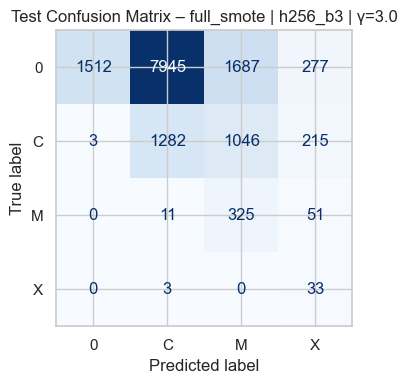

MODEL: h512_b3 | γ=1.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.288 | Test macro F1: 0.233
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.998     0.208     0.344     11421
           C      0.165     0.549     0.254      2546
           M      0.111     0.899     0.198       387
           X      0.075     0.861     0.138        36

    accuracy                          0.288     14390
   macro avg      0.337     0.629     0.233     14390
weighted avg      0.825     0.288     0.323     14390



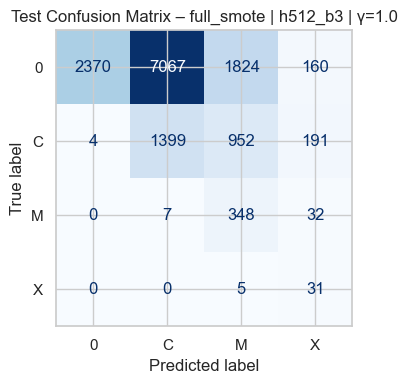

MODEL: h512_b3 | γ=1.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.322 | Test macro F1: 0.262
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.237     0.384     11421
           C      0.179     0.601     0.276      2546
           M      0.128     0.912     0.224       387
           X      0.089     0.917     0.163        36

    accuracy                          0.322     14390
   macro avg      0.348     0.667     0.262     14390
weighted avg      0.826     0.322     0.360     14390



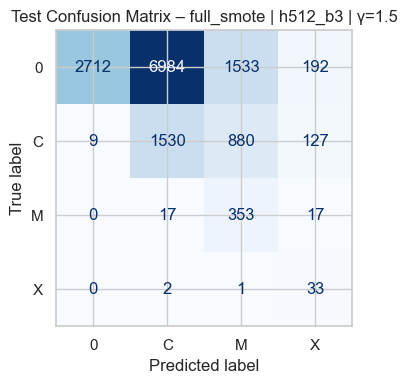

MODEL: h512_b3 | γ=2.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.288 | Test macro F1: 0.238
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.201     0.334     11421
           C      0.167     0.572     0.258      2546
           M      0.124     0.935     0.219       387
           X      0.077     0.917     0.142        36

    accuracy                          0.288     14390
   macro avg      0.341     0.656     0.238     14390
weighted avg      0.825     0.288     0.317     14390



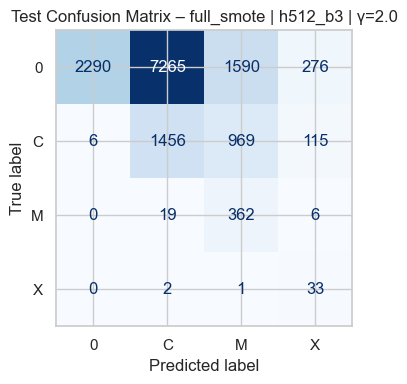

MODEL: h512_b3 | γ=2.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.251 | Test macro F1: 0.206
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.154     0.267     11421
           C      0.161     0.576     0.251      2546
           M      0.123     0.884     0.216       387
           X      0.046     0.917     0.088        36

    accuracy                          0.251     14390
   macro avg      0.332     0.633     0.206     14390
weighted avg      0.825     0.251     0.263     14390



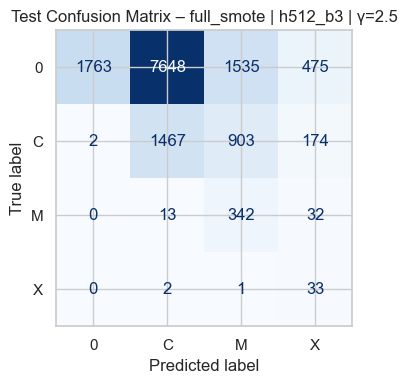

MODEL: h512_b3 | γ=3.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.244 | Test macro F1: 0.208
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.998     0.150     0.261     11421
           C      0.152     0.548     0.238      2546
           M      0.124     0.922     0.218       387
           X      0.061     1.000     0.115        36

    accuracy                          0.244     14390
   macro avg      0.334     0.655     0.208     14390
weighted avg      0.823     0.244     0.256     14390



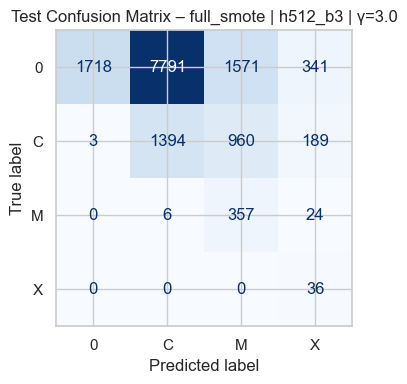

MODEL: h512_b4 | γ=1.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.297 | Test macro F1: 0.241
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.205     0.340     11421
           C      0.173     0.603     0.269      2546
           M      0.139     0.920     0.241       387
           X      0.059     1.000     0.112        36

    accuracy                          0.297     14390
   macro avg      0.343     0.682     0.241     14390
weighted avg      0.828     0.297     0.324     14390



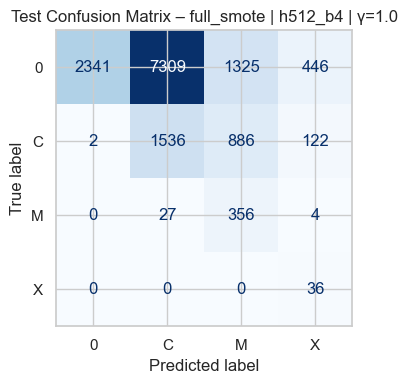

MODEL: h512_b4 | γ=1.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.294 | Test macro F1: 0.242
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.208     0.344     11421
           C      0.168     0.575     0.260      2546
           M      0.126     0.935     0.222       387
           X      0.077     0.944     0.143        36

    accuracy                          0.294     14390
   macro avg      0.342     0.666     0.242     14390
weighted avg      0.825     0.294     0.326     14390



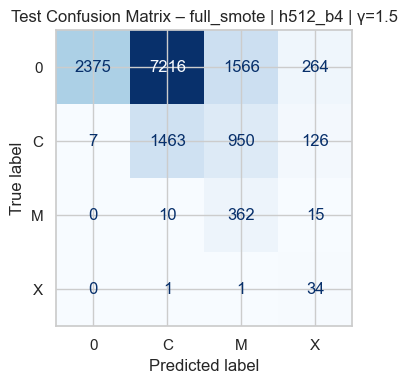

MODEL: h512_b4 | γ=2.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.233 | Test macro F1: 0.188
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.143     0.250     11421
           C      0.160     0.528     0.246      2546
           M      0.112     0.907     0.199       387
           X      0.029     1.000     0.057        36

    accuracy                          0.233     14390
   macro avg      0.325     0.644     0.188     14390
weighted avg      0.825     0.233     0.247     14390



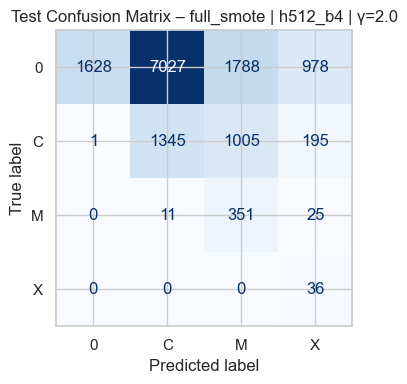

MODEL: h512_b4 | γ=2.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.212 | Test macro F1: 0.179
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.134     0.236     11421
           C      0.133     0.441     0.204      2546
           M      0.098     0.948     0.178       387
           X      0.051     0.944     0.096        36

    accuracy                          0.212     14390
   macro avg      0.320     0.617     0.179     14390
weighted avg      0.819     0.212     0.229     14390



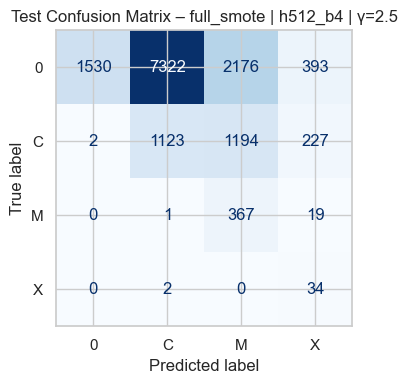

MODEL: h512_b4 | γ=3.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.219 | Test macro F1: 0.193
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.999     0.116     0.207     11421
           C      0.149     0.568     0.237      2546
           M      0.127     0.904     0.222       387
           X      0.055     0.972     0.104        36

    accuracy                          0.219     14390
   macro avg      0.333     0.640     0.193     14390
weighted avg      0.823     0.219     0.213     14390



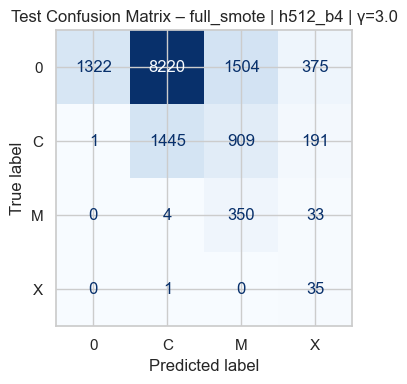


################################################################################
SMOTE variant: partial_smote
################################################################################
MODEL: h128_b2 | γ=1.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.368 | Test macro F1: 0.271
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.310     0.472     11421
           C      0.188     0.526     0.277      2546
           M      0.121     0.977     0.216       387
           X      0.064     1.000     0.120        36

    accuracy                          0.368     14390
   macro avg      0.341     0.703     0.271     14390
weighted avg      0.824     0.368     0.430     14390



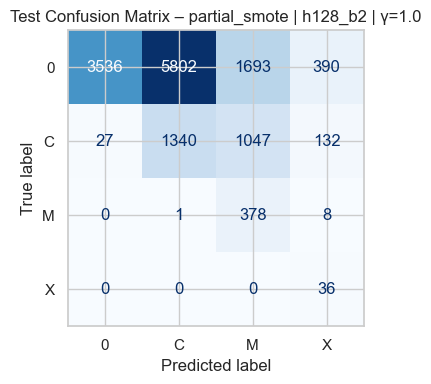

MODEL: h128_b2 | γ=1.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.340 | Test macro F1: 0.251
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.298     0.458     11421
           C      0.155     0.425     0.227      2546
           M      0.107     0.964     0.193       387
           X      0.067     0.972     0.125        36

    accuracy                          0.340     14390
   macro avg      0.330     0.665     0.251     14390
weighted avg      0.818     0.340     0.409     14390



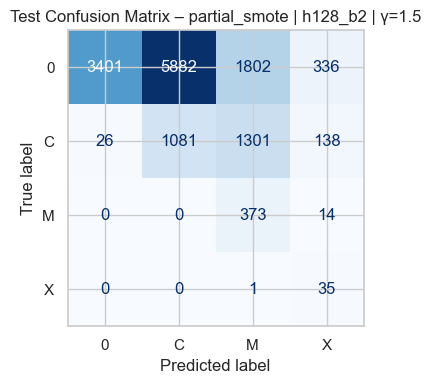

MODEL: h128_b2 | γ=2.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.366 | Test macro F1: 0.288
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.994     0.293     0.453     11421
           C      0.184     0.587     0.281      2546
           M      0.157     0.995     0.271       387
           X      0.079     1.000     0.146        36

    accuracy                          0.366     14390
   macro avg      0.354     0.719     0.288     14390
weighted avg      0.826     0.366     0.417     14390



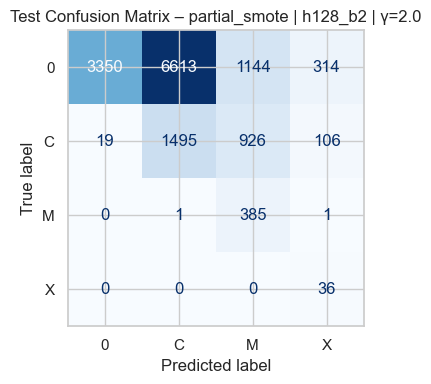

MODEL: h128_b2 | γ=2.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.393 | Test macro F1: 0.292
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.991     0.330     0.495     11421
           C      0.197     0.576     0.294      2546
           M      0.149     0.995     0.259       387
           X      0.064     1.000     0.121        36

    accuracy                          0.393     14390
   macro avg      0.350     0.725     0.292     14390
weighted avg      0.826     0.393     0.452     14390



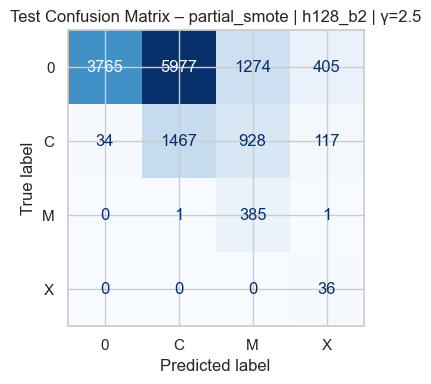

MODEL: h128_b2 | γ=3.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.374 | Test macro F1: 0.277
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.984     0.324     0.487     11421
           C      0.177     0.498     0.261      2546
           M      0.131     0.990     0.231       387
           X      0.068     1.000     0.128        36

    accuracy                          0.374     14390
   macro avg      0.340     0.703     0.277     14390
weighted avg      0.816     0.374     0.439     14390



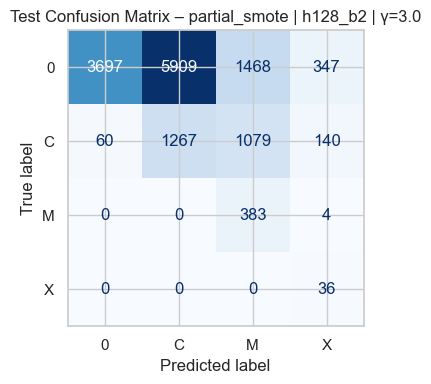

MODEL: h256_b2 | γ=1.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.464 | Test macro F1: 0.336
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.990     0.407     0.577     11421
           C      0.237     0.644     0.347      2546
           M      0.152     0.938     0.262       387
           X      0.085     0.972     0.157        36

    accuracy                          0.464     14390
   macro avg      0.366     0.740     0.336     14390
weighted avg      0.832     0.464     0.527     14390



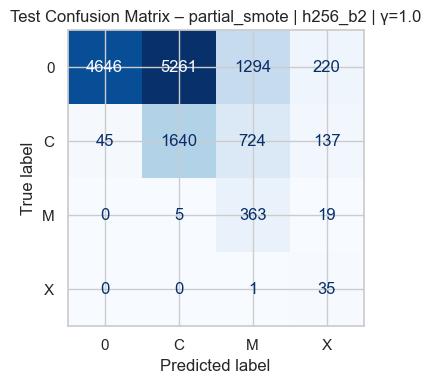

MODEL: h256_b2 | γ=1.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.422 | Test macro F1: 0.308
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.996     0.346     0.513     11421
           C      0.232     0.670     0.345      2546
           M      0.169     0.995     0.289       387
           X      0.044     1.000     0.085        36

    accuracy                          0.422     14390
   macro avg      0.361     0.753     0.308     14390
weighted avg      0.836     0.422     0.476     14390



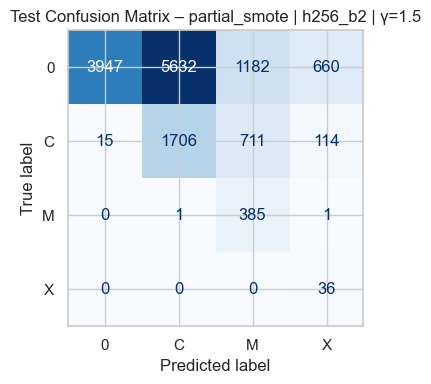

MODEL: h256_b2 | γ=2.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.419 | Test macro F1: 0.318
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.994     0.353     0.521     11421
           C      0.209     0.620     0.313      2546
           M      0.157     0.974     0.270       387
           X      0.091     0.972     0.166        36

    accuracy                          0.419     14390
   macro avg      0.363     0.730     0.318     14390
weighted avg      0.830     0.419     0.477     14390



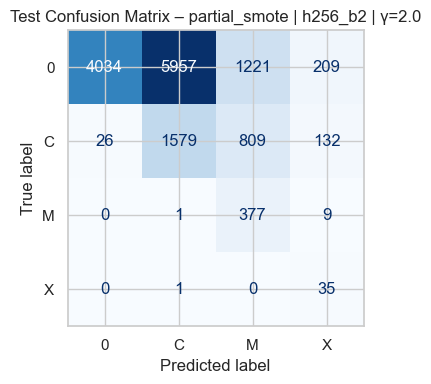

MODEL: h256_b2 | γ=2.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.381 | Test macro F1: 0.282
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.995     0.330     0.496     11421
           C      0.180     0.510     0.266      2546
           M      0.129     0.966     0.227       387
           X      0.074     1.000     0.137        36

    accuracy                          0.381     14390
   macro avg      0.344     0.702     0.282     14390
weighted avg      0.825     0.381     0.447     14390



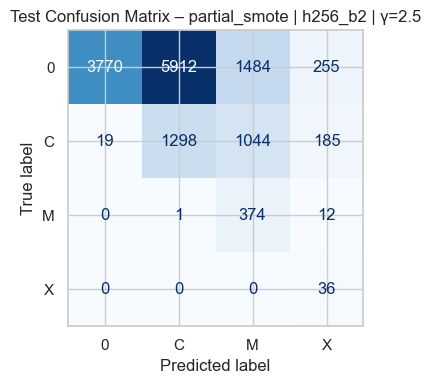

MODEL: h256_b2 | γ=3.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.371 | Test macro F1: 0.281
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.990     0.303     0.464     11421
           C      0.189     0.586     0.286      2546
           M      0.146     0.925     0.253       387
           X      0.065     1.000     0.123        36

    accuracy                          0.371     14390
   macro avg      0.348     0.703     0.281     14390
weighted avg      0.823     0.371     0.426     14390



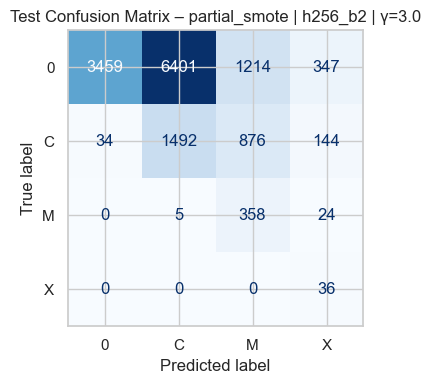

MODEL: h256_b3 | γ=1.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.441 | Test macro F1: 0.329
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.379     0.549     11421
           C      0.220     0.630     0.326      2546
           M      0.160     0.977     0.275       387
           X      0.090     0.972     0.165        36

    accuracy                          0.441     14390
   macro avg      0.367     0.739     0.329     14390
weighted avg      0.835     0.441     0.501     14390



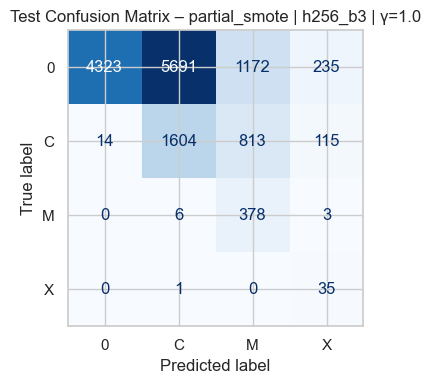

MODEL: h256_b3 | γ=1.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.343 | Test macro F1: 0.252
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.991     0.293     0.452     11421
           C      0.167     0.461     0.245      2546
           M      0.111     0.964     0.199       387
           X      0.060     1.000     0.113        36

    accuracy                          0.343     14390
   macro avg      0.332     0.679     0.252     14390
weighted avg      0.819     0.343     0.408     14390



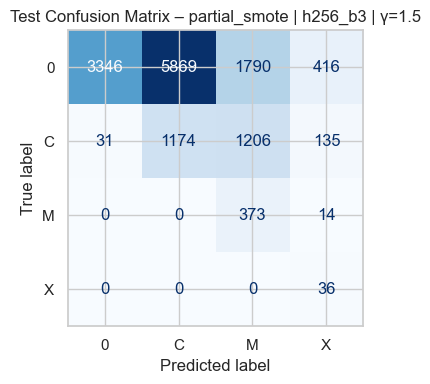

MODEL: h256_b3 | γ=2.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.377 | Test macro F1: 0.300
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.996     0.297     0.458     11421
           C      0.201     0.639     0.306      2546
           M      0.147     0.959     0.255       387
           X      0.100     0.972     0.181        36

    accuracy                          0.377     14390
   macro avg      0.361     0.717     0.300     14390
weighted avg      0.830     0.377     0.425     14390



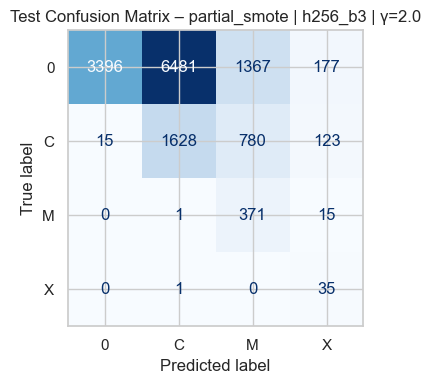

MODEL: h256_b3 | γ=2.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.375 | Test macro F1: 0.288
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.990     0.307     0.469     11421
           C      0.187     0.590     0.284      2546
           M      0.149     0.910     0.256       387
           X      0.077     0.944     0.143        36

    accuracy                          0.375     14390
   macro avg      0.351     0.688     0.288     14390
weighted avg      0.823     0.375     0.429     14390



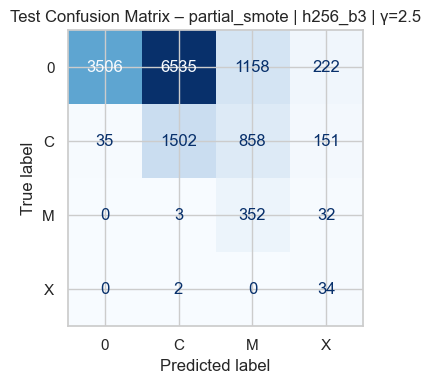

MODEL: h256_b3 | γ=3.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.298 | Test macro F1: 0.224
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.256     0.407     11421
           C      0.134     0.377     0.198      2546
           M      0.100     0.953     0.181       387
           X      0.057     0.972     0.107        36

    accuracy                          0.298     14390
   macro avg      0.321     0.640     0.224     14390
weighted avg      0.814     0.298     0.364     14390



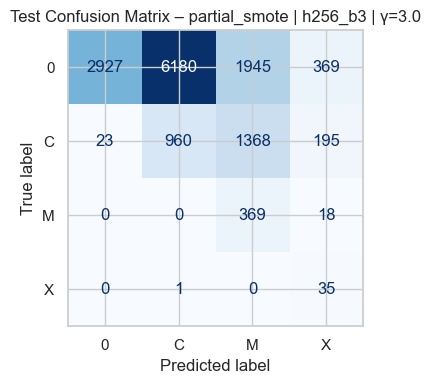

MODEL: h512_b3 | γ=1.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.414 | Test macro F1: 0.291
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.370     0.539     11421
           C      0.199     0.521     0.288      2546
           M      0.131     0.964     0.231       387
           X      0.057     0.972     0.107        36

    accuracy                          0.414     14390
   macro avg      0.345     0.707     0.291     14390
weighted avg      0.826     0.414     0.485     14390



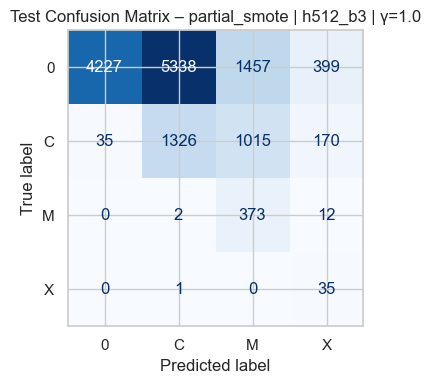

MODEL: h512_b3 | γ=1.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.464 | Test macro F1: 0.337
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.991     0.404     0.574     11421
           C      0.234     0.647     0.344      2546
           M      0.168     0.969     0.287       387
           X      0.077     1.000     0.144        36

    accuracy                          0.464     14390
   macro avg      0.368     0.755     0.337     14390
weighted avg      0.833     0.464     0.525     14390



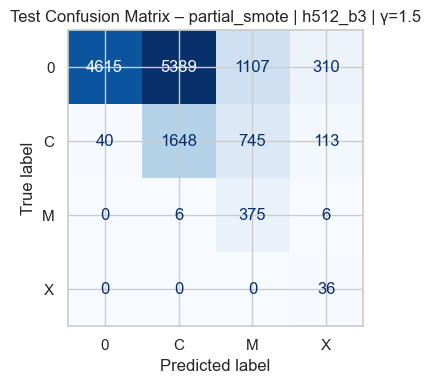

MODEL: h512_b3 | γ=2.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.389 | Test macro F1: 0.281
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.994     0.329     0.495     11421
           C      0.197     0.570     0.292      2546
           M      0.138     0.910     0.240       387
           X      0.051     0.972     0.097        36

    accuracy                          0.389     14390
   macro avg      0.345     0.695     0.281     14390
weighted avg      0.828     0.389     0.451     14390



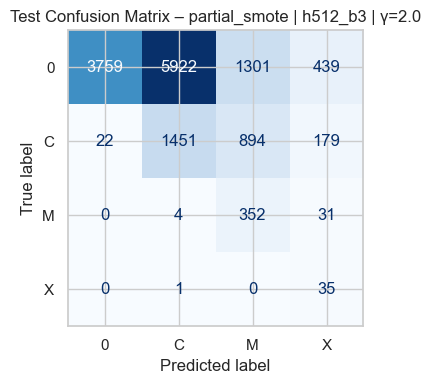

MODEL: h512_b3 | γ=2.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.364 | Test macro F1: 0.264
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.993     0.314     0.477     11421
           C      0.177     0.496     0.261      2546
           M      0.116     0.910     0.206       387
           X      0.059     0.972     0.112        36

    accuracy                          0.364     14390
   macro avg      0.336     0.673     0.264     14390
weighted avg      0.823     0.364     0.430     14390



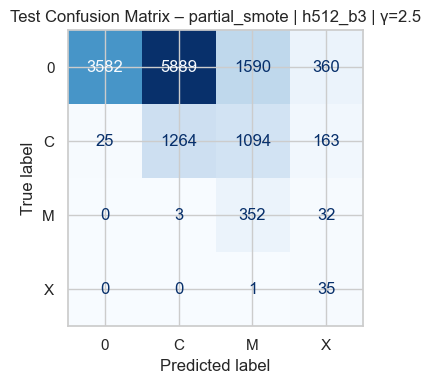

MODEL: h512_b3 | γ=3.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.352 | Test macro F1: 0.276
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.996     0.279     0.436     11421
           C      0.179     0.584     0.274      2546
           M      0.148     0.922     0.255       387
           X      0.075     1.000     0.140        36

    accuracy                          0.352     14390
   macro avg      0.350     0.696     0.276     14390
weighted avg      0.826     0.352     0.402     14390



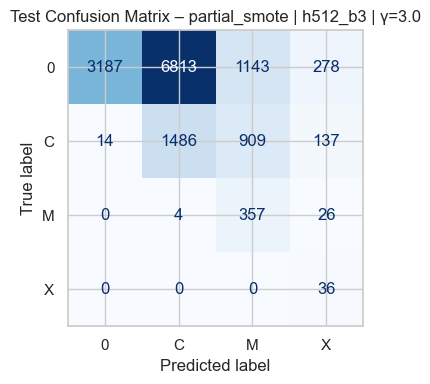

MODEL: h512_b4 | γ=1.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.419 | Test macro F1: 0.297
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.996     0.363     0.532     11421
           C      0.214     0.589     0.314      2546
           M      0.136     0.910     0.237       387
           X      0.056     1.000     0.106        36

    accuracy                          0.419     14390
   macro avg      0.350     0.715     0.297     14390
weighted avg      0.832     0.419     0.484     14390



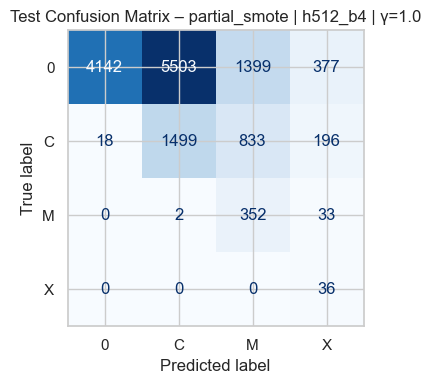

MODEL: h512_b4 | γ=1.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.402 | Test macro F1: 0.311
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.998     0.330     0.496     11421
           C      0.209     0.632     0.315      2546
           M      0.143     0.948     0.248       387
           X      0.103     1.000     0.187        36

    accuracy                          0.402     14390
   macro avg      0.363     0.728     0.311     14390
weighted avg      0.833     0.402     0.457     14390



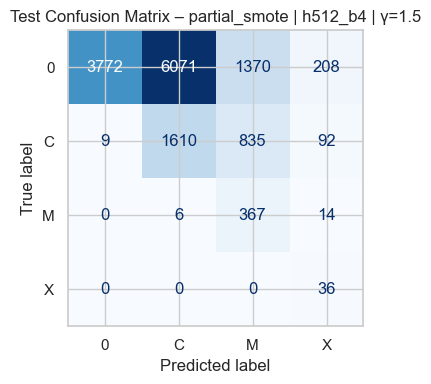

MODEL: h512_b4 | γ=2.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.381 | Test macro F1: 0.298
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.995     0.309     0.471     11421
           C      0.194     0.606     0.294      2546
           M      0.151     0.990     0.263       387
           X      0.089     0.944     0.162        36

    accuracy                          0.381     14390
   macro avg      0.357     0.712     0.298     14390
weighted avg      0.828     0.381     0.433     14390



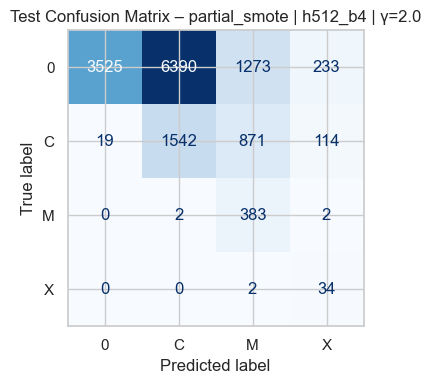

MODEL: h512_b4 | γ=2.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.380 | Test macro F1: 0.289
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.990     0.311     0.473     11421
           C      0.192     0.596     0.291      2546
           M      0.156     0.959     0.268       387
           X      0.066     0.972     0.124        36

    accuracy                          0.380     14390
   macro avg      0.351     0.709     0.289     14390
weighted avg      0.824     0.380     0.434     14390



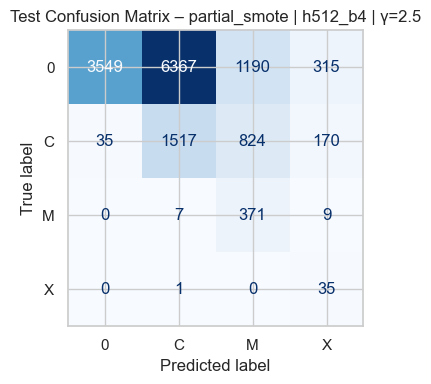

MODEL: h512_b4 | γ=3.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.260 | Test macro F1: 0.197
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.200     0.333     11421
           C      0.148     0.414     0.218      2546
           M      0.103     0.964     0.187       387
           X      0.026     1.000     0.051        36

    accuracy                          0.260     14390
   macro avg      0.319     0.644     0.197     14390
weighted avg      0.820     0.260     0.308     14390



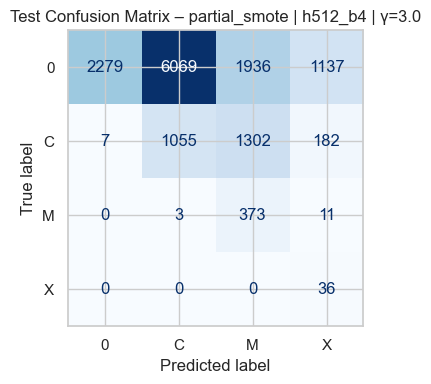


################################################################################
SMOTE variant: controlled_smote
################################################################################
MODEL: h128_b2 | γ=1.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.512 | Test macro F1: 0.384
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.987     0.463     0.631     11421
           C      0.247     0.649     0.358      2546
           M      0.186     0.992     0.314       387
           X      0.132     1.000     0.234        36

    accuracy                          0.512     14390
   macro avg      0.388     0.776     0.384     14390
weighted avg      0.832     0.512     0.573     14390



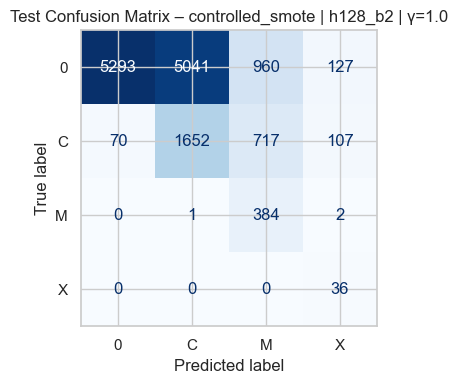

MODEL: h128_b2 | γ=1.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.510 | Test macro F1: 0.362
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.985     0.467     0.634     11421
           C      0.250     0.620     0.356      2546
           M      0.169     0.987     0.288       387
           X      0.092     1.000     0.168        36

    accuracy                          0.510     14390
   macro avg      0.374     0.769     0.362     14390
weighted avg      0.831     0.510     0.574     14390



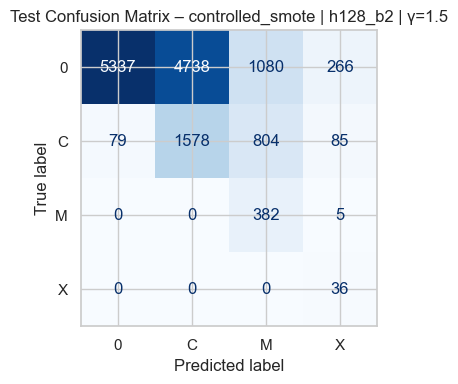

MODEL: h128_b2 | γ=2.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.476 | Test macro F1: 0.355
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.986     0.425     0.594     11421
           C      0.231     0.619     0.336      2546
           M      0.164     0.990     0.282       387
           X      0.116     1.000     0.208        36

    accuracy                          0.476     14390
   macro avg      0.374     0.758     0.355     14390
weighted avg      0.828     0.476     0.539     14390



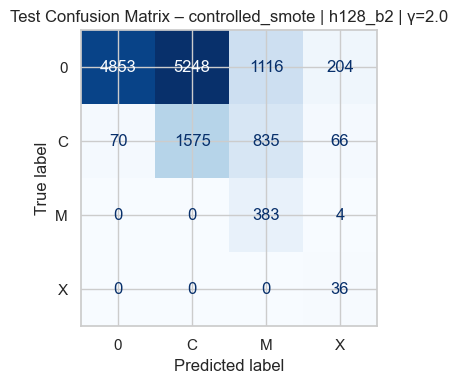

MODEL: h128_b2 | γ=2.5 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.481 | Test macro F1: 0.356
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.978     0.441     0.608     11421
           C      0.218     0.574     0.316      2546
           M      0.173     0.992     0.294       387
           X      0.114     1.000     0.205        36

    accuracy                          0.481     14390
   macro avg      0.371     0.752     0.356     14390
weighted avg      0.820     0.481     0.547     14390



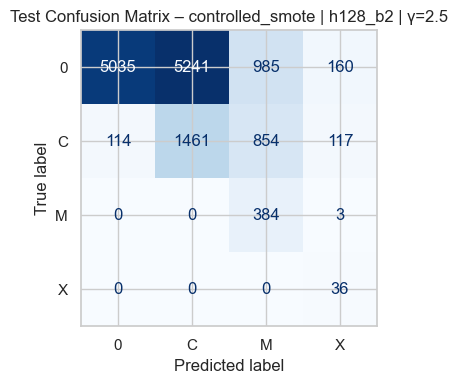

MODEL: h128_b2 | γ=3.0 | hidden=128 | blocks=2
Params: 70532
Test acc: 0.433 | Test macro F1: 0.335
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.984     0.383     0.551     11421
           C      0.196     0.562     0.290      2546
           M      0.165     0.992     0.282       387
           X      0.122     1.000     0.218        36

    accuracy                          0.433     14390
   macro avg      0.367     0.734     0.335     14390
weighted avg      0.820     0.433     0.497     14390



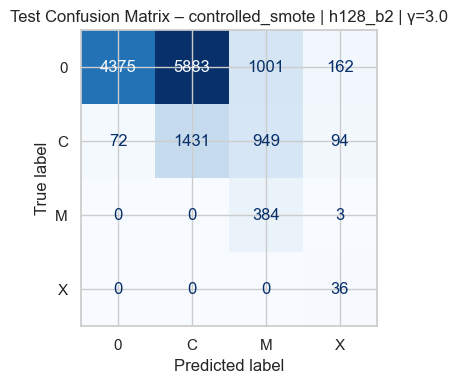

MODEL: h256_b2 | γ=1.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.593 | Test macro F1: 0.437
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.995     0.550     0.709     11421
           C      0.299     0.723     0.423      2546
           M      0.223     0.969     0.363       387
           X      0.145     1.000     0.253        36

    accuracy                          0.593     14390
   macro avg      0.416     0.810     0.437     14390
weighted avg      0.849     0.593     0.648     14390



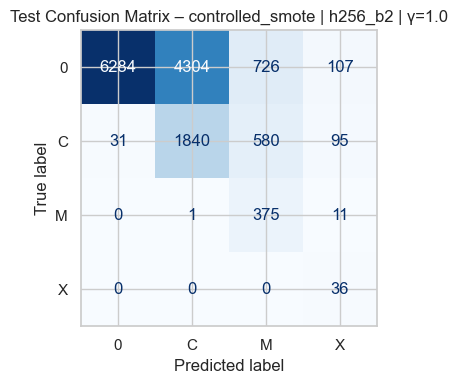

MODEL: h256_b2 | γ=1.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.542 | Test macro F1: 0.385
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.984     0.503     0.666     11421
           C      0.267     0.644     0.378      2546
           M      0.184     0.982     0.310       387
           X      0.102     1.000     0.185        36

    accuracy                          0.542     14390
   macro avg      0.384     0.782     0.385     14390
weighted avg      0.834     0.542     0.604     14390



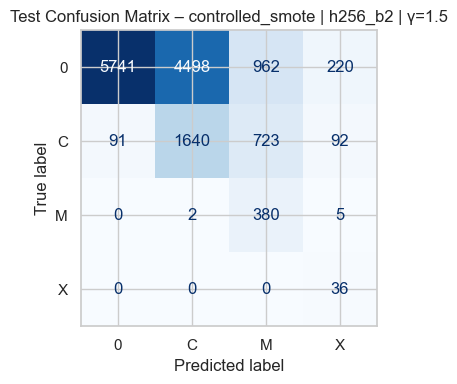

MODEL: h256_b2 | γ=2.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.517 | Test macro F1: 0.370
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.989     0.462     0.630     11421
           C      0.258     0.687     0.375      2546
           M      0.205     0.959     0.338       387
           X      0.073     0.972     0.136        36

    accuracy                          0.517     14390
   macro avg      0.381     0.770     0.370     14390
weighted avg      0.836     0.517     0.576     14390



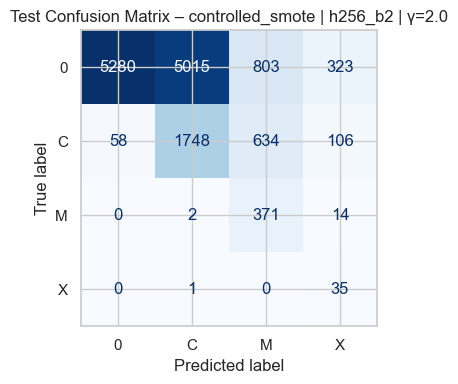

MODEL: h256_b2 | γ=2.5 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.559 | Test macro F1: 0.416
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.987     0.512     0.674     11421
           C      0.276     0.700     0.396      2546
           M      0.218     0.992     0.358       387
           X      0.133     0.972     0.234        36

    accuracy                          0.559     14390
   macro avg      0.404     0.794     0.416     14390
weighted avg      0.839     0.559     0.615     14390



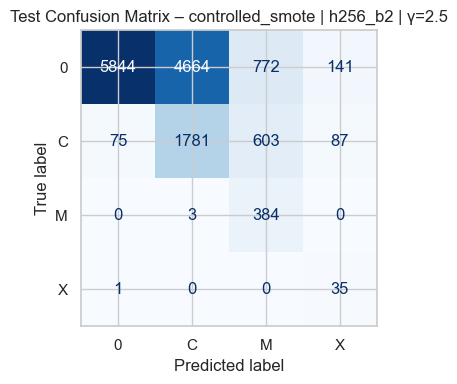

MODEL: h256_b2 | γ=3.0 | hidden=256 | blocks=2
Params: 272132
Test acc: 0.496 | Test macro F1: 0.361
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.986     0.442     0.610     11421
           C      0.239     0.661     0.351      2546
           M      0.211     0.946     0.345       387
           X      0.076     1.000     0.141        36

    accuracy                          0.496     14390
   macro avg      0.378     0.762     0.361     14390
weighted avg      0.831     0.496     0.556     14390



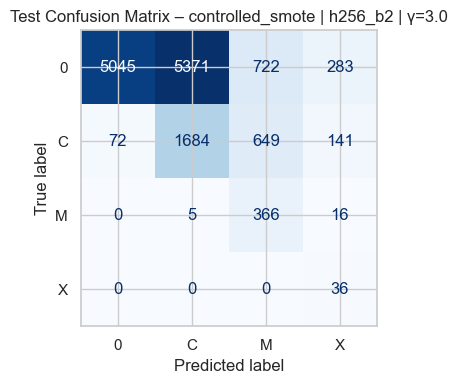

MODEL: h256_b3 | γ=1.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.547 | Test macro F1: 0.414
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.997     0.483     0.650     11421
           C      0.282     0.763     0.412      2546
           M      0.227     0.997     0.370       387
           X      0.125     0.972     0.222        36

    accuracy                          0.547     14390
   macro avg      0.408     0.804     0.414     14390
weighted avg      0.848     0.547     0.600     14390



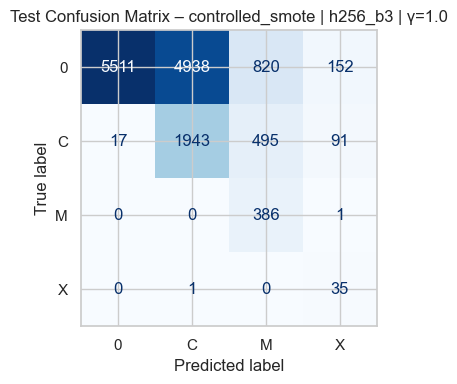

MODEL: h256_b3 | γ=1.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.527 | Test macro F1: 0.380
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.990     0.479     0.646     11421
           C      0.259     0.664     0.373      2546
           M      0.198     0.997     0.331       387
           X      0.093     1.000     0.169        36

    accuracy                          0.527     14390
   macro avg      0.385     0.785     0.380     14390
weighted avg      0.837     0.527     0.588     14390



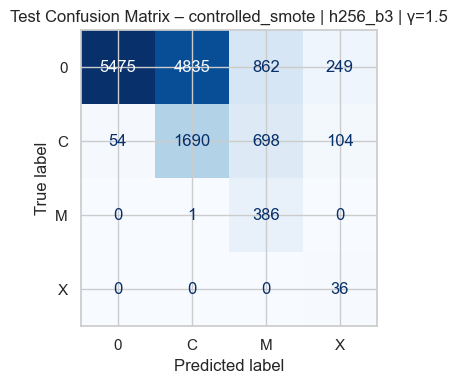

MODEL: h256_b3 | γ=2.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.512 | Test macro F1: 0.372
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.988     0.457     0.625     11421
           C      0.255     0.679     0.370      2546
           M      0.200     0.984     0.332       387
           X      0.087     1.000     0.160        36

    accuracy                          0.512     14390
   macro avg      0.382     0.780     0.372     14390
weighted avg      0.835     0.512     0.571     14390



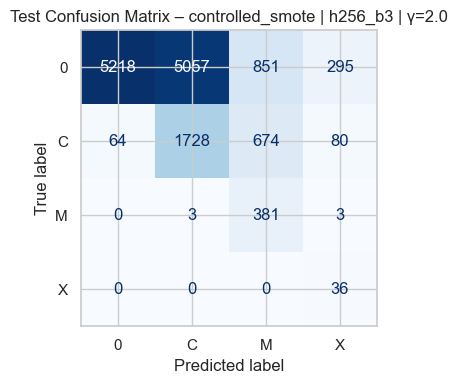

MODEL: h256_b3 | γ=2.5 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.455 | Test macro F1: 0.345
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.984     0.399     0.567     11421
           C      0.219     0.620     0.324      2546
           M      0.173     0.990     0.294       387
           X      0.107     1.000     0.194        36

    accuracy                          0.455     14390
   macro avg      0.371     0.752     0.345     14390
weighted avg      0.824     0.455     0.516     14390



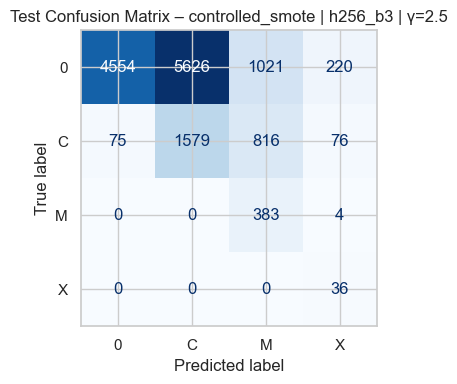

MODEL: h256_b3 | γ=3.0 | hidden=256 | blocks=3
Params: 404740
Test acc: 0.520 | Test macro F1: 0.378
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.980     0.473     0.638     11421
           C      0.250     0.657     0.362      2546
           M      0.208     0.969     0.343       387
           X      0.091     1.000     0.167        36

    accuracy                          0.520     14390
   macro avg      0.382     0.775     0.378     14390
weighted avg      0.828     0.520     0.580     14390



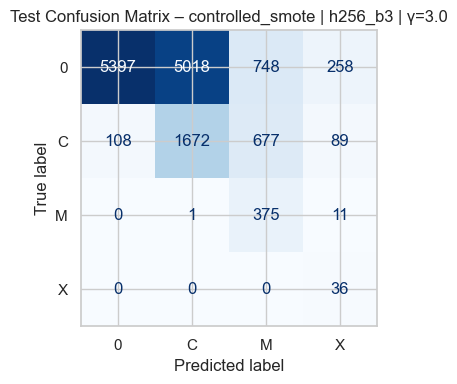

MODEL: h512_b3 | γ=1.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.605 | Test macro F1: 0.447
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.564     0.719     11421
           C      0.313     0.726     0.437      2546
           M      0.218     0.990     0.357       387
           X      0.160     1.000     0.276        36

    accuracy                          0.605     14390
   macro avg      0.421     0.820     0.447     14390
weighted avg      0.849     0.605     0.659     14390



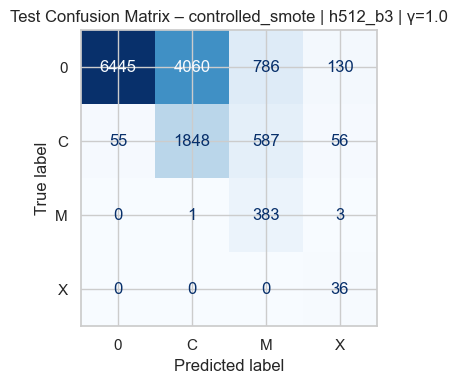

MODEL: h512_b3 | γ=1.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.581 | Test macro F1: 0.434
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.994     0.530     0.691     11421
           C      0.297     0.747     0.425      2546
           M      0.233     0.987     0.377       387
           X      0.140     1.000     0.245        36

    accuracy                          0.581     14390
   macro avg      0.416     0.816     0.434     14390
weighted avg      0.848     0.581     0.634     14390



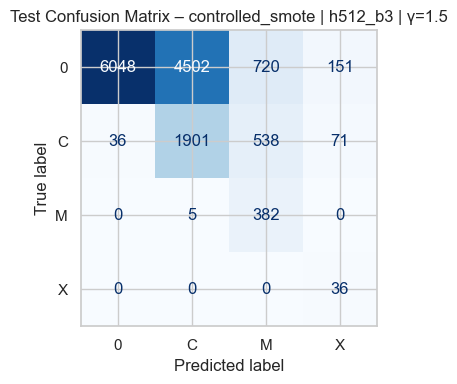

MODEL: h512_b3 | γ=2.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.538 | Test macro F1: 0.382
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.991     0.480     0.647     11421
           C      0.284     0.726     0.409      2546
           M      0.208     0.990     0.343       387
           X      0.070     1.000     0.130        36

    accuracy                          0.538     14390
   macro avg      0.388     0.799     0.382     14390
weighted avg      0.843     0.538     0.595     14390



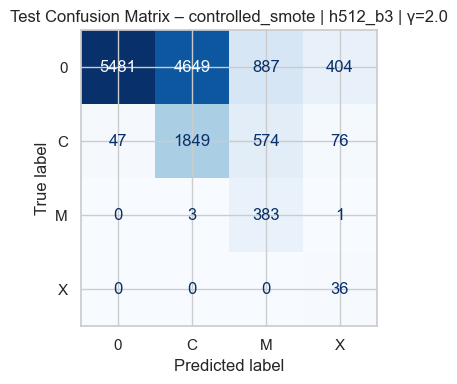

MODEL: h512_b3 | γ=2.5 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.488 | Test macro F1: 0.357
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.992     0.423     0.593     11421
           C      0.247     0.700     0.365      2546
           M      0.215     0.961     0.351       387
           X      0.064     1.000     0.121        36

    accuracy                          0.488     14390
   macro avg      0.379     0.771     0.357     14390
weighted avg      0.837     0.488     0.545     14390



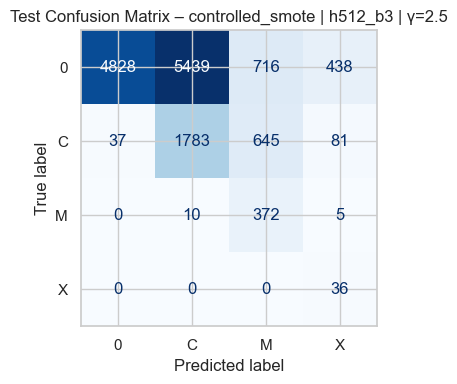

MODEL: h512_b3 | γ=3.0 | hidden=512 | blocks=3
Params: 1595908
Test acc: 0.505 | Test macro F1: 0.386
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.988     0.445     0.613     11421
           C      0.247     0.698     0.364      2546
           M      0.211     0.953     0.345       387
           X      0.125     1.000     0.222        36

    accuracy                          0.505     14390
   macro avg      0.392     0.774     0.386     14390
weighted avg      0.833     0.505     0.561     14390



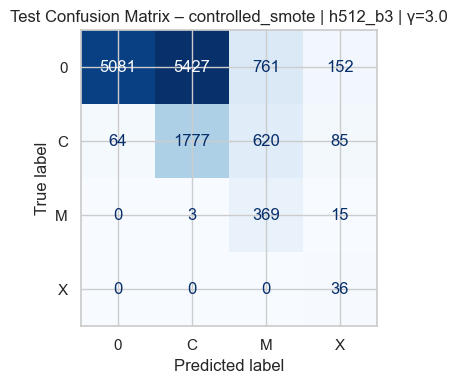

MODEL: h512_b4 | γ=1.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.585 | Test macro F1: 0.414
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.993     0.543     0.702     11421
           C      0.306     0.709     0.428      2546
           M      0.191     0.959     0.318       387
           X      0.116     0.972     0.208        36

    accuracy                          0.585     14390
   macro avg      0.401     0.796     0.414     14390
weighted avg      0.847     0.585     0.642     14390



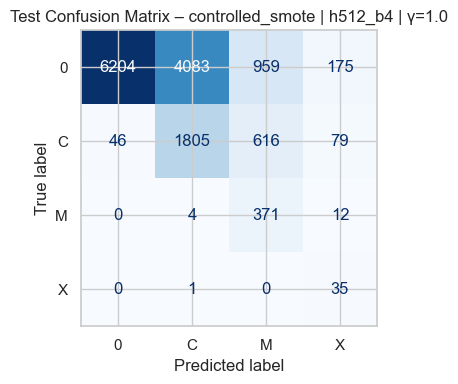

MODEL: h512_b4 | γ=1.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.510 | Test macro F1: 0.377
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.993     0.438     0.608     11421
           C      0.268     0.754     0.395      2546
           M      0.254     0.977     0.403       387
           X      0.053     1.000     0.100        36

    accuracy                          0.510     14390
   macro avg      0.392     0.792     0.377     14390
weighted avg      0.842     0.510     0.564     14390



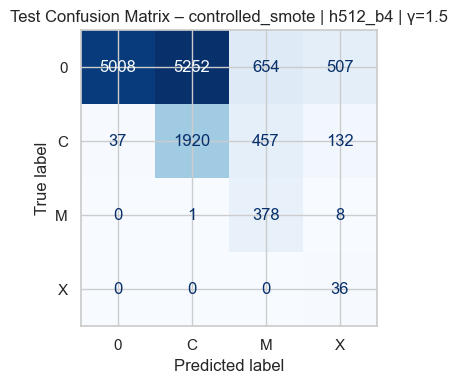

MODEL: h512_b4 | γ=2.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.522 | Test macro F1: 0.391
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.991     0.461     0.629     11421
           C      0.261     0.718     0.383      2546
           M      0.216     0.966     0.352       387
           X      0.110     1.000     0.198        36

    accuracy                          0.522     14390
   macro avg      0.394     0.786     0.391     14390
weighted avg      0.839     0.522     0.577     14390



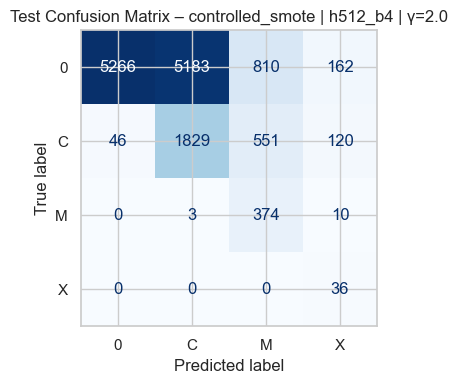

MODEL: h512_b4 | γ=2.5 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.499 | Test macro F1: 0.376
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.989     0.451     0.620     11421
           C      0.236     0.636     0.345      2546
           M      0.181     0.966     0.306       387
           X      0.132     0.972     0.233        36

    accuracy                          0.499     14390
   macro avg      0.385     0.757     0.376     14390
weighted avg      0.832     0.499     0.562     14390



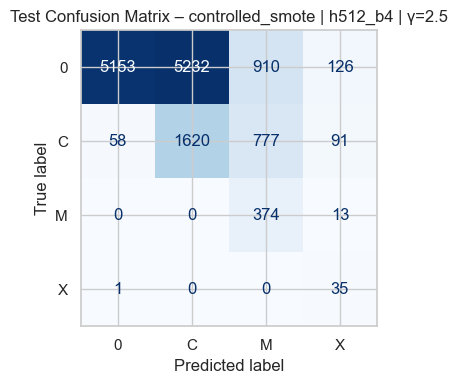

MODEL: h512_b4 | γ=3.0 | hidden=512 | blocks=4
Params: 2123268
Test acc: 0.502 | Test macro F1: 0.375
--------------------------------------------------------------------------------
Classification report (test):
              precision    recall  f1-score   support

           0      0.981     0.437     0.604     11421
           C      0.252     0.713     0.372      2546
           M      0.230     0.977     0.372       387
           X      0.081     1.000     0.150        36

    accuracy                          0.502     14390
   macro avg      0.386     0.782     0.375     14390
weighted avg      0.830     0.502     0.556     14390



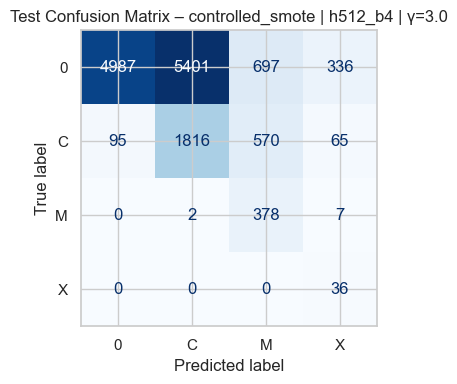

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

label_names = ["0", "C", "M", "X"]
labels = [0, 1, 2, 3]

for variant_name, runs in res_smote_focal_gamma_results.items():
    print("\n" + "#" * 80)
    print(f"SMOTE variant: {variant_name}")
    print("#" * 80)

    for res in runs:
        name       = res["config_name"]
        gamma      = res["gamma"]
        hidden_dim = res["hidden_dim"]
        num_blocks = res["num_blocks"]
        num_params = res["num_params"]

        y_true = res["y_test_true"]
        y_pred = res["y_test_pred"]
        m      = res["metrics"]

        print("=" * 80)
        print(f"MODEL: {name} | γ={gamma} | hidden={hidden_dim} | blocks={num_blocks}")
        print(f"Params: {num_params}")
        print(f"Test acc: {m['test_acc']:.3f} | Test macro F1: {m['test_macro_f1']:.3f}")
        print("-" * 80)
        print("Classification report (test):")
        print(classification_report(y_true, y_pred, target_names=label_names, digits=3))

        cm = confusion_matrix(y_true, y_pred, labels=labels)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)

        fig, ax = plt.subplots(figsize=(4, 4))
        disp.plot(ax=ax, cmap="Blues", values_format="d", colorbar=False)
        ax.set_title(f"Test Confusion Matrix – {variant_name} | {name} | γ={gamma}")
        plt.tight_layout()
        plt.show()


In [ ]:
# sort by test macro F1
res_top7 = sorted(
    res_all_results,
    key=lambda x: x["test_macro_f1"],
    reverse=True
)[:7]

print("\nTop 7 ResMLP models by test macro F1:")
for i, r in enumerate(res_top7, 1):
    print(
        f"ResModel {i}: variant={r['variant']}, config={r['config_name']}, γ={r['gamma']}, "
        f"params={r['num_params']} | "
        f"Acc={r['test_accuracy']:.4f}, "
        f"P={r['test_precision']:.4f}, "
        f"R={r['test_recall']:.4f}, "
        f"F1={r['test_macro_f1']:.4f}"
    )



Top 7 ResMLP models by test macro F1:
ResModel 1: variant=no_smote, config=h256_b2, γ=1.0, params=272132 | Acc=0.7903, P=0.5495, R=0.8932, F1=0.6236
ResModel 2: variant=no_smote, config=h512_b4, γ=1.0, params=2123268 | Acc=0.7682, P=0.5357, R=0.8920, F1=0.6134
ResModel 3: variant=no_smote, config=h256_b3, γ=1.0, params=404740 | Acc=0.7748, P=0.5369, R=0.8889, F1=0.6091
ResModel 4: variant=no_smote, config=h256_b2, γ=2.0, params=272132 | Acc=0.7622, P=0.5288, R=0.8872, F1=0.5949
ResModel 5: variant=no_smote, config=h256_b2, γ=1.5, params=272132 | Acc=0.7553, P=0.5083, R=0.8766, F1=0.5840
ResModel 6: variant=no_smote, config=h256_b3, γ=1.5, params=404740 | Acc=0.7507, P=0.5078, R=0.8680, F1=0.5829
ResModel 7: variant=no_smote, config=h256_b3, γ=2.0, params=404740 | Acc=0.7352, P=0.5067, R=0.8710, F1=0.5778


In [ ]:
import pandas as pd

# labels and data for plotting
res_models_labels = []   # e.g. "ResModel 1\n(no_smote, h256_b3, γ=2.0)"
res_performance_data = {}

for i, r in enumerate(res_top7, 1):
    model_id = f"ResModel {i}"
    pretty_label = f"{model_id}\n({r['variant']}, {r['config_name']}, γ={r['gamma']})"
    res_models_labels.append(pretty_label)

    res_performance_data[model_id] = {
        "Precision": r["test_precision"],
        "Recall":    r["test_recall"],
        "F1-Score":  r["test_macro_f1"],
        "Accuracy":  r["test_accuracy"],
    }

# DataFrame indexed by ResModel 1..7
res_df = pd.DataFrame(res_performance_data).T
display(res_df)


,Precision,Recall,F1-Score,Accuracy
ResModel 1,0.549513,0.893196,0.623632,0.790341
ResModel 2,0.535716,0.892046,0.613432,0.768242
ResModel 3,0.536864,0.888876,0.609140,0.774844
ResModel 4,0.528767,0.887214,0.594948,0.762196
ResModel 5,0.508313,0.876591,0.584010,0.755316
ResModel 6,0.507847,0.868036,0.582898,0.750660
ResModel 7,0.506661,0.870987,0.577798,0.735233


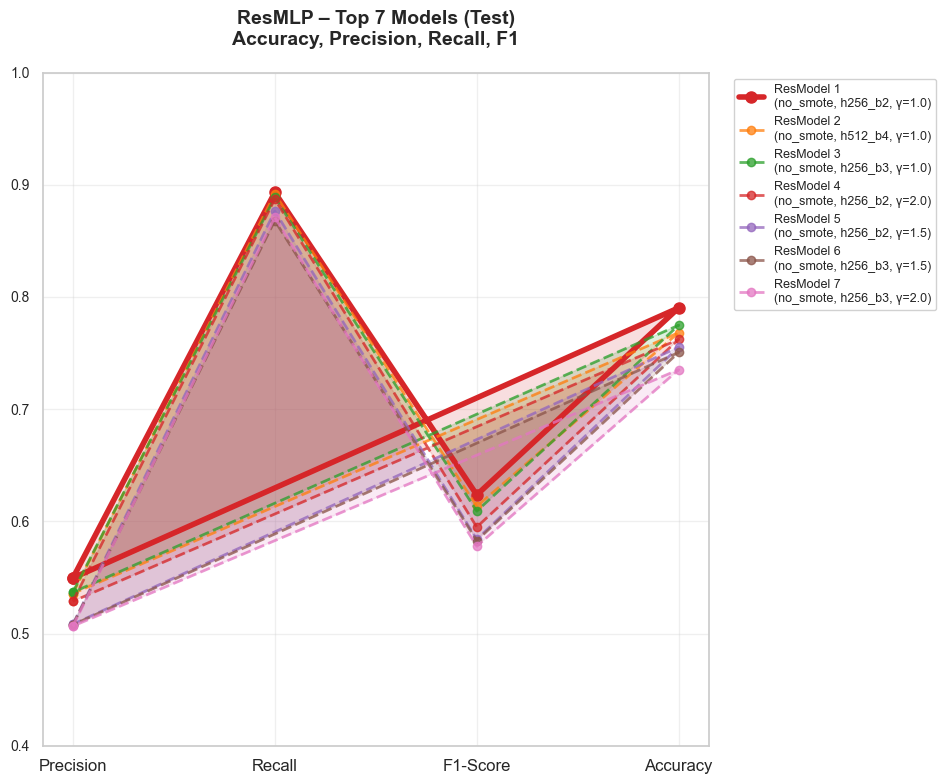

C:\Users\admin\AppData\Local\Temp\ipykernel_3840\964699531.py:75: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(res_models_labels, rotation=45, ha="right")


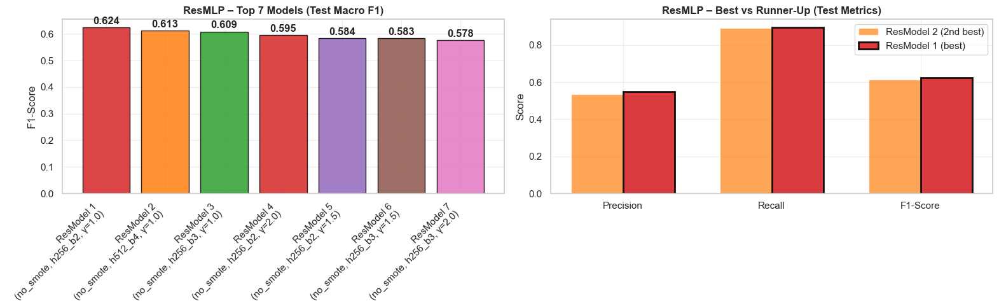

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# ---------- RADAR CHART ----------

categories = ["Precision", "Recall", "F1-Score", "Accuracy"]
N = len(categories)

angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(10, 8))

n_models = len(res_models_labels)

# color palette – best model will be red
base_colors = sns.color_palette("tab10", n_colors=n_models)
# force first color (best) to red-like
base_colors = [(0.84, 0.15, 0.16)] + list(base_colors[1:])

model_colors      = base_colors
model_linewidths  = [4] + [2]*(n_models-1)
model_linestyles  = ["-"] + ["--"]*(n_models-1)
model_alphas      = [1.0] + [0.75]*(n_models-1)
model_markersize  = [8] + [6]*(n_models-1)

for i, label in enumerate(res_models_labels):
    model_id = label.split("\n")[0]  # "ResModel 1"
    values = res_df.loc[model_id, categories].values.flatten().tolist()
    values += values[:1]

    plt.plot(
        angles, values,
        marker="o",
        linewidth=model_linewidths[i],
        linestyle=model_linestyles[i],
        color=model_colors[i],
        alpha=model_alphas[i],
        label=label,
        markersize=model_markersize[i],
    )
    plt.fill(angles, values, color=model_colors[i], alpha=0.15)

plt.xticks(angles[:-1], categories, fontsize=12)
plt.yticks(np.arange(0.4, 1.01, 0.1), fontsize=10)
plt.ylim(0.4, 1.0)
plt.title(
    "ResMLP – Top 7 Models (Test)\nAccuracy, Precision, Recall, F1",
    fontsize=14, fontweight="bold", pad=20
)
plt.legend(bbox_to_anchor=(1.35, 1.0), fontsize=9, framealpha=0.9)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ---------- BAR CHARTS ----------

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Left: F1 comparison for all 7 ResMLP models
f1_scores = [res_df.loc[f"ResModel {i+1}", "F1-Score"] for i in range(n_models)]

bars1 = ax1.bar(
    res_models_labels,
    f1_scores,
    color=model_colors,
    alpha=0.85,
    edgecolor="black",
    linewidth=1,
)

ax1.set_title("ResMLP – Top 7 Models (Test Macro F1)", fontweight="bold")
ax1.set_ylabel("F1-Score")
ax1.set_xticklabels(res_models_labels, rotation=45, ha="right")
ax1.grid(True, alpha=0.3)

for bar, score in zip(bars1, f1_scores):
    height = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width()/2.,
        height + 0.005,
        f"{score:.3f}",
        ha="center",
        va="bottom",
        fontweight="bold",
    )

# Right: best vs second-best on Precision / Recall / F1
metrics_compare = ["Precision", "Recall", "F1-Score"]

best_id   = "ResModel 1"
second_id = "ResModel 2"

best_scores   = [res_df.loc[best_id,   m] for m in metrics_compare]
second_scores = [res_df.loc[second_id, m] for m in metrics_compare]

x = np.arange(len(metrics_compare))
width = 0.35

ax2.bar(
    x - width/2, second_scores, width,
    label=f"{second_id} (2nd best)",
    color=model_colors[1],
    alpha=0.7,
)
ax2.bar(
    x + width/2, best_scores, width,
    label=f"{best_id} (best)",
    color=model_colors[0],
    alpha=0.9,
    edgecolor="black",
    linewidth=2,
)

ax2.set_title("ResMLP – Best vs Runner-Up (Test Metrics)", fontweight="bold")
ax2.set_ylabel("Score")
ax2.set_xticks(x)
ax2.set_xticklabels(metrics_compare)
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [132]:
import matplotlib.pyplot as plt

def plot_resmlp_focal_complexity_for_gamma(variant_name, results_list, gamma):
    subset = [r for r in results_list if abs(r["gamma"] - gamma) < 1e-8]
    if not subset:
        print(f"No runs for {variant_name} with gamma={gamma}")
        return

    subset = sorted(subset, key=lambda r: r["num_params"])

    complexities = [r["num_params"] for r in subset]
    train_loss   = [r["history"]["train_loss"][-1] for r in subset]
    val_loss     = [r["history"]["val_loss"][-1]   for r in subset]
    train_f1     = [r["history"]["train_macro_f1"][-1] for r in subset]
    val_f1       = [r["history"]["val_macro_f1"][-1]   for r in subset]

    # Loss vs complexity
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_loss, marker="o", label="Train loss")
    plt.plot(complexities, val_loss,   marker="o", label="Val loss")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Loss")
    plt.title(f"ResMLP + {variant_name} – loss vs complexity (γ={gamma})")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # F1 vs complexity
    plt.figure(figsize=(7,5))
    plt.plot(complexities, train_f1, marker="o", label="Train macro F1")
    plt.plot(complexities, val_f1,   marker="o", label="Val macro F1")
    plt.xlabel("Model complexity (num parameters)")
    plt.ylabel("Macro F1")
    plt.title(f"ResMLP + {variant_name} – F1 vs complexity (γ={gamma})")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


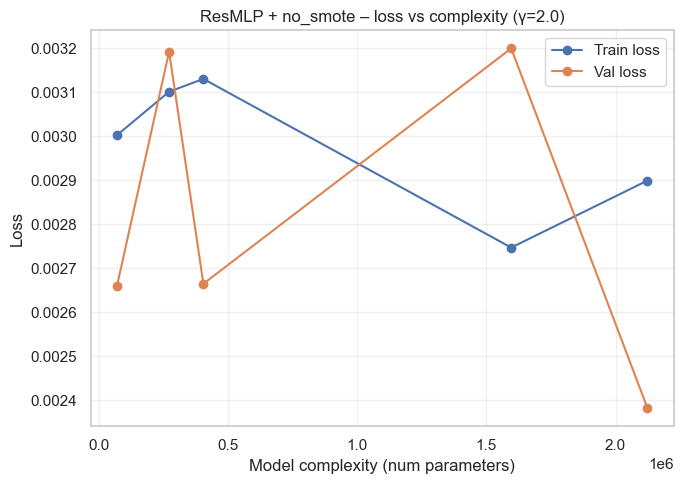

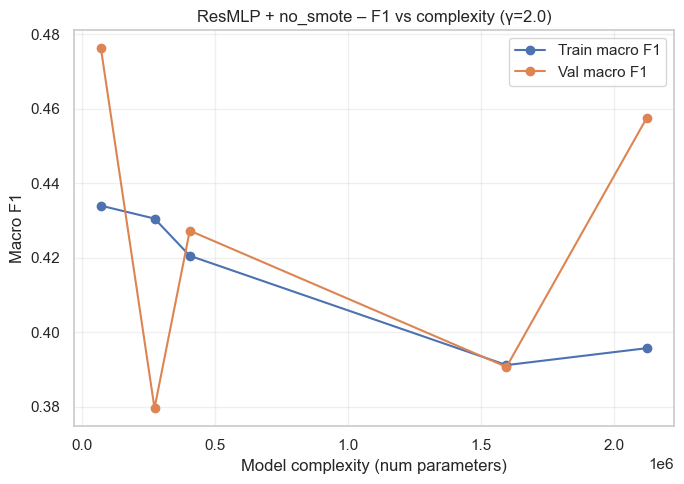

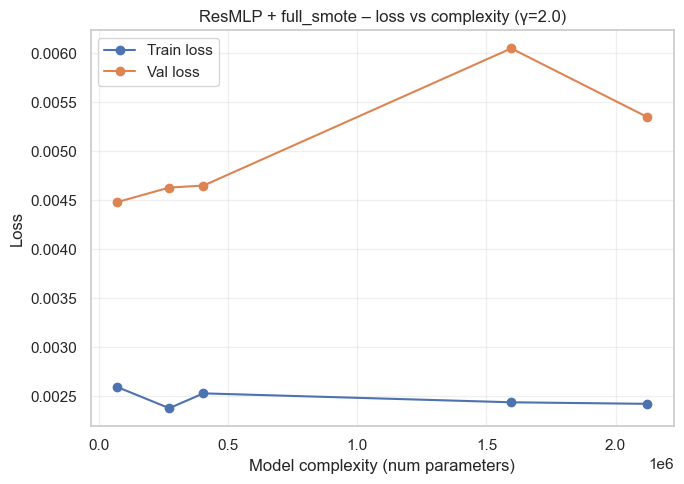

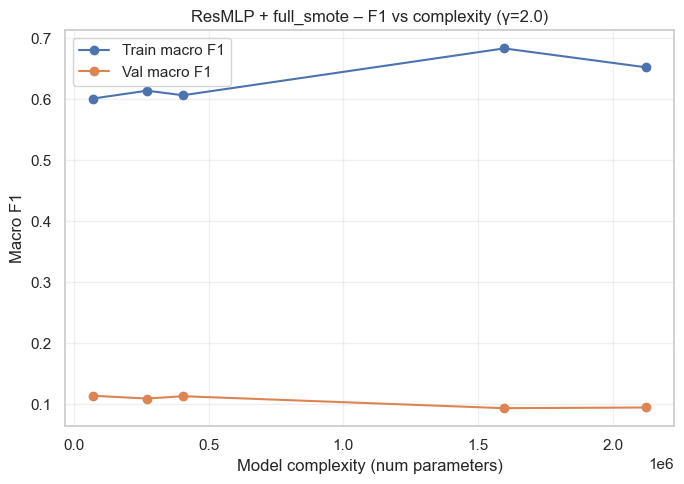

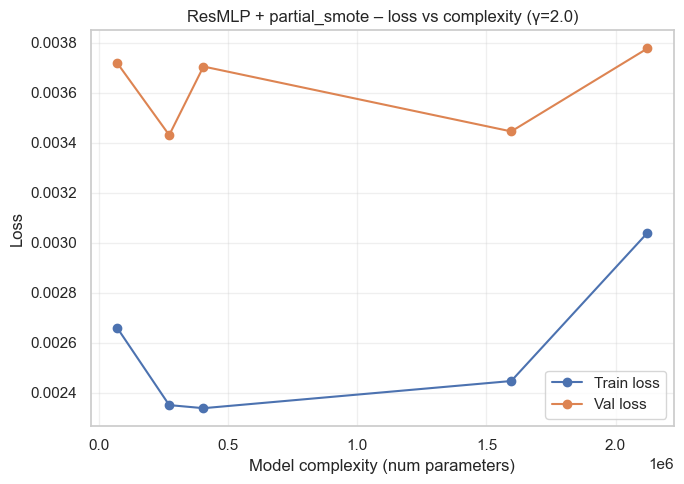

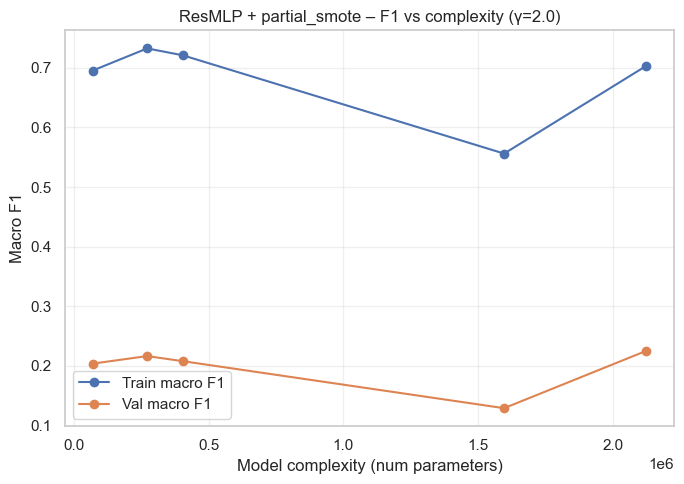

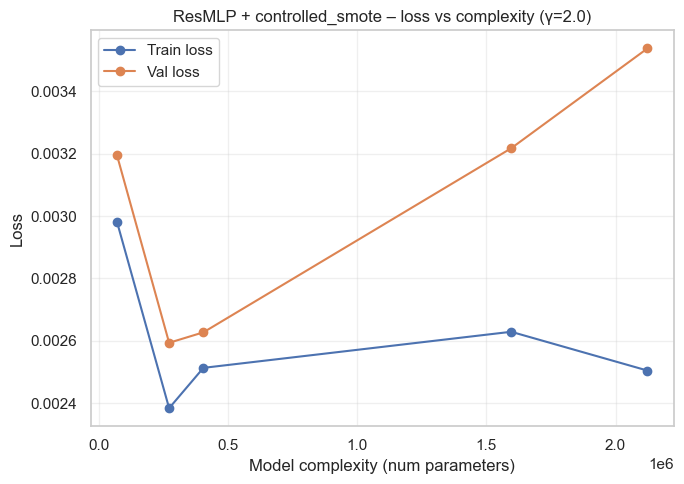

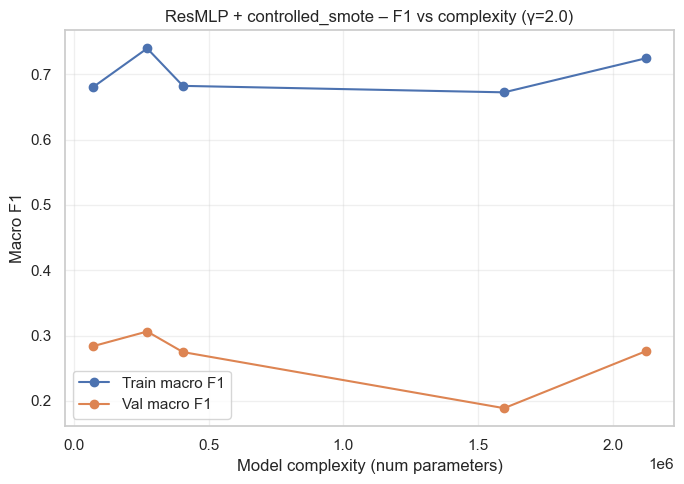

In [133]:
for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_focal_complexity_for_gamma(var_name, res_list, gamma=2.0)


In [134]:
def plot_resmlp_f1_vs_gamma_for_arch(variant_name, results_list, config_name):
    subset = [r for r in results_list if r["config_name"] == config_name]
    if not subset:
        print(f"No runs for {variant_name} with arch={config_name}")
        return

    subset = sorted(subset, key=lambda r: r["gamma"])

    gammas    = [r["gamma"] for r in subset]
    train_f1  = [r["history"]["train_macro_f1"][-1] for r in subset]
    val_f1    = [r["history"]["val_macro_f1"][-1]   for r in subset]
    train_loss = [r["history"]["train_loss"][-1] for r in subset]
    val_loss   = [r["history"]["val_loss"][-1]   for r in subset]

    # F1 vs gamma
    plt.figure(figsize=(7,5))
    plt.plot(gammas, train_f1, marker="o", label="Train macro F1")
    plt.plot(gammas, val_f1,   marker="o", label="Val macro F1")
    plt.xlabel("gamma (Focal Loss)")
    plt.ylabel("Macro F1")
    plt.title(f"ResMLP + {variant_name} – F1 vs γ (arch={config_name})")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Loss vs gamma (optional)
    plt.figure(figsize=(7,5))
    plt.plot(gammas, train_loss, marker="o", label="Train loss")
    plt.plot(gammas, val_loss,   marker="o", label="Val loss")
    plt.xlabel("gamma (Focal Loss)")
    plt.ylabel("Loss")
    plt.title(f"ResMLP + {variant_name} – loss vs γ (arch={config_name})")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()


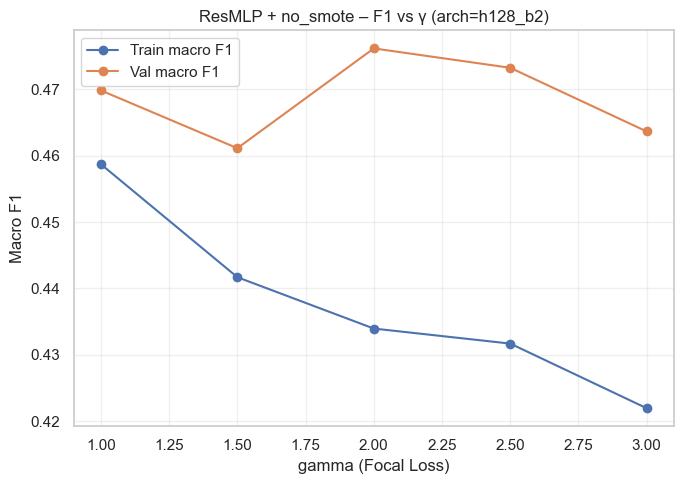

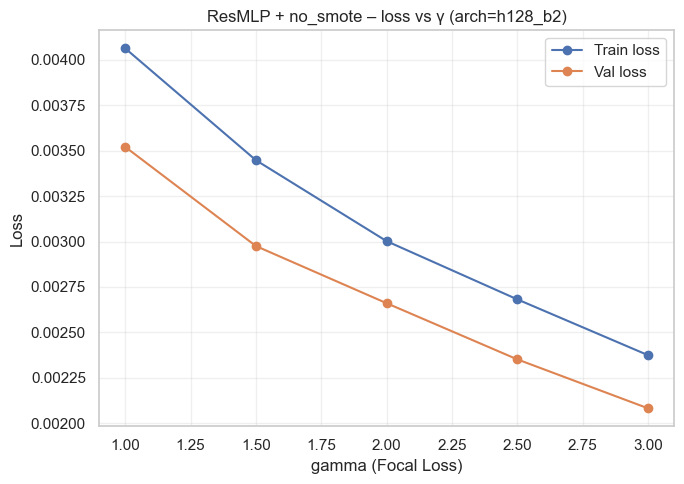

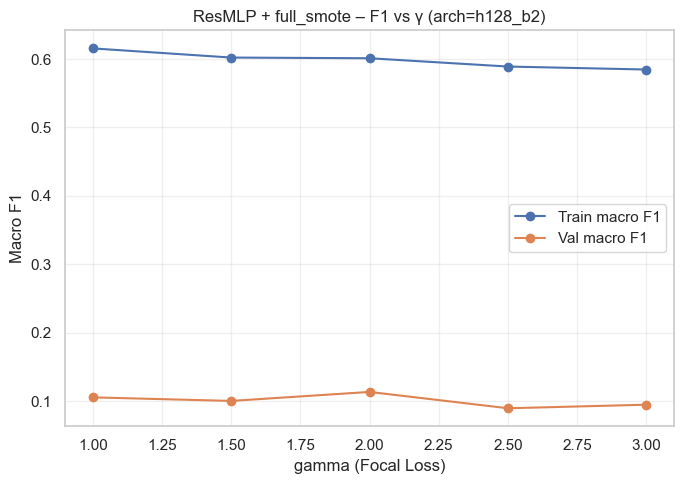

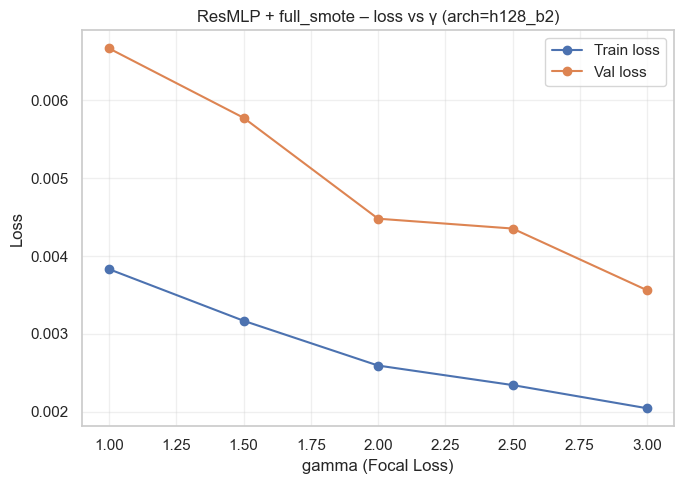

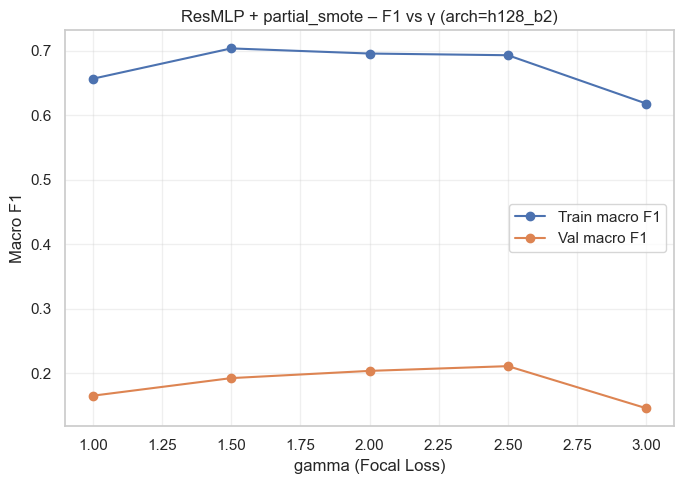

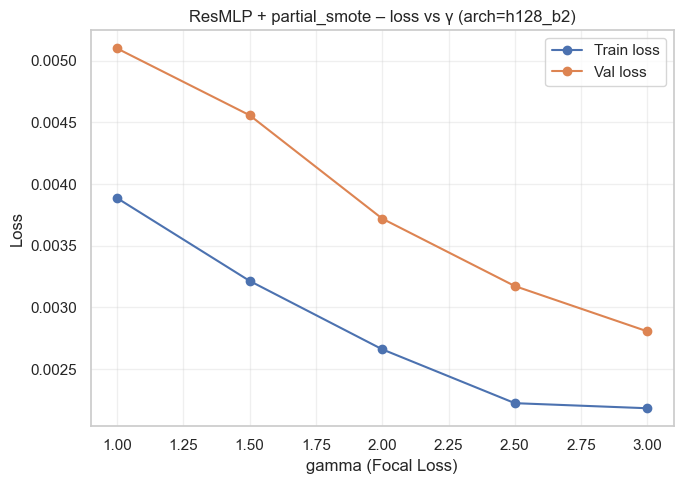

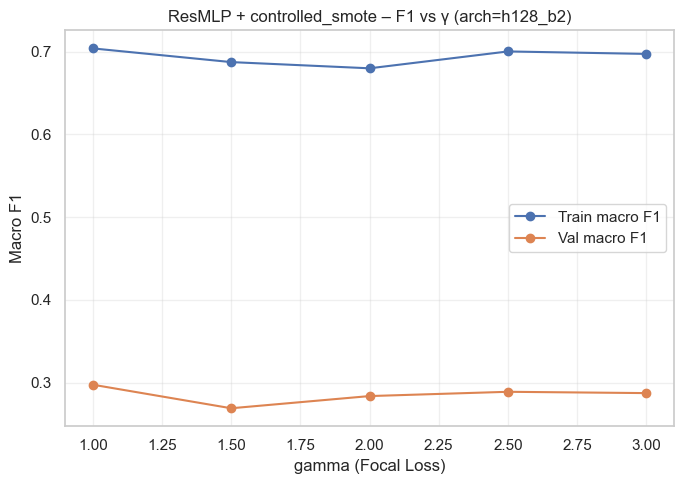

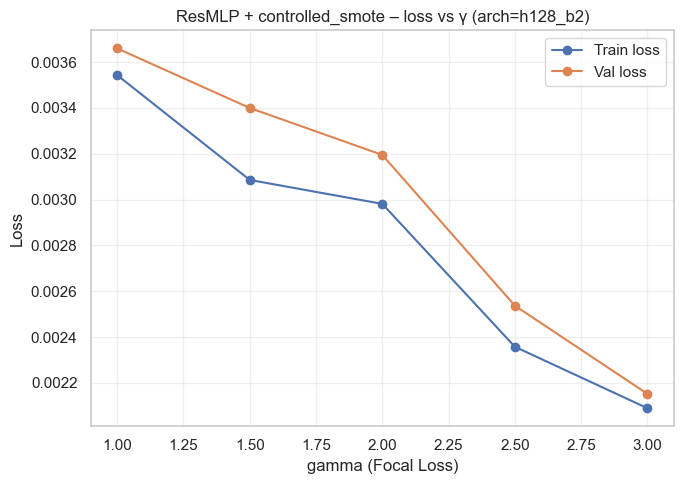

In [136]:
for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_f1_vs_gamma_for_arch(var_name, res_list, config_name="h128_b2")


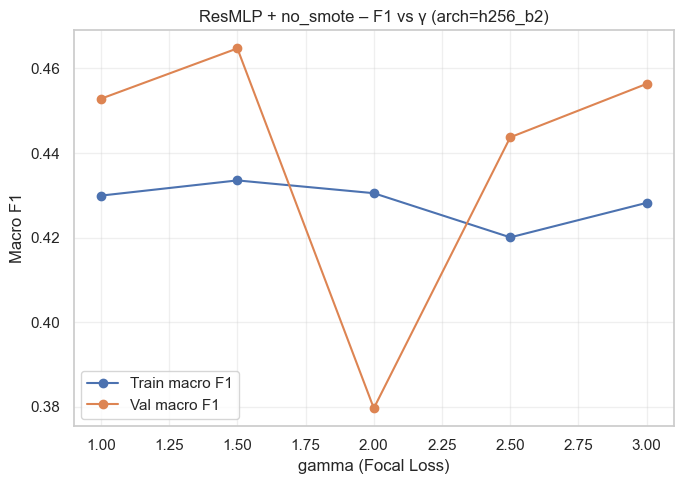

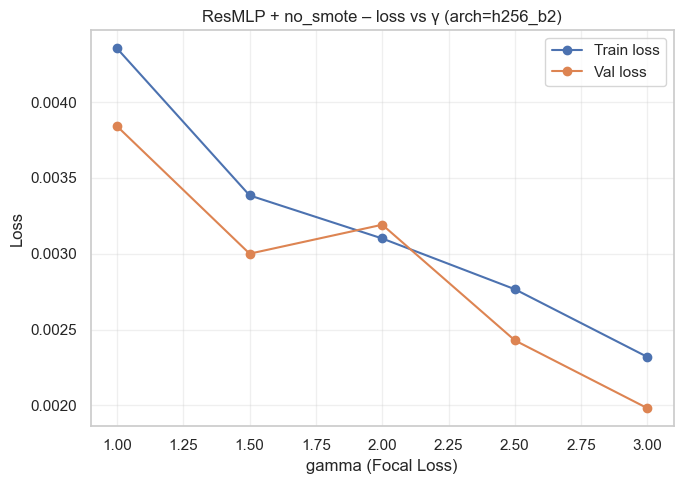

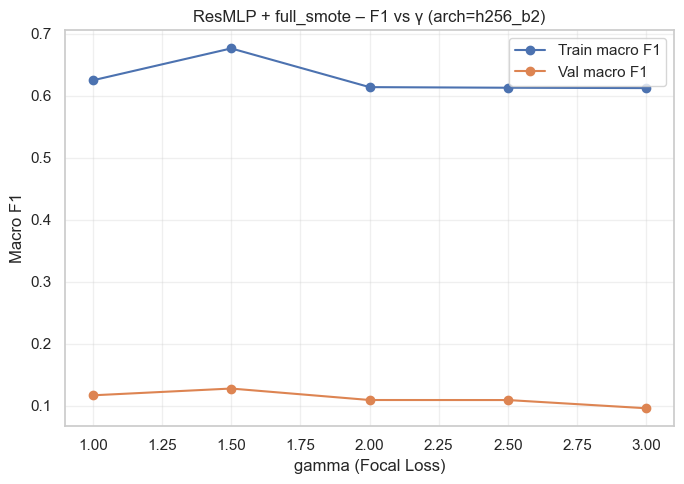

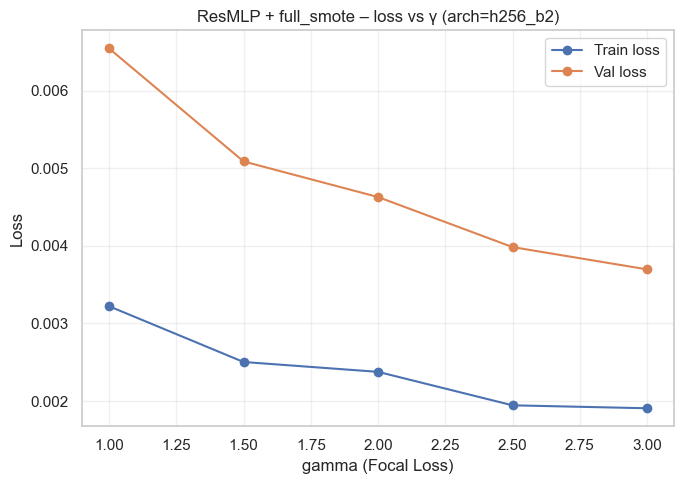

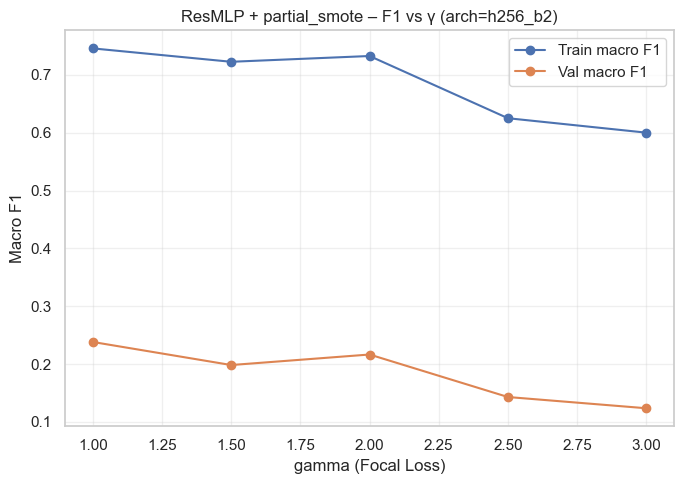

...

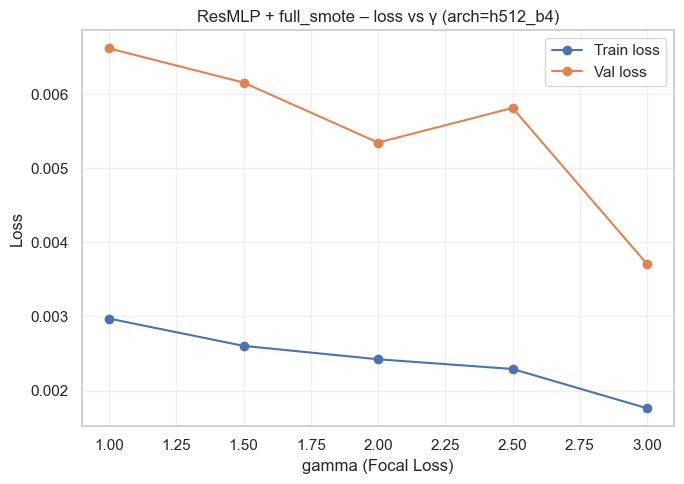

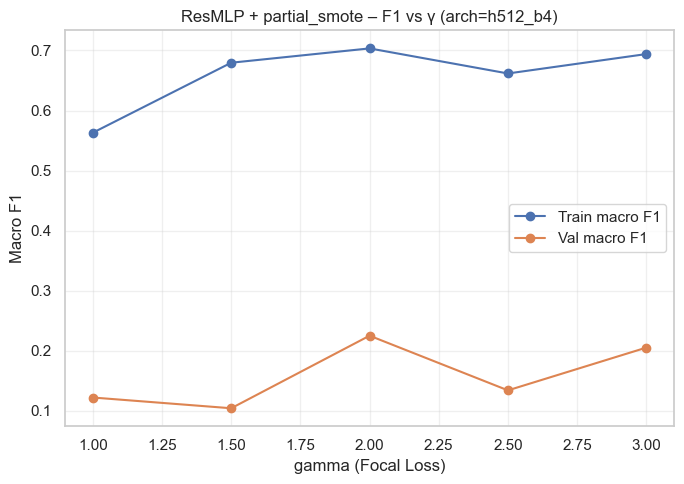

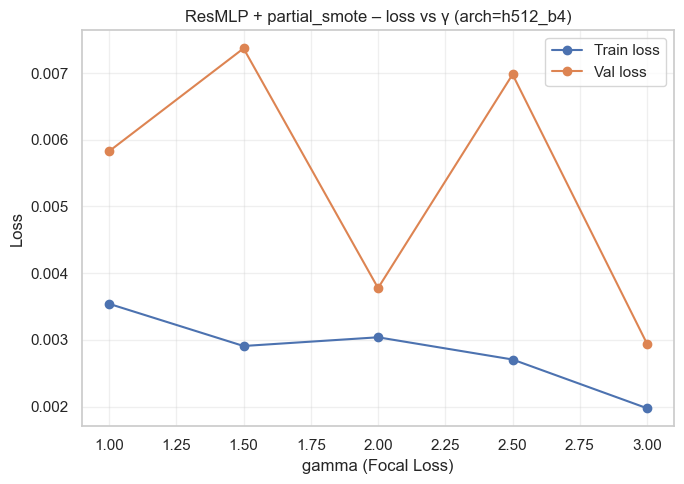

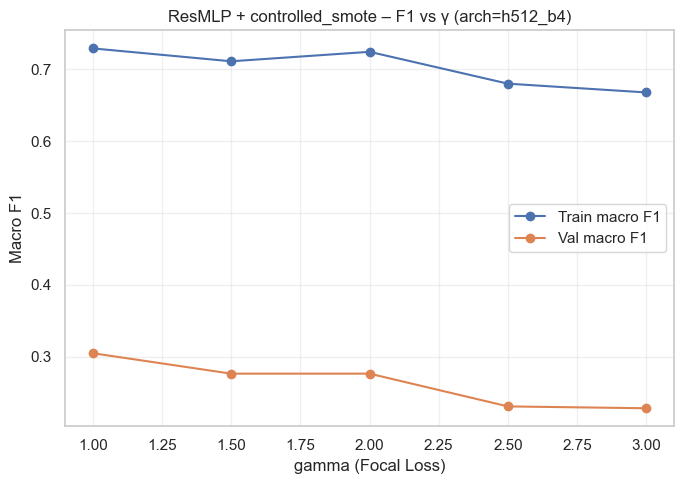

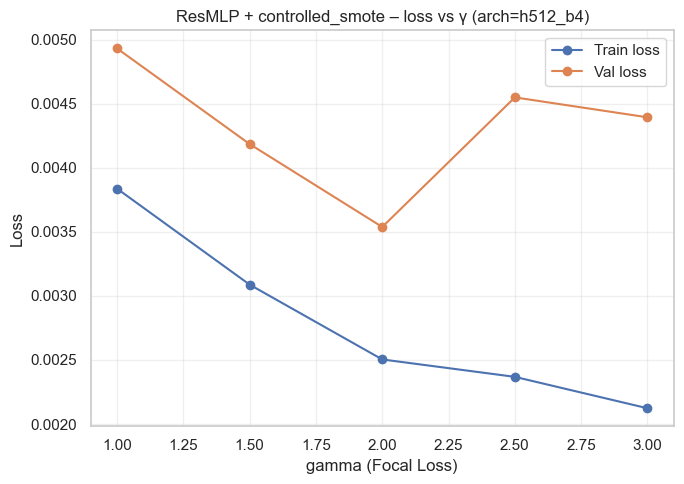

In [137]:
for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_f1_vs_gamma_for_arch(var_name, res_list, config_name="h256_b2")


for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_f1_vs_gamma_for_arch(var_name, res_list, config_name="h256_b3")

for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_f1_vs_gamma_for_arch(var_name, res_list, config_name="h512_b3")

for var_name, res_list in res_smote_focal_gamma_results.items():
    plot_resmlp_f1_vs_gamma_for_arch(var_name, res_list, config_name="h512_b4")


In [138]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import torch.nn as nn

class_names = ["0", "C", "M", "X"]

best_res_focal_runs = []  # summary list

criterion_test = nn.CrossEntropyLoss(weight=class_weights_ce)

for variant_name, runs in res_smote_focal_gamma_results.items():
    # best by validation macro F1
    best_run = max(runs, key=lambda r: r["best_val_f1"])
    model = best_run["model"].to(device)
    model.eval()

    # evaluate on test set
    test_loss, test_acc, test_f1, y_true_test, y_pred_test = run_epoch(
        model, test_loader, optimizer=None, criterion=criterion_test, train=False
    )

    best_run["test_loss"] = test_loss
    best_run["test_acc"] = test_acc
    best_run["test_f1"] = test_f1
    best_run["y_true_test"] = y_true_test
    best_run["y_pred_test"] = y_pred_test

    best_res_focal_runs.append({
        "variant": variant_name,
        "config_name": best_run["config_name"],
        "hidden_dim": best_run["hidden_dim"],
        "num_blocks": best_run["num_blocks"],
        "gamma": best_run["gamma"],
        "val_macro_f1": best_run["best_val_f1"],
        "test_macro_f1": test_f1,
        "test_acc": test_acc,
        "num_params": best_run["num_params"],
    })


In [139]:
summary_df = pd.DataFrame(best_res_focal_runs)
print("\n=== ResMLP + SMOTE + Focal – Best configs per variant ===")
print(summary_df)



=== ResMLP + SMOTE + Focal – Best configs per variant ===
            variant config_name  hidden_dim  num_blocks  gamma  val_macro_f1  \
0          no_smote     h256_b2         256           2    1.0      0.517798   
1        full_smote     h512_b3         512           3    1.0      0.190331   
2     partial_smote     h256_b2         256           2    2.0      0.384060   
3  controlled_smote     h256_b2         256           2    2.0      0.373275   

   test_macro_f1  test_acc  num_params  
0       0.458901  0.752536      272132  
1       0.140527  0.155038     1595908  
2       0.219229  0.282418      272132  
3       0.311504  0.419458      272132  


In [140]:
summary_df = summary_df.sort_values(by="test_macro_f1", ascending=False)
print("\nSorted by test macro F1:")
print(summary_df)



Sorted by test macro F1:
            variant config_name  hidden_dim  num_blocks  gamma  val_macro_f1  \
0          no_smote     h256_b2         256           2    1.0      0.517798   
3  controlled_smote     h256_b2         256           2    2.0      0.373275   
2     partial_smote     h256_b2         256           2    2.0      0.384060   
1        full_smote     h512_b3         512           3    1.0      0.190331   

   test_macro_f1  test_acc  num_params  
0       0.458901  0.752536      272132  
3       0.311504  0.419458      272132  
2       0.219229  0.282418      272132  
1       0.140527  0.155038     1595908  


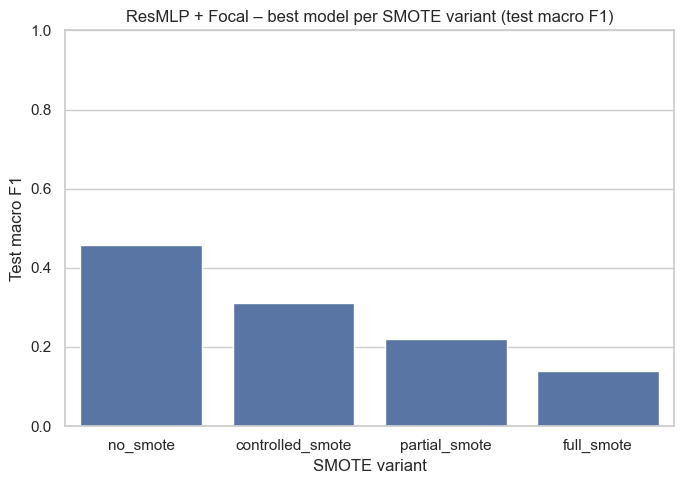

In [141]:
plt.figure(figsize=(7,5))
sns.barplot(
    data=summary_df,
    x="variant",
    y="test_macro_f1"
)
plt.xlabel("SMOTE variant")
plt.ylabel("Test macro F1")
plt.title("ResMLP + Focal – best model per SMOTE variant (test macro F1)")
plt.ylim(0, 1.0)
plt.tight_layout()
plt.show()


In [142]:
for row in best_res_focal_runs:
    variant_name = row["variant"]
    config_name  = row["config_name"]
    gamma        = row["gamma"]

    # retrieve predictions saved above
    y_true_test = res_smote_focal_gamma_results[variant_name]
    # easier to fetch from the stored best_run dict:
    # but we already kept them inside best_run earlier, so better use that:




Variant: no_smote
Config:  h256_b2 (hidden=256, blocks=2)
Gamma:   1.0
Val macro F1:  0.5178
Test macro F1: 0.4589
Test accuracy: 0.7525

Classification report (test):
              precision    recall  f1-score   support

           0      0.910     0.837     0.872     11421
           C      0.389     0.352     0.369      2546
           M      0.278     0.866     0.421       387
           X      0.095     1.000     0.173        36

    accuracy                          0.753     14390
   macro avg      0.418     0.764     0.459     14390
weighted avg      0.799     0.753     0.769     14390



<Figure size 500x400 with 0 Axes>

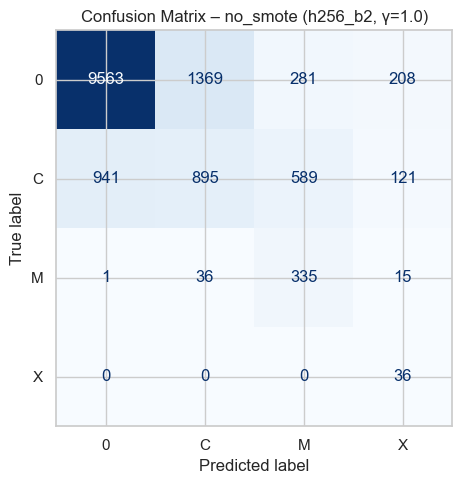


Variant: full_smote
Config:  h512_b3 (hidden=512, blocks=3)
Gamma:   1.0
Val macro F1:  0.1903
Test macro F1: 0.1405
Test accuracy: 0.1550

Classification report (test):
              precision    recall  f1-score   support

           0      0.998     0.054     0.103     11421
           C      0.130     0.478     0.204      2546
           M      0.109     0.933     0.196       387
           X      0.030     0.944     0.059        36

    accuracy                          0.155     14390
   macro avg      0.317     0.602     0.141     14390
weighted avg      0.818     0.155     0.123     14390



<Figure size 500x400 with 0 Axes>

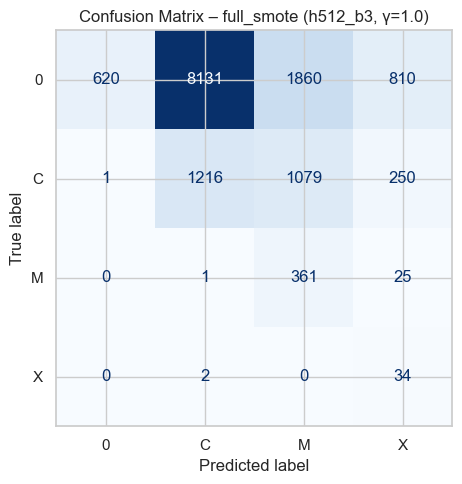


Variant: partial_smote
Config:  h256_b2 (hidden=256, blocks=2)
Gamma:   2.0
Val macro F1:  0.3841
Test macro F1: 0.2192
Test accuracy: 0.2824

Classification report (test):
              precision    recall  f1-score   support

           0      0.994     0.196     0.328     11421
           C      0.177     0.553     0.268      2546
           M      0.121     0.969     0.216       387
           X      0.034     1.000     0.065        36

    accuracy                          0.282     14390
   macro avg      0.331     0.680     0.219     14390
weighted avg      0.823     0.282     0.314     14390



<Figure size 500x400 with 0 Axes>

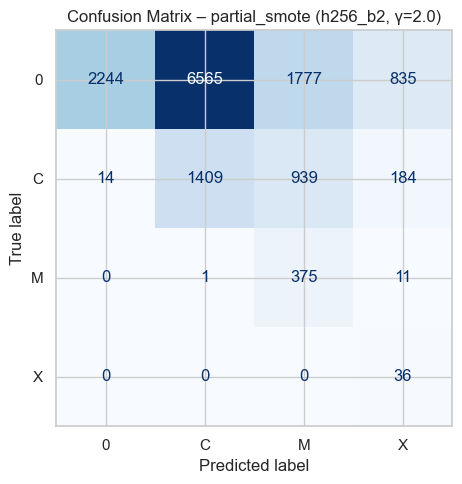


Variant: controlled_smote
Config:  h256_b2 (hidden=256, blocks=2)
Gamma:   2.0
Val macro F1:  0.3733
Test macro F1: 0.3115
Test accuracy: 0.4195

Classification report (test):
              precision    recall  f1-score   support

           0      0.983     0.349     0.516     11421
           C      0.216     0.639     0.323      2546
           M      0.179     0.992     0.303       387
           X      0.055     1.000     0.105        36

    accuracy                          0.419     14390
   macro avg      0.358     0.745     0.312     14390
weighted avg      0.824     0.419     0.475     14390



<Figure size 500x400 with 0 Axes>

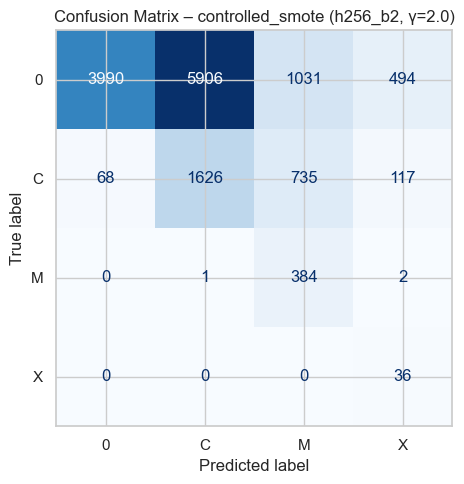

In [143]:
for variant_name, runs in res_smote_focal_gamma_results.items():
    best_run = max(runs, key=lambda r: r["best_val_f1"])
    model = best_run["model"]

    # if you didn't store test preds in best_run, recompute here:
    test_loss, test_acc, test_f1, y_true_test, y_pred_test = run_epoch(
        model, test_loader, optimizer=None, criterion=criterion_test, train=False
    )

    print("\n=====================================")
    print(f"Variant: {variant_name}")
    print(f"Config:  {best_run['config_name']} "
          f"(hidden={best_run['hidden_dim']}, blocks={best_run['num_blocks']})")
    print(f"Gamma:   {best_run['gamma']}")
    print(f"Val macro F1:  {best_run['best_val_f1']:.4f}")
    print(f"Test macro F1: {test_f1:.4f}")
    print(f"Test accuracy: {test_acc:.4f}")

    # classification report
    print("\nClassification report (test):")
    print(classification_report(y_true_test, y_pred_test, target_names=class_names, digits=3))

    # confusion matrix
    cm = confusion_matrix(y_true_test, y_pred_test)
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    plt.figure(figsize=(5, 4))
    disp.plot(cmap="Blues", values_format="d", colorbar=False)
    plt.title(f"Confusion Matrix – {variant_name} "
              f"({best_run['config_name']}, γ={best_run['gamma']})")
    plt.tight_layout()
    plt.show()
